# PROBLEM STATEMENT:
--------------------------
As an analyst at ABC Estate Wines, we are presented with historical data encompassing the sales of different types of wines throughout the 20th century. These datasets originate from the same company but represent sales figures for distinct wine varieties. Our objective is to delve into the data, analyze trends, patterns, and factors influencing wine sales over the course of the century. By leveraging data analytics and forecasting techniques, we aim to gain actionable insights that can inform strategic decision-making and optimize sales strategies for the future.

--------------------------------
## OBJECTIVE:
The primary objective of this project is to analyze and forecast wine sales trends for the 20th century based on historical data provided by ABC Estate Wines. We aim to equip ABC Estate Wines with the necessary insights and foresight to enhance sales performance, capitalize on emerging market opportunities, and maintain a competitive edge in the wine industry.

In [4]:
# supress warnings
import warnings
warnings.filterwarnings('ignore')

# For Bold printing
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

#Importing Libraries
import numpy as np # Numerical libraries
import pandas as pd # to handle data in form of rows and columns

# For Visualisation-import ploting libraries
import matplotlib.pyplot as plt
%matplotlib inline 
#importing seaborn for statistical plots
import seaborn as sns
# The following code is to set the subsequent figure sizes
from pylab import rcParams
rcParams['figure.figsize'] = 14, 7

# To calculate accuracy measures
from sklearn import metrics

In [5]:
rose_df = pd.read_csv("Rose.csv")
spark_df = pd.read_csv("Sparkling.csv")

### FOR ROSE WINE DATASET:

In [6]:
rose_df.head()

,YearMonth,Rose
0,1980-01,112.0
1,1980-02,118.0
2,1980-03,129.0
3,1980-04,99.0
4,1980-05,116.0


In [7]:
rose_df.tail()

,YearMonth,Rose
182,1995-03,45.0
183,1995-04,52.0
184,1995-05,28.0
185,1995-06,40.0
186,1995-07,62.0


In [8]:
rose_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   YearMonth  187 non-null    object 
 1   Rose       185 non-null    float64
dtypes: float64(1), object(1)
memory usage: 3.1+ KB


In [9]:
Dates = pd.date_range(start='1/1/1980', end='8/1/1995', freq='M')
Dates

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='ME')

In [10]:
rose_df['Time_stamp'] = pd.DataFrame(Dates, columns=['Month'])
rose_df.head()

,YearMonth,Rose,Time_stamp
0,1980-01,112.0,1980-01-31
1,1980-02,118.0,1980-02-29
2,1980-03,129.0,1980-03-31
3,1980-04,99.0,1980-04-30
4,1980-05,116.0,1980-05-31


In [11]:
rose_df.set_index('Time_stamp', inplace=True)
rose_df.drop(['YearMonth'], axis=1, inplace=True)
rose_df.head()

,Rose
Time_stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0


In [12]:
rose = pd.read_csv('Rose.csv', header = 0, index_col = 0, parse_dates = True)
df_rose = rose.squeeze("columns")
printmd('**First 5 rows for Rose Wine :**')
df_rose.head()

**First 5 rows for Rose Wine :**

YearMonth
1980-01-01    112.0
1980-02-01    118.0
1980-03-01    129.0
1980-04-01     99.0
1980-05-01    116.0
Name: Rose, dtype: float64

In [13]:
printmd('**Last 5 rows for Rose Wine :**')
df_rose.tail()

**Last 5 rows for Rose Wine :**

YearMonth
1995-03-01    45.0
1995-04-01    52.0
1995-05-01    28.0
1995-06-01    40.0
1995-07-01    62.0
Name: Rose, dtype: float64

In [14]:
printmd('**The number of Null values for Rose Wine dataset:**')
print(df_rose.isnull().sum())

**The number of Null values for Rose Wine dataset:**

2


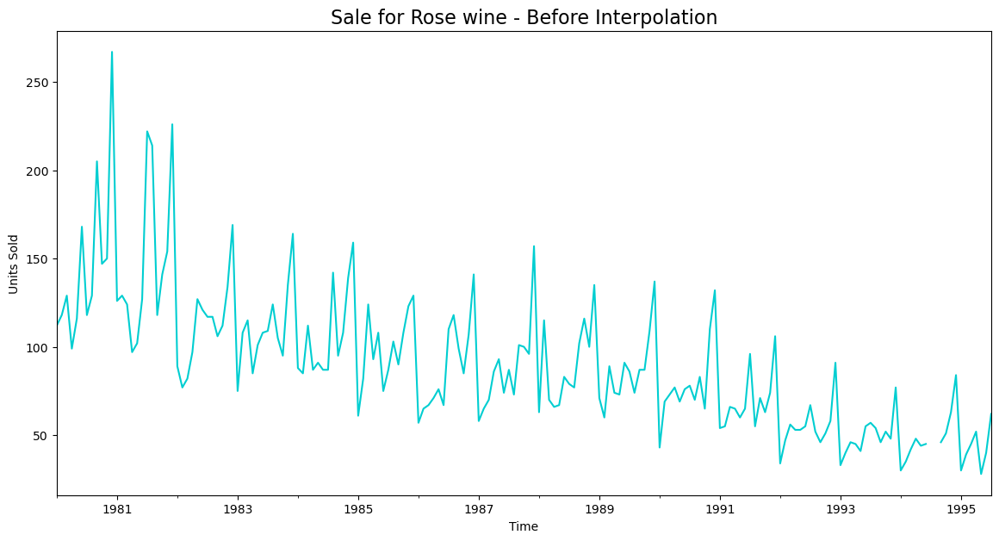

In [15]:
df_rose.plot(color='darkturquoise')
plt.title('Sale for Rose wine - Before Interpolation', fontsize =16)
plt.xlabel('Time')
plt.ylabel('Units Sold')
plt.show()

In [16]:
df_rose = df_rose.interpolate(method = 'polynomial', order = 2)

In [754]:
printmd('**The number of Null values for Rose Wine dataset:**')
print(df_rose.isnull().sum())

**The number of Null values for Rose Wine dataset:**

Rose    0
dtype: int64


**Sales Data of Rose Wines after missing value treatment:**

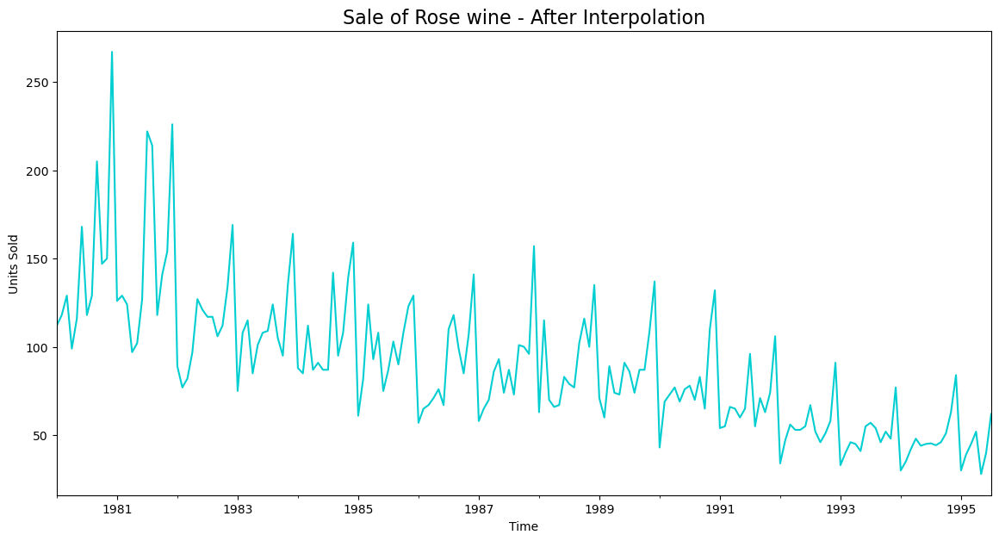

In [17]:
printmd('**Sales Data of Rose Wines after missing value treatment:**')
df_rose.plot(color='darkturquoise')
plt.title('Sale of Rose wine - After Interpolation', fontsize =16)
plt.xlabel('Time')
plt.ylabel('Units Sold')
plt.show()

In [18]:
df_rose.describe().T

count    187.000000
mean      89.907184
std       39.246679
min       28.000000
25%       62.500000
50%       85.000000
75%      111.000000
max      267.000000
Name: Rose, dtype: float64

**Yearly Boxplot for Rose Dataset:**

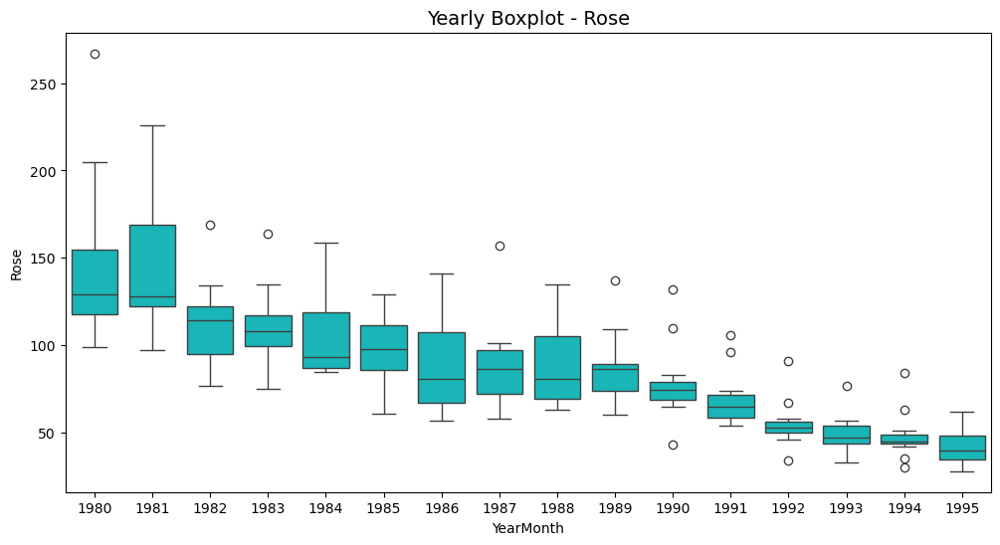

In [19]:
printmd('**Yearly Boxplot for Rose Dataset:**')
plt.figure(figsize = (12, 6))
sns.boxplot(x = df_rose.index.year,y = df_rose, color = 'darkturquoise')
plt.title('Yearly Boxplot - Rose', fontsize=14)
plt.show()

**Monthly Boxplot for all the years for Rose Dataset:**

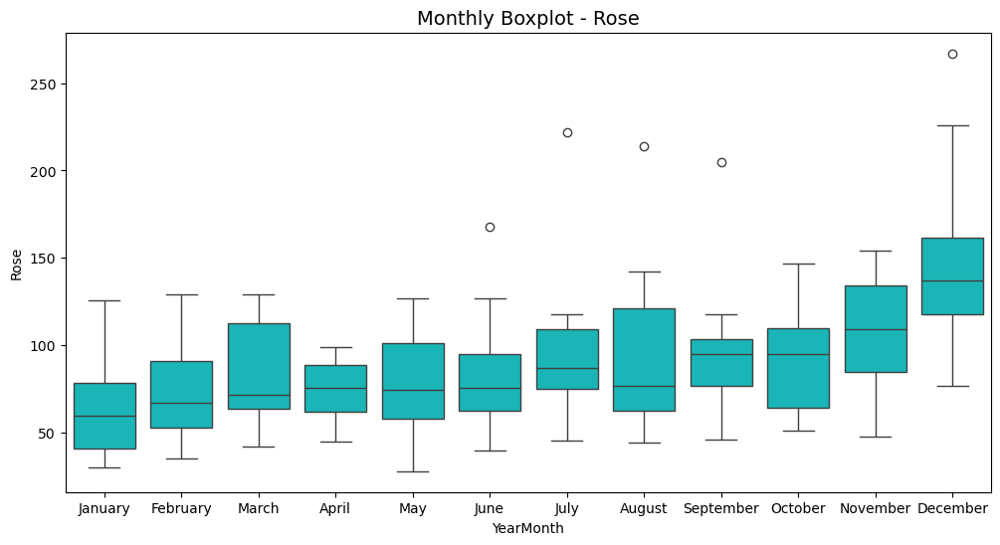

In [20]:
printmd('**Monthly Boxplot for all the years for Rose Dataset:**')
plt.figure(figsize = (12, 6))
sns.boxplot(x = df_rose.index.month_name(),y =df_rose, color='darkturquoise')
plt.title('Monthly Boxplot - Rose', fontsize=14)
plt.show()

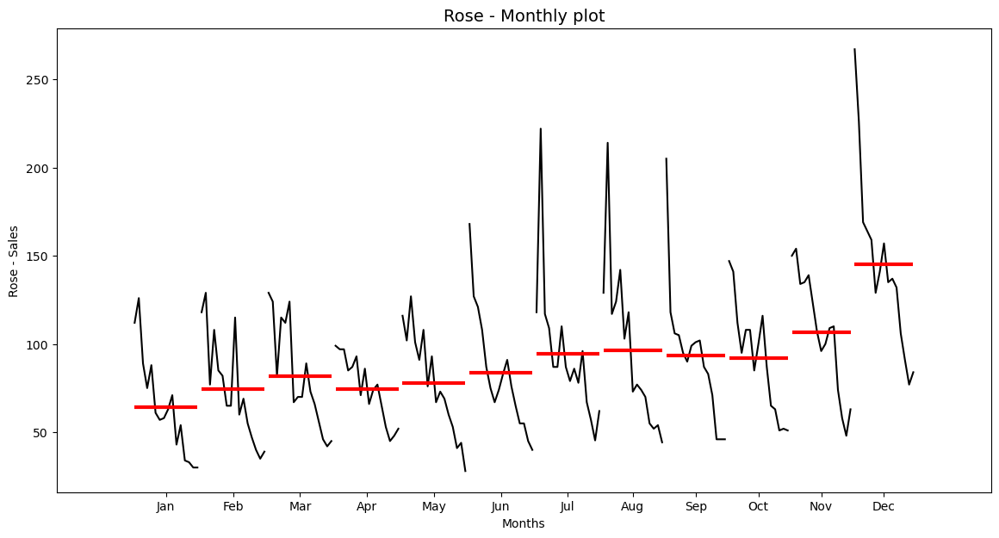

In [21]:
from statsmodels.graphics.tsaplots import month_plot
month_plot(df_rose,ylabel='Rose - Sales')
plt.xlabel('Months')
plt.title('Rose - Monthly plot', fontsize = 14)
plt.show()

In [22]:
monthly_sales_across_years_rose = pd.pivot_table(pd.DataFrame(df_rose), columns = df_rose.index.month, 
                                                      index = df_rose.index.year)
monthly_sales_across_years_rose

Rose                                                            \
YearMonth     1      2      3     4      5      6           7           8    
YearMonth                                                                    
1980       112.0  118.0  129.0  99.0  116.0  168.0  118.000000  129.000000   
1981       126.0  129.0  124.0  97.0  102.0  127.0  222.000000  214.000000   
1982        89.0   77.0   82.0  97.0  127.0  121.0  117.000000  117.000000   
1983        75.0  108.0  115.0  85.0  101.0  108.0  109.000000  124.000000   
1984        88.0   85.0  112.0  87.0   91.0   87.0   87.000000  142.000000   
1985        61.0   82.0  124.0  93.0  108.0   75.0   87.000000  103.000000   
1986        57.0   65.0   67.0  71.0   76.0   67.0  110.000000  118.000000   
1987        58.0   65.0   70.0  86.0   93.0   74.0   87.000000   73.000000   
1988        63.0  115.0   70.0  66.0   67.0   83.0   79.000000   77.000000   
1989        71.0   60.0   89.0  74.0   73.0   91.0   86.000000   74.000000   
1990        43.0   69.0   73.0  77.0   69.0   76.0   78.000000   70.000000   
1991        54.0   55.0   66.0  65.0   60.0   65.0   96.000000   55.000000   
1992        34.0   47.0   56.0  53.0   53.0   55.0   67.000000   52.000000   
1993        33.0   40.0   46.0  45.0   41.0   55.0   57.000000   54.000000   
1994        30.0   35.0   42.0  48.0   44.0   45.0   45.364189   44.279246   
1995        30.0   39.0   45.0  52.0   28.0   40.0   62.000000         NaN   

                                       
YearMonth     9      10     11     12  
YearMonth                              
1980       205.0  147.0  150.0  267.0  
1981       118.0  141.0  154.0  226.0  
1982       106.0  112.0  134.0  169.0  
1983       105.0   95.0  135.0  164.0  
1984        95.0  108.0  139.0  159.0  
1985        90.0  108.0  123.0  129.0  
1986        99.0   85.0  107.0  141.0  
1987       101.0  100.0   96.0  157.0  
1988       102.0  116.0  100.0  135.0  
1989        87.0   87.0  109.0  137.0  
1990        83.0   65.0  110.0  132.0  
1991        71.0   63.0   74.0  106.0  
1992        46.0   51.0   58.0   91.0  
1993        46.0   52.0   48.0   77.0  
1994        46.0   51.0   63.0   84.0  
1995         NaN    NaN    NaN    NaN

**Monthly Wine sales across years for Rose:**

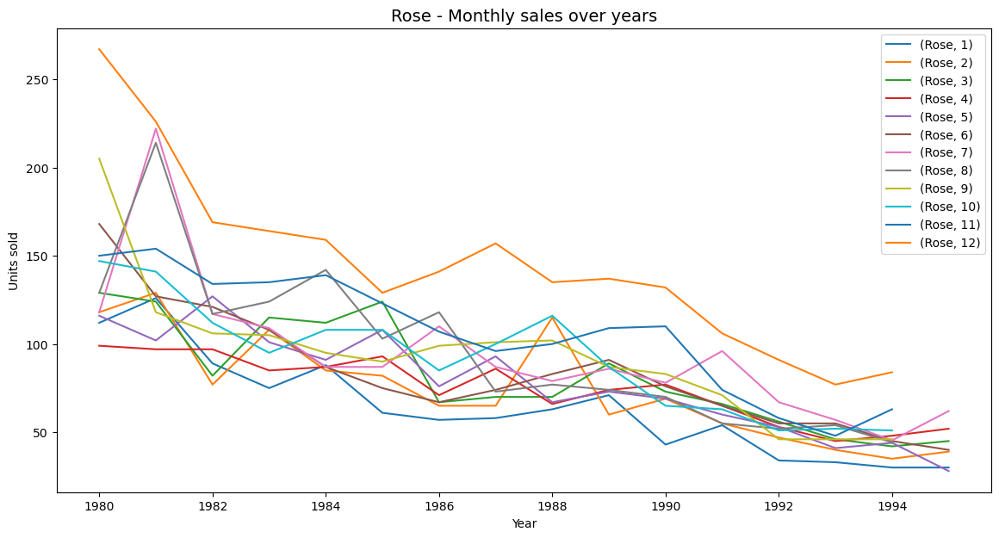

In [23]:
printmd('**Monthly Wine sales across years for Rose:**')
monthly_sales_across_years_rose.plot()
plt.legend(loc='best')
plt.ylabel('Units sold')
plt.xlabel('Year')
plt.title('Rose - Monthly sales over years', fontsize=14)
plt.show()

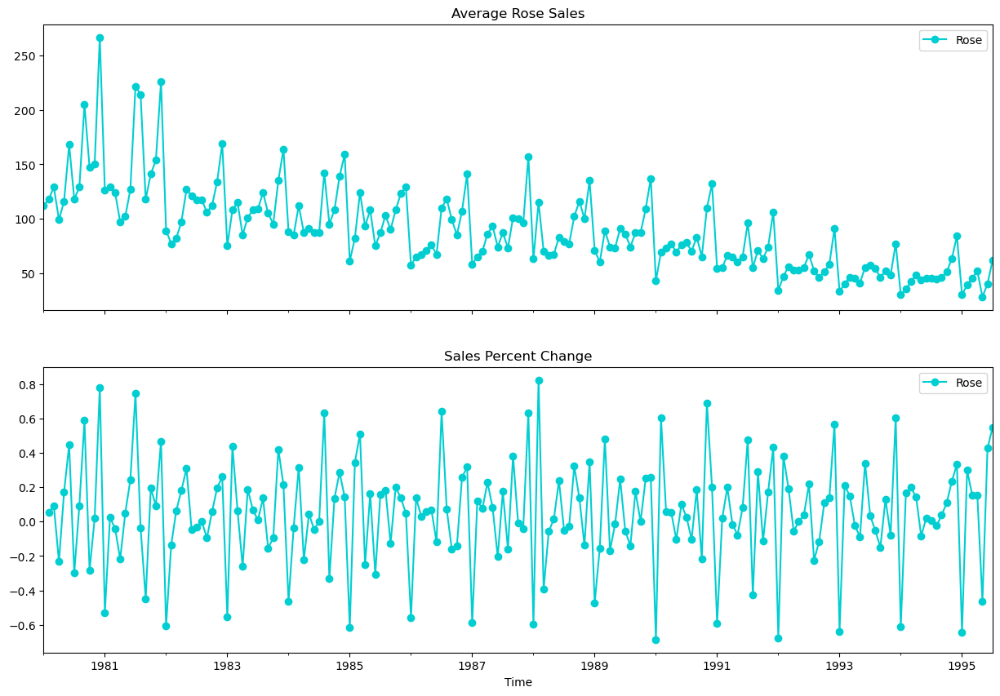

In [24]:
average_rose    = df_rose.groupby(df_rose.index).mean()
pct_change_rose = df_rose.groupby(df_rose.index).sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,10))
# plot average Rose sales over time(year-month)
ax1 = average_rose.plot(legend=True,ax=axis1,marker='o',title="Average Rose Sales", color = 'darkturquoise')
# plot precent change for Sales over time(year-month)
ax2 = pct_change_rose.plot(legend=True,ax=axis2,marker='o',color='darkturquoise',title="Sales Percent Change")
plt.xlabel('Time')
plt.legend(loc='best')
plt.show()

In [25]:
from statsmodels.tsa.seasonal import seasonal_decompose

**Decomposition of Rose Time Series with multiplicative Seasonality:**

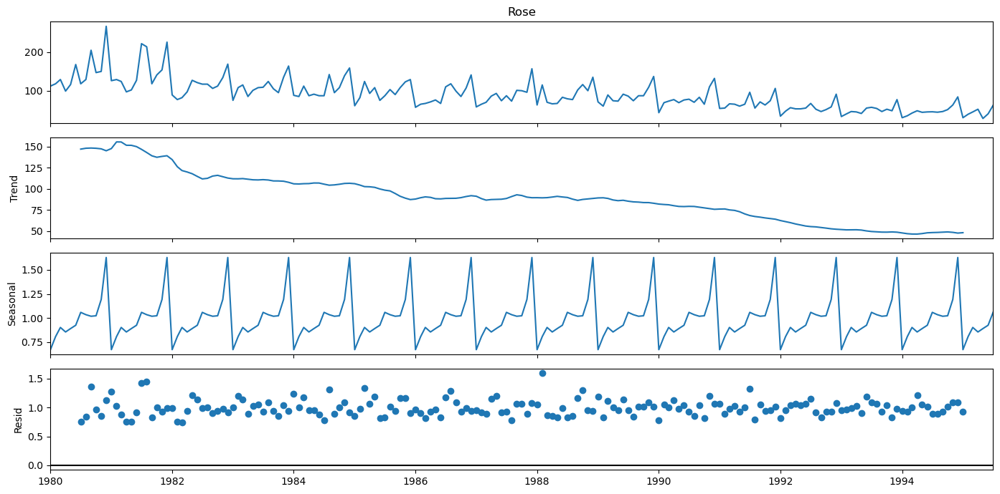

In [26]:
printmd('**Decomposition of Rose Time Series with multiplicative Seasonality:**')
decomposition_mul = seasonal_decompose(df_rose,model='multiplicative')
decomposition_mul.plot();

In [27]:
df_rose = pd.DataFrame(df_rose)
train_rose = df_rose[df_rose.index.year < 1991]
test_rose = df_rose[df_rose.index.year >= 1991]

In [28]:
print('Length of Train Data:', len(train_rose))
print('Length of Test Data:', len(test_rose))

Length of Train Data: 132
Length of Test Data: 55


In [29]:
print('First few rows of Training Data:','\n',train_rose.head(),'\n')
print('Last few rows of Training Data:','\n',train_rose.tail(),'\n')
print('First few rows of Test Data:','\n',test_rose.head(),'\n')
print('Last few rows of Test Data:','\n',test_rose.tail(),'\n')

First few rows of Training Data: 
              Rose
YearMonth        
1980-01-01  112.0
1980-02-01  118.0
1980-03-01  129.0
1980-04-01   99.0
1980-05-01  116.0 

Last few rows of Training Data: 
              Rose
YearMonth        
1990-08-01   70.0
1990-09-01   83.0
1990-10-01   65.0
1990-11-01  110.0
1990-12-01  132.0 

First few rows of Test Data: 
             Rose
YearMonth       
1991-01-01  54.0
1991-02-01  55.0
1991-03-01  66.0
1991-04-01  65.0
1991-05-01  60.0 

Last few rows of Test Data: 
             Rose
YearMonth       
1995-03-01  45.0
1995-04-01  52.0
1995-05-01  28.0
1995-06-01  40.0
1995-07-01  62.0 



In [30]:
print(train_rose.shape)
print(test_rose.shape)

(132, 1)
(55, 1)


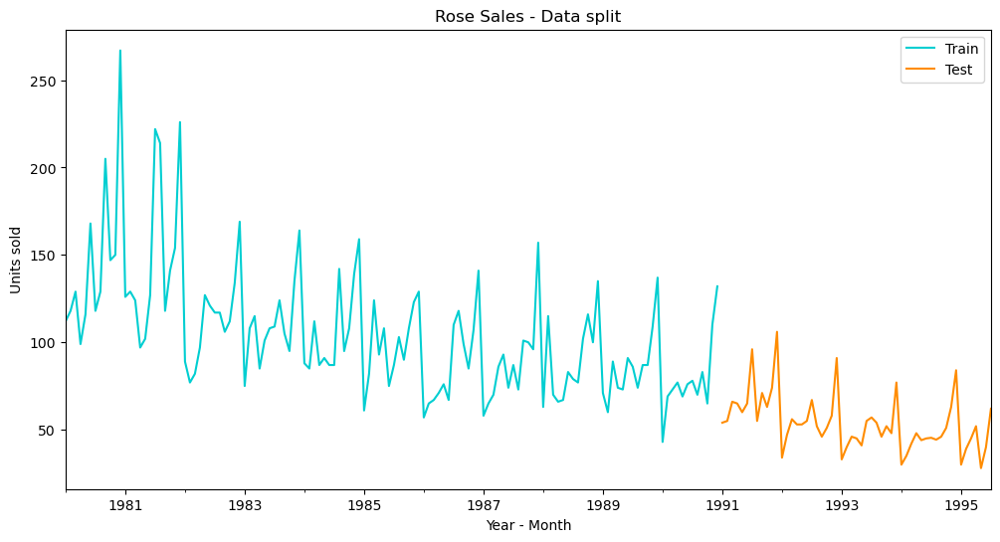

In [31]:
plt.figure(figsize = (12, 6))
train_rose['Rose'].plot(label = 'Train',color='darkturquoise')
test_rose['Rose'].plot(label = 'Test',color='darkorange')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Rose Sales - Data split', fontsize = 12)
plt.show;

In [32]:
train_time = [i+1 for i in range(len(train_rose))]
test_time = [i+133 for i in range(len(test_rose))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


### BUILDING MODELS WITH ORIGINAL DATA:

In [33]:
LinearRegression_train_rose = train_rose.copy()
LinearRegression_test_rose = test_rose.copy()

In [34]:
LinearRegression_train_rose['time'] = train_time
LinearRegression_test_rose['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train_rose.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train_rose.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test_rose.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test_rose.tail(),'\n')

First few rows of Training Data 
              Rose  time
YearMonth              
1980-01-01  112.0     1
1980-02-01  118.0     2
1980-03-01  129.0     3
1980-04-01   99.0     4
1980-05-01  116.0     5 

Last few rows of Training Data 
              Rose  time
YearMonth              
1990-08-01   70.0   128
1990-09-01   83.0   129
1990-10-01   65.0   130
1990-11-01  110.0   131
1990-12-01  132.0   132 

First few rows of Test Data 
             Rose  time
YearMonth             
1991-01-01  54.0   133
1991-02-01  55.0   134
1991-03-01  66.0   135
1991-04-01  65.0   136
1991-05-01  60.0   137 

Last few rows of Test Data 
             Rose  time
YearMonth             
1995-03-01  45.0   183
1995-04-01  52.0   184
1995-05-01  28.0   185
1995-06-01  40.0   186
1995-07-01  62.0   187 



#### LINEAR MODEL:

In [35]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(LinearRegression_train_rose[['time']],LinearRegression_train_rose['Rose'].values)

LinearRegression()

In [36]:
LinearRegression_train_rose['RegOnTime_rose'] = lr.predict(LinearRegression_train_rose[['time']])
LinearRegression_test_rose['RegOnTime_rose'] = lr.predict(LinearRegression_test_rose[['time']])

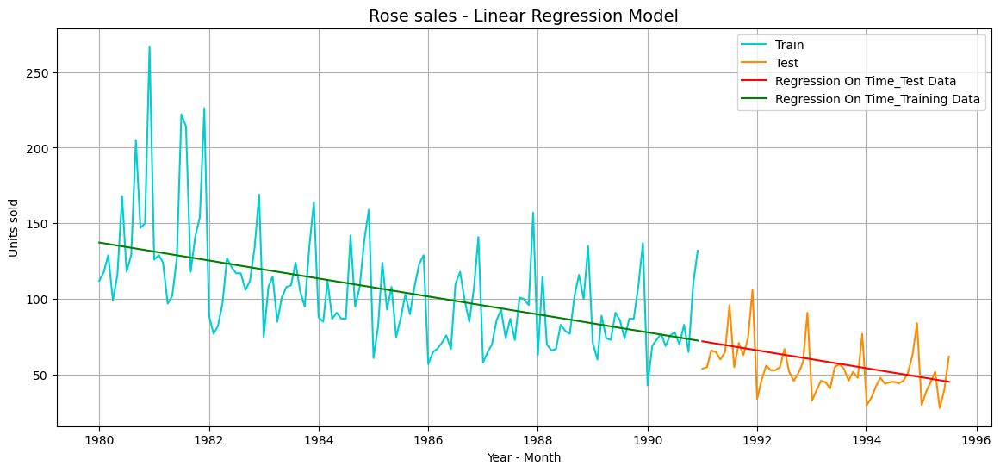

In [37]:
plt.figure(figsize=(14,6))
plt.plot( train_rose['Rose'], label='Train',color = 'darkturquoise')
plt.plot(test_rose['Rose'], label='Test',color = 'darkorange')
plt.plot(LinearRegression_test_rose['RegOnTime_rose'], label='Regression On Time_Test Data',color = 'red')
plt.plot(LinearRegression_train_rose['RegOnTime_rose'], label='Regression On Time_Training Data',color = 'green')
plt.title('Rose sales - Linear Regression Model', fontsize = 14)
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.grid();

In [38]:
rmse_reg = np.sqrt(metrics.mean_squared_error(test_rose['Rose'],LinearRegression_test_rose['RegOnTime_rose']))
print("For Regression On Time forecast on the Test Data, RMSE is %3.3f " %(rmse_reg))

For Regression On Time forecast on the Test Data, RMSE is 15.278 


In [39]:
rose_resultsDf = pd.DataFrame({'Test RMSE': [rmse_reg]},index=['RegressionOnTime'])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369


#### NAVIE MODEL:

In [40]:
NaiveModel_train = train_rose.copy()
NaiveModel_test = test_rose.copy()

In [41]:
NaiveModel_train['rose_naive'] = np.asarray(train_rose['Rose'])[len(np.asarray(train_rose['Rose']))-1]
NaiveModel_train['rose_naive'].head()

YearMonth
1980-01-01    132.0
1980-02-01    132.0
1980-03-01    132.0
1980-04-01    132.0
1980-05-01    132.0
Name: rose_naive, dtype: float64

In [42]:
NaiveModel_test['rose_naive'] = np.asarray(train_rose['Rose'])[len(np.asarray(train_rose['Rose']))-1]
NaiveModel_test['rose_naive'].head()

YearMonth
1991-01-01    132.0
1991-02-01    132.0
1991-03-01    132.0
1991-04-01    132.0
1991-05-01    132.0
Name: rose_naive, dtype: float64

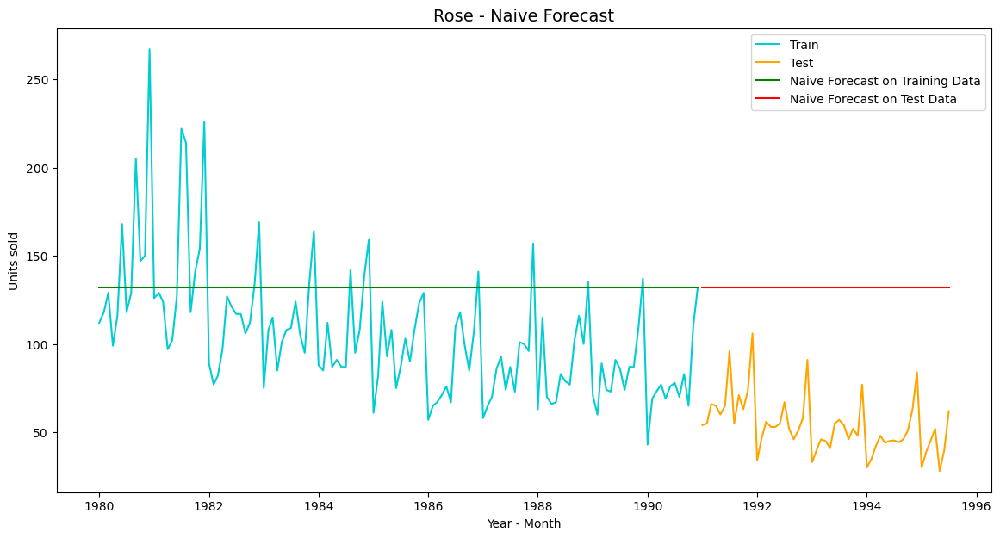

In [43]:
plt.plot(NaiveModel_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(test_rose['Rose'], label='Test', color = 'orange')
plt.plot(NaiveModel_train['rose_naive'], label='Naive Forecast on Training Data', color = 'green')
plt.plot(NaiveModel_test['rose_naive'], label='Naive Forecast on Test Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title("Rose - Naive Forecast", fontsize = 14)
plt.show();

In [44]:
rmse_naive = metrics.mean_squared_error(test_rose['Rose'],NaiveModel_test['rose_naive'],squared=False)
print("For Naive forecast on the Test Data, RMSE is %3.3f " %(rmse_naive))

For Naive forecast on the Test Data, RMSE is 79.746 


In [45]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_naive]},index=['NaiveModel'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_2])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697


#### SIMPLE AVERAGE:

In [46]:
SimpleAverage_train = train_rose.copy()
SimpleAverage_test = test_rose.copy()

In [47]:
SimpleAverage_train['rose_mean_forecast'] = train_rose['Rose'].mean()
SimpleAverage_train['rose_mean_forecast'].head()

YearMonth
1980-01-01    104.939394
1980-02-01    104.939394
1980-03-01    104.939394
1980-04-01    104.939394
1980-05-01    104.939394
Name: rose_mean_forecast, dtype: float64

In [48]:
SimpleAverage_test['rose_mean_forecast'] = test_rose['Rose'].mean()
SimpleAverage_test['rose_mean_forecast'].head()

YearMonth
1991-01-01    53.829881
1991-02-01    53.829881
1991-03-01    53.829881
1991-04-01    53.829881
1991-05-01    53.829881
Name: rose_mean_forecast, dtype: float64

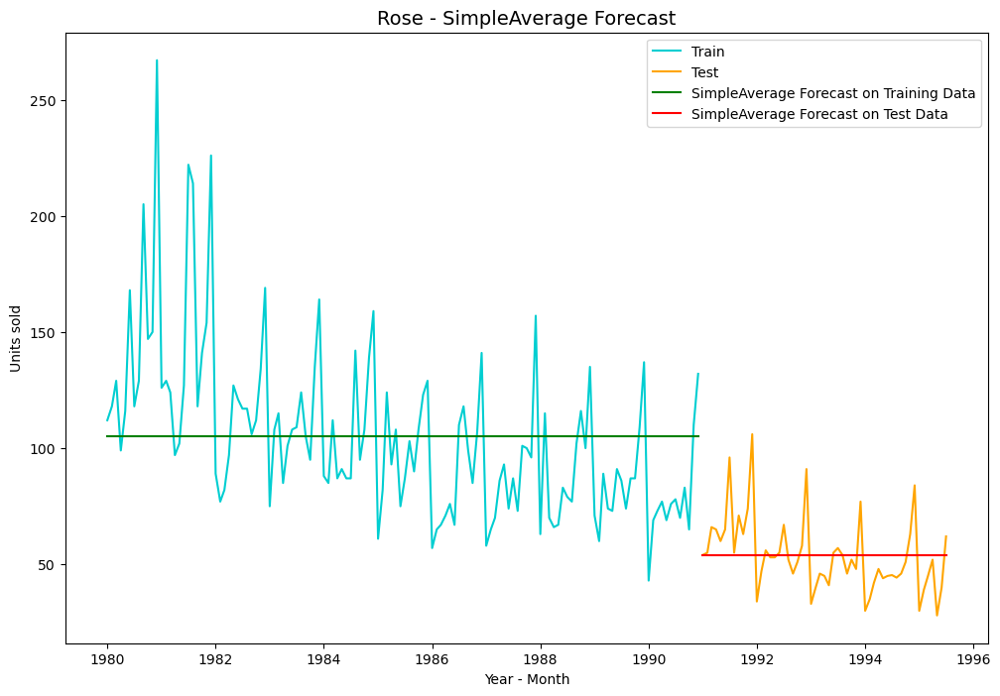

In [49]:
plt.figure(figsize=(12,8))
plt.plot(SimpleAverage_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(test_rose['Rose'], label='Test', color = 'orange')
plt.plot(SimpleAverage_train['rose_mean_forecast'], label='SimpleAverage Forecast on Training Data', color = 'green')
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SimpleAverage Forecast on Test Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title("Rose - SimpleAverage Forecast", fontsize=14)
plt.show()

In [50]:
rmse_simple_avg = metrics.mean_squared_error(test_rose['Rose'],SimpleAverage_test['rose_mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data, RMSE is %3.3f " %(rmse_simple_avg))

For Simple Average forecast on the Test Data, RMSE is 15.774 


In [51]:
resultsDf_3 = pd.DataFrame({'Test RMSE': [rmse_simple_avg]},index=['SimpleAverage'])
rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_3])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671


#### MOVING AVERAGES

In [52]:
MovingAverage = df_rose.copy()
MovingAverage.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [53]:
MovingAverage['Rose_Trailing_2'] = MovingAverage['Rose'].rolling(2).mean()
MovingAverage['Rose_Trailing_4'] = MovingAverage['Rose'].rolling(4).mean()
MovingAverage['Rose_Trailing_6'] = MovingAverage['Rose'].rolling(6).mean()
MovingAverage['Rose_Trailing_9'] = MovingAverage['Rose'].rolling(9).mean()

MovingAverage.head()

,Rose,Rose_Trailing_2,Rose_Trailing_4,Rose_Trailing_6,Rose_Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.5,NaN,NaN
1980-05-01,116.0,107.5,115.5,NaN,NaN


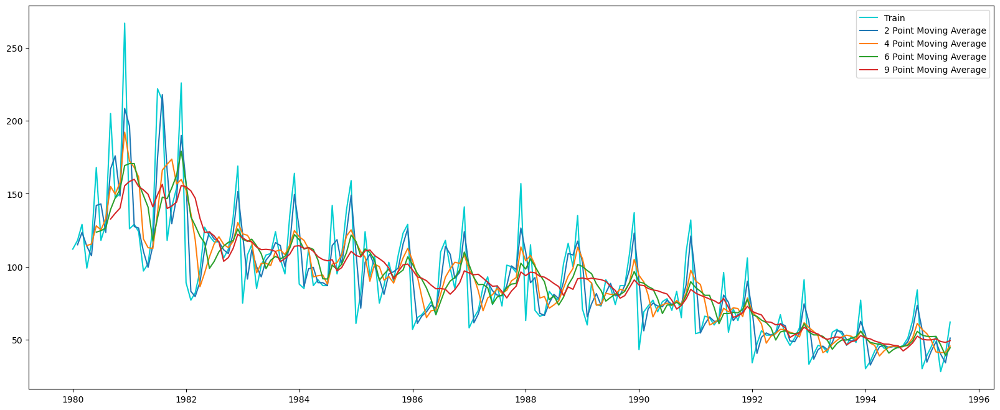

In [54]:
plt.figure(figsize=(20,8))
plt.plot(MovingAverage['Rose'], label='Train', color='darkturquoise')
plt.plot(MovingAverage['Rose_Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_9'],label = '9 Point Moving Average')
plt.legend(loc = 'best');

In [55]:
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

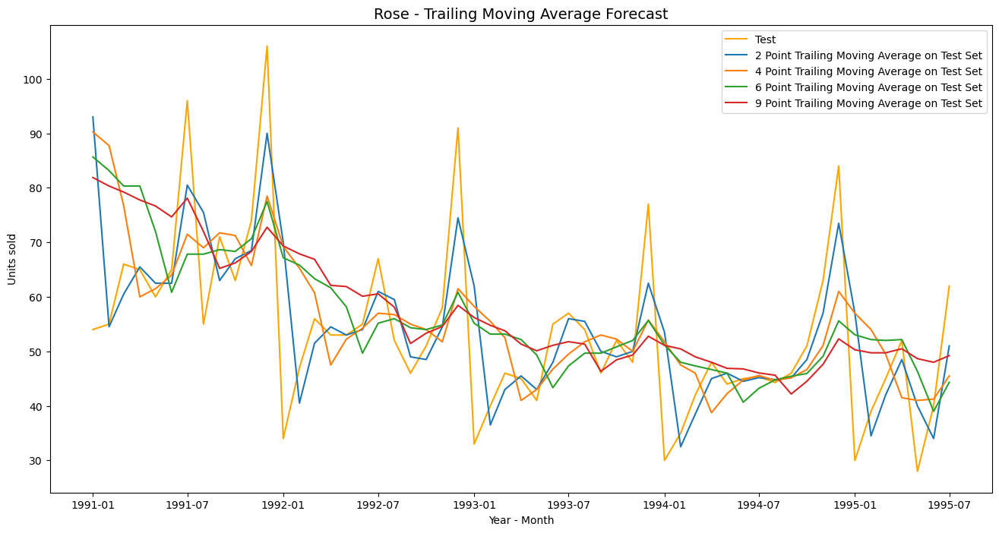

In [56]:
plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_test['Rose'], label='Test', color = 'orange')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')

plt.title("Rose - Trailing Moving Average Forecast", fontsize=14);

In [57]:
## Test Data - rmse_rose --> 2 point Rose_Trailing MA

rmse_rose_MovingAverage_2 = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test['Rose_Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Test Data,  rmse_rose is %3.3f " %(rmse_rose_MovingAverage_2))

## Test Data - rmse_rose --> 4 point Rose_Trailing MA

rmse_rose_MovingAverage_4 = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test['Rose_Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Test Data,  rmse_rose is %3.3f" %(rmse_rose_MovingAverage_4))

## Test Data - rmse_rose --> 6 point Rose_Trailing MA

rmse_rose_MovingAverage_6 = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test['Rose_Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Test Data,  rmse_rose is %3.3f" %(rmse_rose_MovingAverage_6))

## Test Data - rmse_rose --> 9 point Rose_Trailing MA

rmse_rose_MovingAverage_9 = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test['Rose_Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Test Data,  rmse_rose is %3.3f" %(rmse_rose_MovingAverage_9))

For 2 point Moving Average Model forecast on the Test Data,  rmse_rose is 11.530 
For 4 point Moving Average Model forecast on the Test Data,  rmse_rose is 14.458
For 6 point Moving Average Model forecast on the Test Data,  rmse_rose is 14.573
For 9 point Moving Average Model forecast on the Test Data,  rmse_rose is 14.733


In [58]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_rose_MovingAverage_2,rmse_rose_MovingAverage_4
                                          ,rmse_rose_MovingAverage_6,rmse_rose_MovingAverage_9]}
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_4])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918


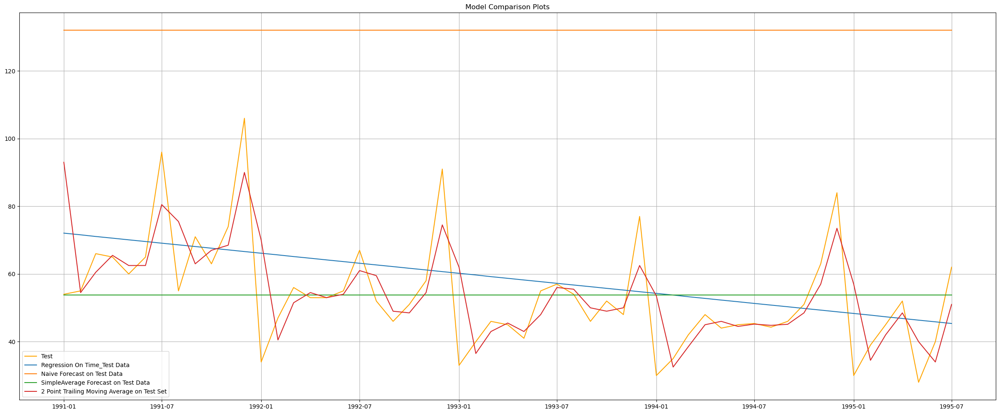

In [59]:
plt.figure(figsize=(30,12))
# plt.plot(train_rose['Rose'], label='Train',color = 'darkturquoise')
plt.plot(test_rose['Rose'], label='Test',color = 'orange')

plt.plot(LinearRegression_test_rose['RegOnTime_rose'], label='Regression On Time_Test Data')

plt.plot(NaiveModel_test['rose_naive'], label='Naive Forecast on Test Data')

plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SimpleAverage Forecast on Test Data')

plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')

plt.legend(loc='best')
plt.title("Model Comparison Plots")
plt.grid();

#### SIMPLE EXPONENTIAL SMOOTHING(SINGLE,DOUBLE,TRIPLE) MODELS:

In [60]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [61]:
SES_train = train_rose.copy()
SES_test = test_rose.copy()

In [62]:
model_SES = SimpleExpSmoothing(SES_train['Rose'])

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [63]:
model_SES_autofit = model_SES.fit(optimized=True,use_brute=True)

In [64]:
printmd('**The output parameters for optimized model are:**')
model_SES_autofit.params

**The output parameters for optimized model are:**

{'smoothing_level': 0.12362013444181875,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 112.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [65]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test_rose))
printmd('**Viewing the first five Predictions for Test Data:**')
SES_test.head()

**Viewing the first five Predictions for Test Data:**

,Rose,predict
YearMonth,,
1991-01-01,54.0,87.983765
1991-02-01,55.0,87.983765
1991-03-01,66.0,87.983765
1991-04-01,65.0,87.983765
1991-05-01,60.0,87.983765


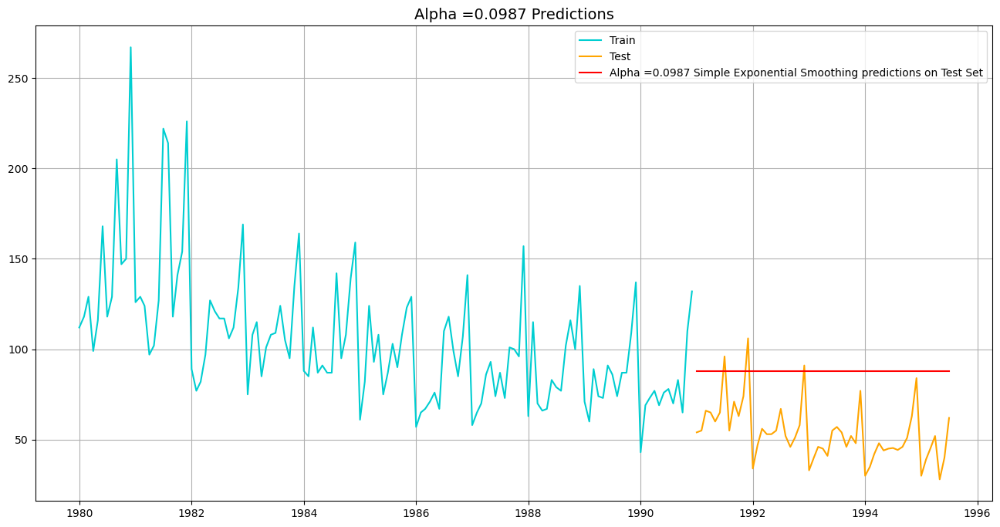

In [66]:
plt.figure(figsize=(16,8))
plt.plot(SES_train['Rose'], label='Train',color = 'darkturquoise')
plt.plot(SES_test['Rose'], label='Test',color = 'orange')

plt.plot(SES_test['predict'], label='Alpha =0.0987 Simple Exponential Smoothing predictions on Test Set',color = 'red')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha =0.0987 Predictions',fontsize = 14);

In [67]:
rmse_SES = metrics.mean_squared_error(SES_test['Rose'],SES_test['predict'],squared=False)
print("For Alpha =0.0987 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SES))

For Alpha =0.0987 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 37.620


In [68]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_SES]}
                           ,index=['Alpha=0.0987, SES Optimized'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_5])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427


In [69]:
resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha Values,Train RMSE,Test RMSE


In [70]:
# for i in np.arange(0,1.05,0.05):
#     model_SES_alpha_i = model_SES.fit(smoothing_level=i,optimized=False,use_brute=True)
#     SES_train['predict',i] = model_SES_alpha_i.fittedvalues
#     SES_test['predict',i] = model_SES_alpha_i.forecast(len(test_rose['Rose']))
    
#     rmse_SES_train_i = metrics.mean_squared_error(SES_train['Rose'],SES_train['predict',i],squared=False)
    
#     rmse_SES_test_i = metrics.mean_squared_error(SES_test['Rose'],SES_test['predict',i],squared=False)
    
#     resultsDf_6 = resultsDf_6.append({'Alpha Values':i,'Train RMSE':rmse_SES_train_i 
#                                       ,'Test RMSE':rmse_SES_test_i}, ignore_index=True)
from sklearn import metrics

resultsDf_6 = pd.DataFrame(columns=['Alpha Values', 'Train RMSE', 'Test RMSE'])

for i in np.arange(0, 1.05, 0.05):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i, optimized=False, use_brute=True)
    SES_train['predict', i] = model_SES_alpha_i.fittedvalues
    SES_test['predict', i] = model_SES_alpha_i.forecast(len(test_rose['Rose']))
    
    rmse_SES_train_i = metrics.mean_squared_error(SES_train['Rose'], SES_train['predict', i], squared=False)
    rmse_SES_test_i = metrics.mean_squared_error(SES_test['Rose'], SES_test['predict', i], squared=False)
    
    new_row = pd.DataFrame({'Alpha Values': [i], 'Train RMSE': [rmse_SES_train_i], 'Test RMSE': [rmse_SES_test_i]})
    resultsDf_6 = pd.concat([resultsDf_6, new_row], ignore_index=True)

In [71]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True).head()

,Alpha Values,Train RMSE,Test RMSE
2,0.10,31.815610,36.856268
1,0.05,32.449102,37.039679
3,0.15,31.809845,38.750307
4,0.20,31.979391,41.389972
5,0.25,32.211871,44.388786


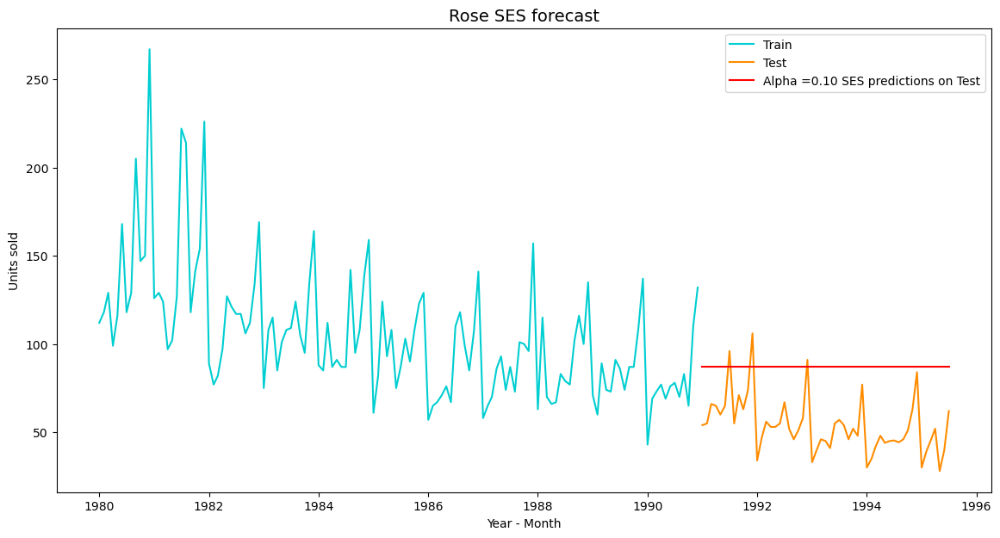

In [72]:
plt.plot(SES_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(SES_test['Rose'], label='Test', color = 'darkorange')

plt.plot(SES_test['predict', 0.10], color = 'red', label='Alpha =0.10 SES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Rose SES forecast', fontsize=14)
plt.legend(loc='best');

In [73]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE': [resultsDf_6.sort_values(by=['Test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.10,SES_Iterative'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_6_1])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268


In [74]:
DES_train = train_rose.copy()
DES_test = test_rose.copy()

In [75]:
model_DES = Holt(DES_train['Rose'])

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [76]:
model_DES_autofit = model_DES.fit(optimized=True)

In [77]:
printmd('**The output parameters for optimized model are:**')
model_DES_autofit.params

**The output parameters for optimized model are:**

{'smoothing_level': 0.16213318268706903,
 'smoothing_trend': 0.13152160115452238,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 112.0,
 'initial_trend': 6.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [78]:
alpha = model_DES_autofit.params['smoothing_level']
beta = model_DES_autofit.params['smoothing_trend']
print(alpha)
print(beta)

0.16213318268706903
0.13152160115452238


In [79]:
DES_test['predict',alpha,beta] = model_DES_autofit.forecast(len(test_rose['Rose']))
printmd('**Viewing the first five Predictions for Test Data:**')
DES_test.head()

**Viewing the first five Predictions for Test Data:**

,Rose,"(predict, 0.16213318268706903, 0.13152160115452238)"
YearMonth,,
1991-01-01,54.0,87.249990
1991-02-01,55.0,88.152720
1991-03-01,66.0,89.055449
1991-04-01,65.0,89.958179
1991-05-01,60.0,90.860908


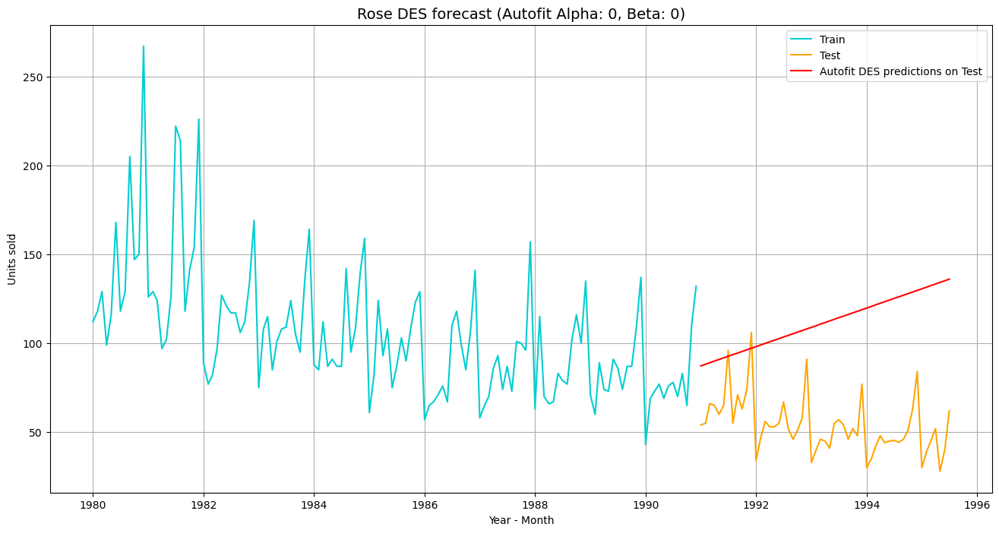

In [80]:
plt.figure(figsize=(16,8))
plt.plot(DES_train['Rose'], label='Train',color = 'darkturquoise')
plt.plot(DES_test['Rose'], label='Test',color = 'orange')

plt.plot(DES_test['predict',alpha,beta], color = 'red', label='Autofit DES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Rose DES forecast (Autofit Alpha: 0, Beta: 0)', fontsize=14)
plt.legend(loc='best')
plt.grid();

In [81]:
rmse_DES = metrics.mean_squared_error(DES_test['Rose'],DES_test['predict',alpha,beta],squared=False)
print("For Auto-fit Double Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_DES))

For Auto-fit Double Exponential Smoothing Model forecast on the Test Data, RMSE is 63.075


In [82]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [rmse_DES]}
                           ,index=['Alpha=0.0,Beta=0.0, DES Optimized'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_7])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


In [83]:
resultsDf_7 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_7

,Alpha Values,Beta Values,Train RMSE,Test RMSE


In [84]:
# for i in np.arange(0.1,1.1,0.1):
#     for j in np.arange(0.1,1.1,0.1):
#         model_DES_alpha_i_j = model_DES.fit(smoothing_level=i,smoothing_trend=j,optimized=False,use_brute=True)
#         DES_train['predict',i,j] = model_DES_alpha_i_j.fittedvalues
#         DES_test['predict',i,j] = model_DES_alpha_i_j.forecast(len(test_rose['Rose']))
        
#         rmse_DES_train = np.round(metrics.mean_squared_error(DES_train['Rose'],DES_train['predict',i,j],squared=False),2)
        
#         rmse_DES_test = np.round(metrics.mean_squared_error(DES_test['Rose'],DES_test['predict',i,j],squared=False),2)
        
#         resultsDf_7 = resultsDf_7.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_DES_train
#                                           ,'Test RMSE':rmse_DES_test}, ignore_index=True)
import pandas as pd
import numpy as np
from sklearn import metrics

resultsDf_7 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Train RMSE', 'Test RMSE'])

for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_trend=j, optimized=False, use_brute=True)
        DES_train['predict', i, j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict', i, j] = model_DES_alpha_i_j.forecast(len(test_rose['Rose']))
        
        rmse_DES_train = np.round(metrics.mean_squared_error(DES_train['Rose'], DES_train['predict', i, j], squared=False), 2)
        rmse_DES_test = np.round(metrics.mean_squared_error(DES_test['Rose'], DES_test['predict', i, j], squared=False), 2)
        
        new_row = pd.DataFrame({'Alpha Values': [i], 'Beta Values': [j], 'Train RMSE': [rmse_DES_train], 'Test RMSE': [rmse_DES_test]})
        resultsDf_7 = pd.concat([resultsDf_7, new_row], ignore_index=True)


In [85]:
resultsDf_7.sort_values(by=['Test RMSE'],ascending=True).head()

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,34.44,36.95
1,0.1,0.2,33.45,48.72
10,0.2,0.1,33.10,65.76
2,0.1,0.3,33.15,78.19
20,0.3,0.1,33.61,98.69


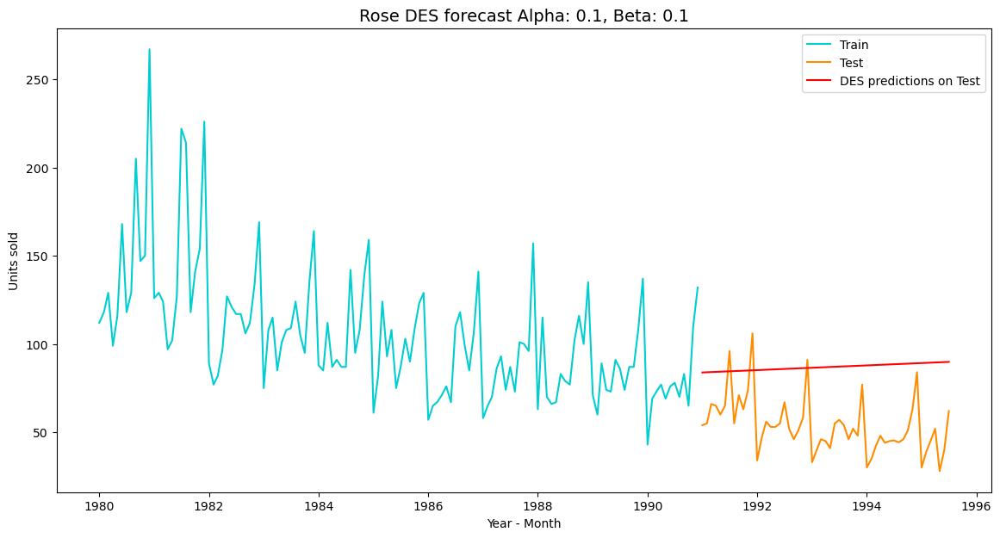

In [86]:
plt.plot(DES_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(DES_test['Rose'], label='Test', color = 'darkorange')

plt.plot(DES_test['predict', 0.1, 0.1], color = 'red', label='DES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Rose DES forecast Alpha: 0.1, Beta: 0.1', fontsize=14)
plt.legend(loc='best');

In [87]:
resultsDf_7_1 = pd.DataFrame({'Test RMSE': [resultsDf_7.sort_values(by=['Test RMSE'],ascending=True).values[0][3]]}
                           ,index=['Alpha=0.1,Beta=0.1,DES_Iterative'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_7_1])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


In [88]:
TES_train = train_rose.copy()
TES_test = test_rose.copy()

In [89]:
model_TES= ExponentialSmoothing(TES_train['Rose'],trend='add',seasonal='multiplicative')

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [90]:
model_TES_autofit = model_TES.fit(optimized=True)

In [91]:
printmd('**The output parameters for optimized model are:**')
model_TES_autofit.params

**The output parameters for optimized model are:**

{'smoothing_level': 0.0715106306609405,
 'smoothing_trend': 0.04529179757535142,
 'smoothing_seasonal': 7.244325029450242e-05,
 'damping_trend': nan,
 'initial_level': 130.40839142502193,
 'initial_trend': -0.77985743179386,
 'initial_seasons': array([0.86218996, 0.977675  , 1.0687727 , 0.93403881, 1.050625  ,
        1.14410977, 1.25836944, 1.33937772, 1.26778766, 1.24131254,
        1.44724625, 1.99553681]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [92]:
alpha = model_TES_autofit.params['smoothing_level']
beta = model_TES_autofit.params['smoothing_trend']
gamma = model_TES_autofit.params['smoothing_seasonal']
print(alpha)
print(beta)
print(gamma)

0.0715106306609405
0.04529179757535142
7.244325029450242e-05


In [93]:
TES_test['predict',alpha,beta,gamma] = model_TES_autofit.forecast(steps=len(test_rose['Rose']))

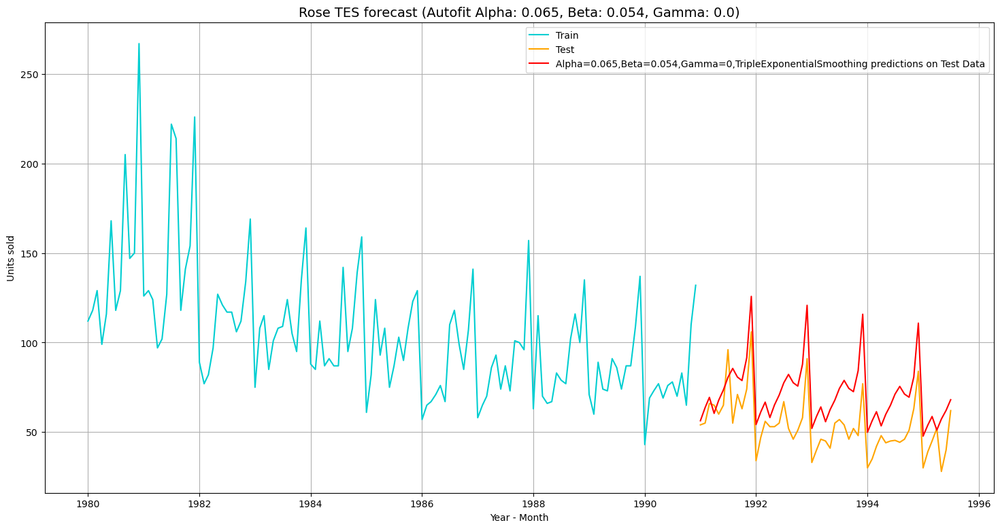

In [94]:
plt.figure(figsize=(18,9))
plt.plot(TES_train['Rose'], label='Train',color = 'darkturquoise')
plt.plot(TES_test['Rose'], label='Test',color = 'orange')

plt.plot(TES_test['predict',alpha,beta,gamma], color='red',label='Alpha=0.065,Beta=0.054,Gamma=0,TripleExponentialSmoothing predictions on Test Data')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Rose TES forecast (Autofit Alpha: 0.065, Beta: 0.054, Gamma: 0.0)', fontsize=14)
plt.legend(loc='best')
plt.grid();

In [95]:
rmse_TES = metrics.mean_squared_error(TES_test['Rose'],TES_test['predict',alpha,beta,gamma],squared=False)
print("For Auto-fit Triple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_TES))

For Auto-fit Triple Exponential Smoothing Model forecast on the Test Data, RMSE is 20.194


In [96]:
resultsDf_8 = pd.DataFrame({'Test RMSE': [rmse_TES]}
                           ,index=['Alpha=0.065,Beta=0.054,gamma=0.0 TES Optimized'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


In [97]:
resultsDf_8 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8

,Alpha Values,Beta Values,Train RMSE,Test RMSE


In [98]:
# for i in np.arange(0.1,1.1,0.1):
#     for j in np.arange(0.1,1.1,0.1):
#         for k in np.arange(0.3,1.1,0.1):
#             model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=False,use_brute=True)
#             TES_train['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
#             TES_test['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(len(test_rose['Rose']))
        
#             rmse_TES_train = metrics.mean_squared_error(TES_train['Rose'],TES_train['predict',i,j,k],squared=False)
            
#             rmse_TES_test = metrics.mean_squared_error(TES_test['Rose'],TES_test['predict',i,j,k],squared=False)
            
#             resultsDf_8 = resultsDf_8.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
#                                                   'Train RMSE':rmse_TES_train,'Test RMSE':rmse_TES_test}
#                                                  , ignore_index=True)
resultsDf_8 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Gamma Values', 'Train RMSE', 'Test RMSE'])

for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        for k in np.arange(0.3, 1.1, 0.1):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_trend=j, smoothing_seasonal=k, optimized=False, use_brute=True)
            TES_train['predict', i, j, k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict', i, j, k] = model_TES_alpha_i_j_k.forecast(len(test_rose['Rose']))
        
            rmse_TES_train = metrics.mean_squared_error(TES_train['Rose'], TES_train['predict', i, j, k], squared=False)
            rmse_TES_test = metrics.mean_squared_error(TES_test['Rose'], TES_test['predict', i, j, k], squared=False)
            
            new_row = pd.DataFrame({'Alpha Values': [i], 'Beta Values': [j], 'Gamma Values': [k], 'Train RMSE': [rmse_TES_train], 'Test RMSE': [rmse_TES_test]})
            resultsDf_8 = pd.concat([resultsDf_8, new_row], ignore_index=True)

In [99]:
resultsDf_8.sort_values(by=['Test RMSE'],ascending=True).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE
112,0.2,0.5,0.3,23.656276,9.880143
8,0.1,0.2,0.3,20.871304,9.896558
177,0.3,0.3,0.4,24.588120,10.154653
185,0.3,0.4,0.4,25.599445,10.356184
9,0.1,0.2,0.4,21.613205,10.380317


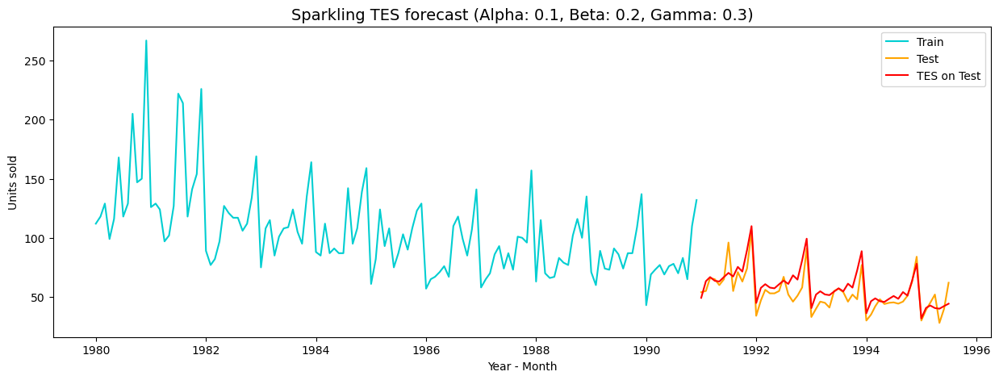

In [100]:
plt.figure(figsize=(15,5))
plt.plot(TES_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(TES_test['Rose'], label='Test', color = 'orange')

plt.plot(TES_test['predict', 0.1, 0.2, 0.3], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Rose TES forecast (Alpha: 0.1, Beta: 0.2, Gamma: 0.3)', fontsize=14)

plt.legend(loc='best');

In [101]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE': [resultsDf_8.sort_values(by=['Test RMSE'],ascending=True).values[0][3]]}
                           ,index=['Alpha=0.1,Beta=0.2,gamma=0.3,TES_Iterative'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_1])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


In [102]:
rose_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
RegressionOnTime,15.278369
SimpleAverage,15.773671
"Alpha=0.065,Beta=0.054,gamma=0.0 TES Optimized",20.194223
"Alpha=0.1,Beta=0.2,gamma=0.3,TES_Iterative",23.656276
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.1,Beta=0.1,DES_Iterative",36.950000


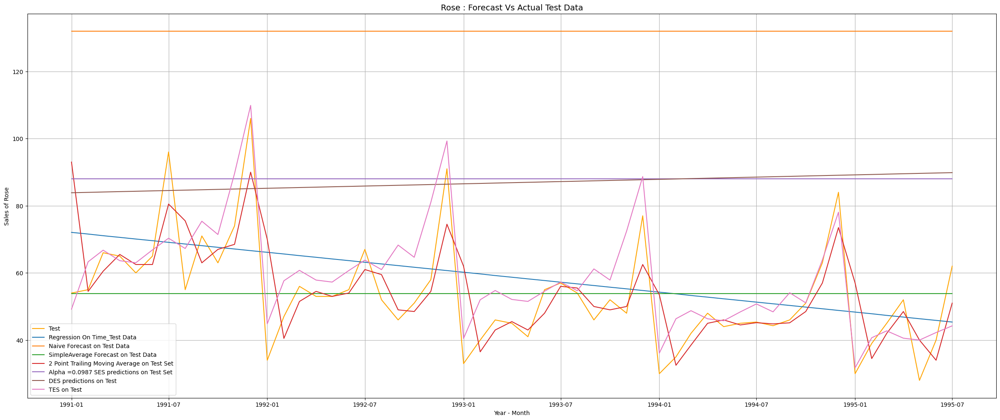

In [103]:
plt.figure(figsize=(30,12))
#Train data
# plt.plot(train_rose['Rose'], label='Train',color = 'darkturquoise')
#Test data
plt.plot(test_rose['Rose'], label='Test',color = 'orange')
#Linear Regression
plt.plot(LinearRegression_test_rose['RegOnTime_rose'], label='Regression On Time_Test Data')
#Naive Forecast
plt.plot(NaiveModel_test['rose_naive'], label='Naive Forecast on Test Data')
#SimpleAverage
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SimpleAverage Forecast on Test Data')
#2-point Trailing Moving Average
plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
##SES Optimised at alpha=0.0987
plt.plot(SES_test['predict'], label='Alpha =0.0987 SES predictions on Test Set')
#DES iterative at alpha=0.1 and beta=0.1
plt.plot(DES_test['predict', 0.1, 0.1], label='DES predictions on Test')
#TES iterative at alpha=0.1, beta=0.2 and gamma=0.3
plt.plot(TES_test['predict', 0.1, 0.2, 0.3], label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Sales of Rose')
plt.title('Rose : Forecast Vs Actual Test Data', fontsize=14)
plt.grid()
plt.legend(loc='best');

### CHECKING FOR STATIONARITY:

In [104]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries, color):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=7).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color=color,label='Observed')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

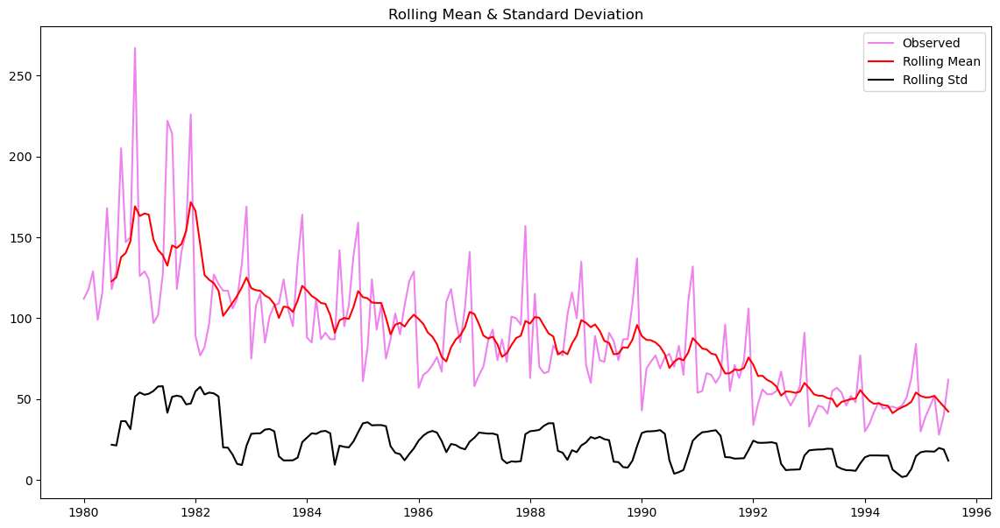

Results of Dickey-Fuller Test:
Test Statistic                  -1.872615
p-value                          0.345051
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [105]:
test_stationarity(df_rose['Rose'], 'violet')

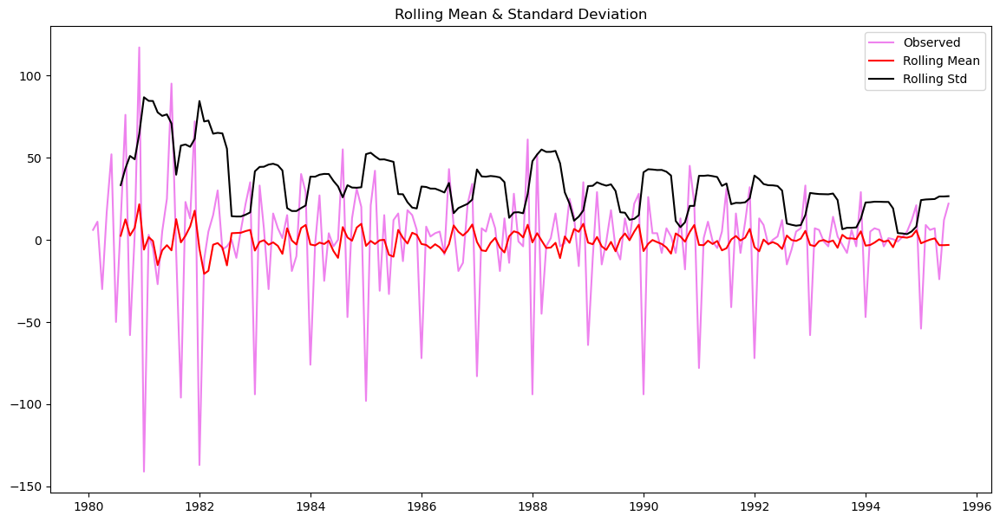

Results of Dickey-Fuller Test:
Test Statistic                -8.044081e+00
p-value                        1.814191e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [106]:
test_stationarity(df_rose['Rose'].diff().dropna(), 'violet')

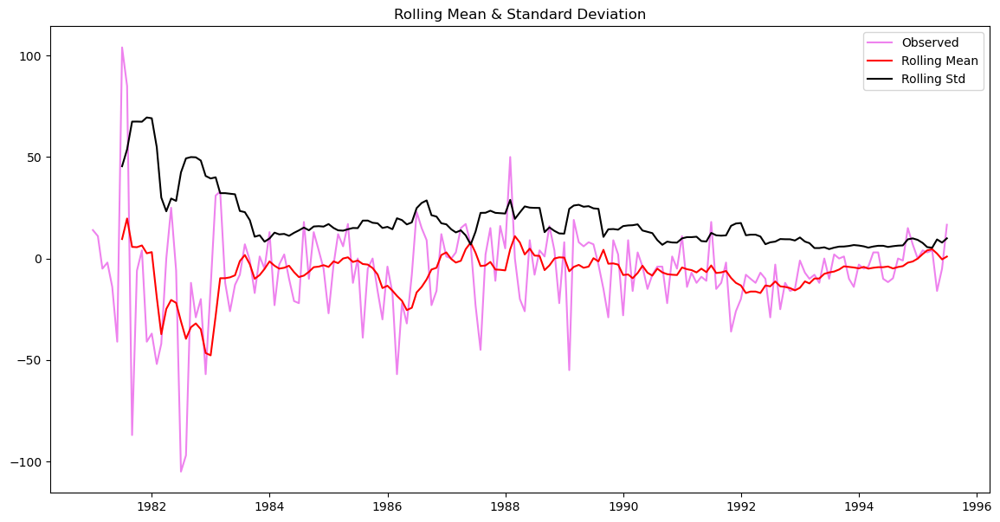

Results of Dickey-Fuller Test:
Test Statistic                  -4.257265
p-value                          0.000526
#Lags Used                      11.000000
Number of Observations Used    163.000000
Critical Value (1%)             -3.471119
Critical Value (5%)             -2.879441
Critical Value (10%)            -2.576314
dtype: float64 



In [107]:
test_stationarity(df_rose['Rose'].diff(12).dropna(), 'violet')

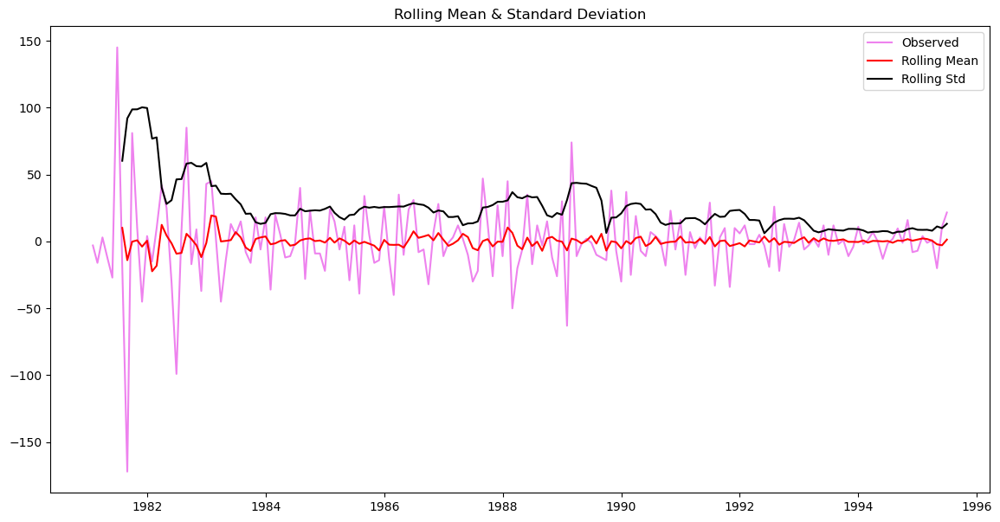

Results of Dickey-Fuller Test:
Test Statistic                  -4.605791
p-value                          0.000126
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [108]:
test_stationarity((df_rose['Rose'].diff(12).dropna()).diff().dropna(), 'violet')

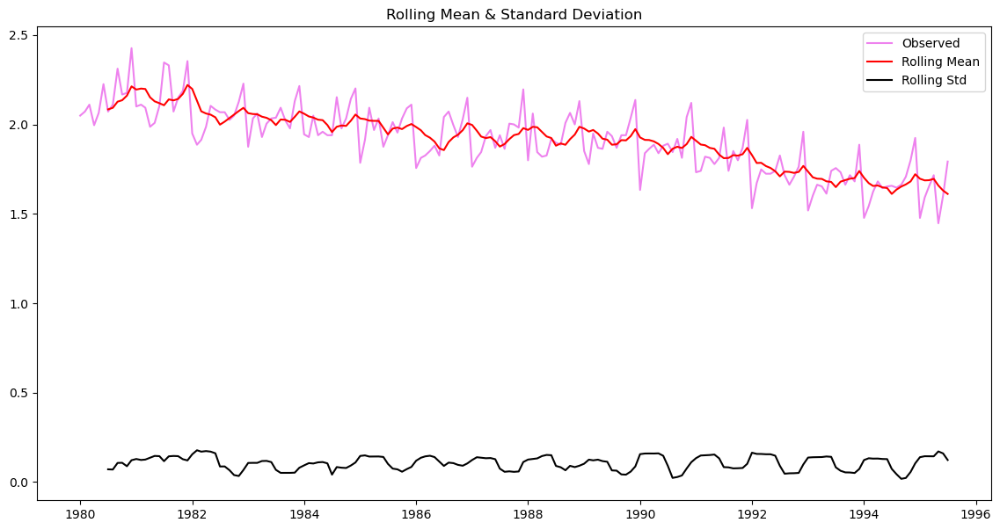

Results of Dickey-Fuller Test:
Test Statistic                  -0.412363
p-value                          0.908014
#Lags Used                      12.000000
Number of Observations Used    174.000000
Critical Value (1%)             -3.468502
Critical Value (5%)             -2.878298
Critical Value (10%)            -2.575704
dtype: float64 



In [109]:
test_stationarity(np.log10(df_rose['Rose']), 'violet')

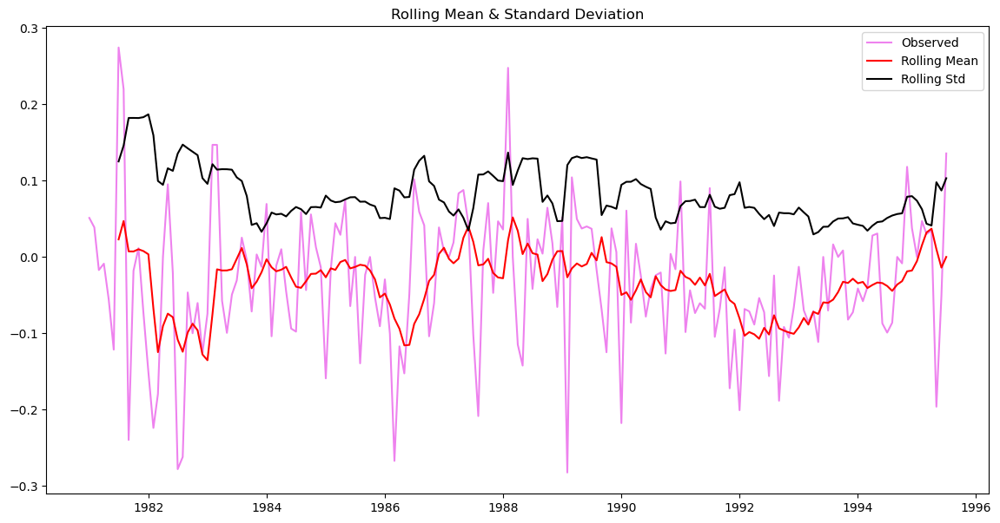

Results of Dickey-Fuller Test:
Test Statistic                  -3.934772
p-value                          0.001793
#Lags Used                      11.000000
Number of Observations Used    163.000000
Critical Value (1%)             -3.471119
Critical Value (5%)             -2.879441
Critical Value (10%)            -2.576314
dtype: float64 



In [110]:
test_stationarity(np.log10(df_rose['Rose']).diff(12).dropna(), 'violet')

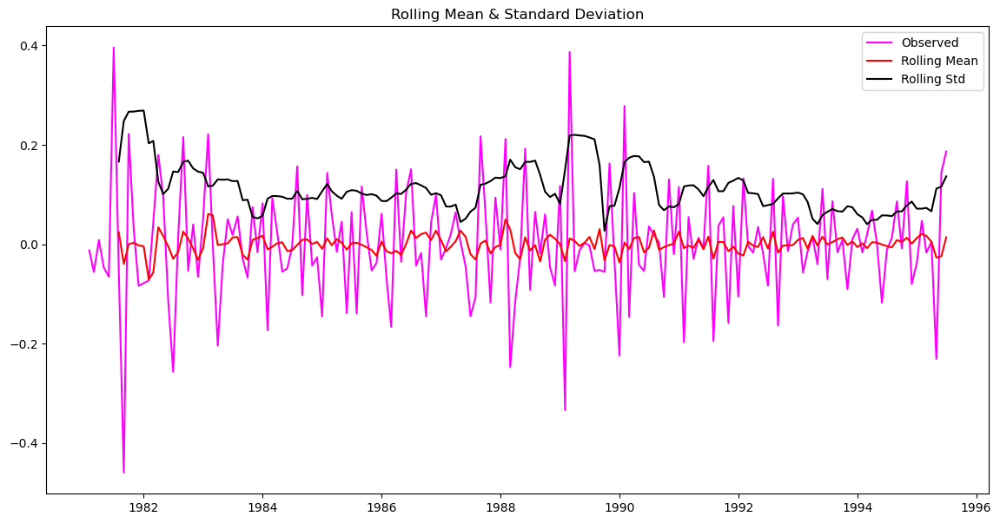

Results of Dickey-Fuller Test:
Test Statistic                  -4.628179
p-value                          0.000115
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [111]:
test_stationarity((np.log10(df_rose['Rose']).diff(12).dropna()).diff().dropna(), 'magenta')

In [112]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

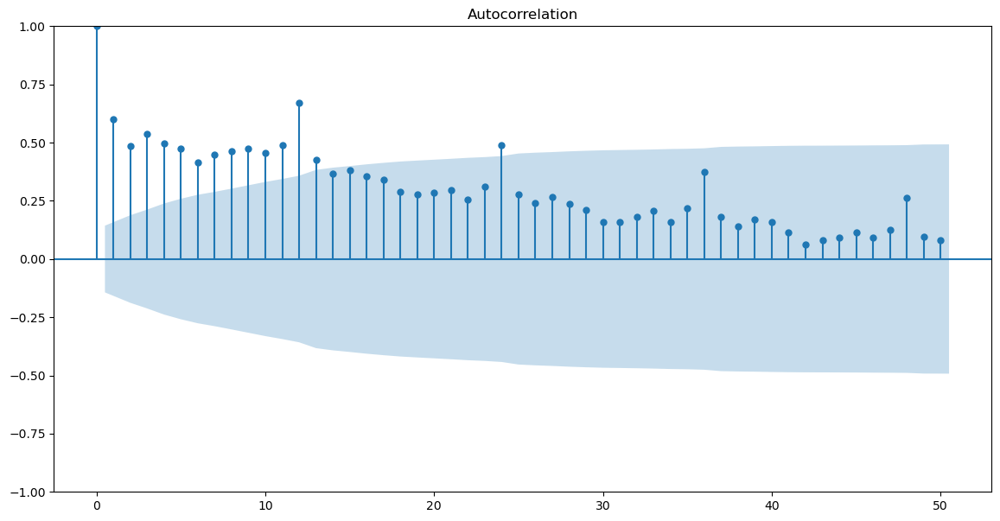

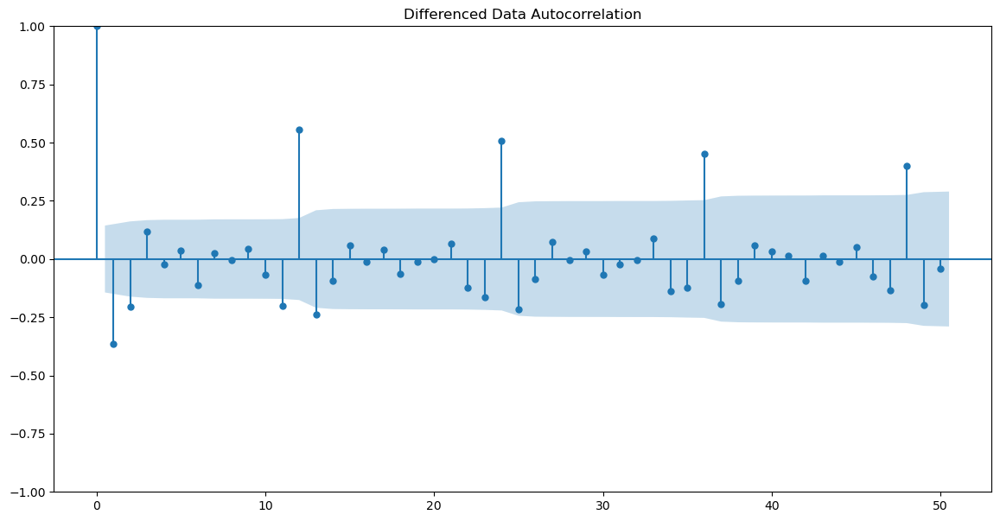

In [113]:
plot_acf(df_rose['Rose'],lags=50)
plot_acf(df_rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show();

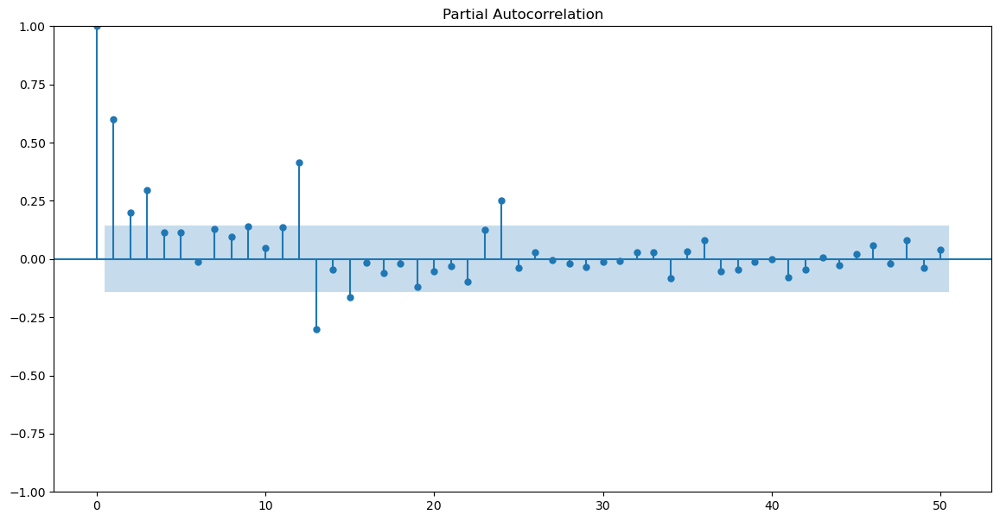

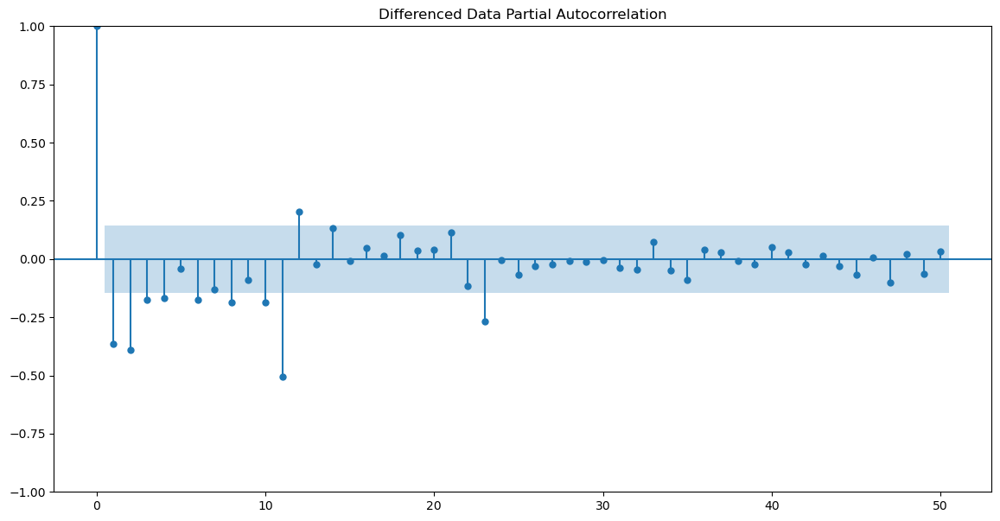

In [114]:
plot_pacf(df_rose['Rose'],lags=50)
plot_pacf(df_rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

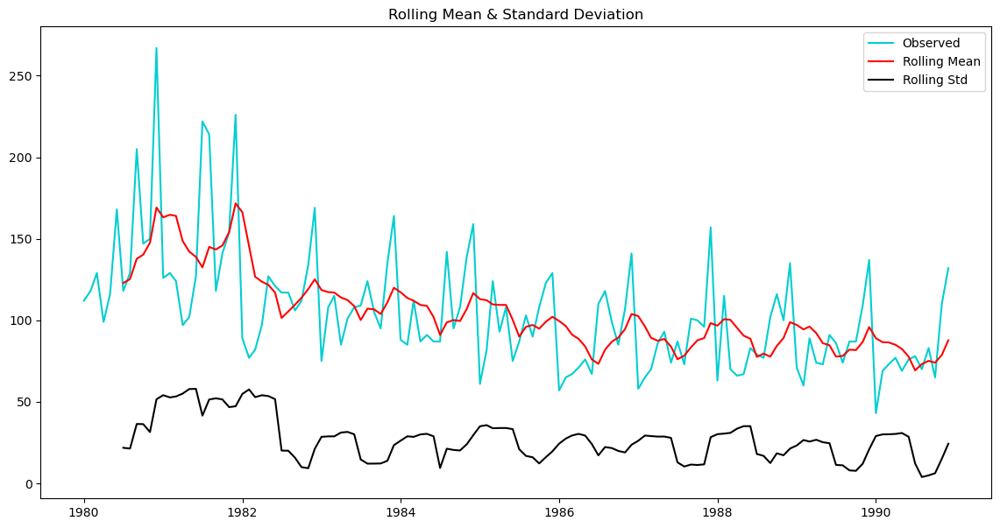

Results of Dickey-Fuller Test:
Test Statistic                  -2.164250
p-value                          0.219476
#Lags Used                      13.000000
Number of Observations Used    118.000000
Critical Value (1%)             -3.487022
Critical Value (5%)             -2.886363
Critical Value (10%)            -2.580009
dtype: float64 



In [115]:
test_stationarity(train_rose['Rose'],'darkturquoise')

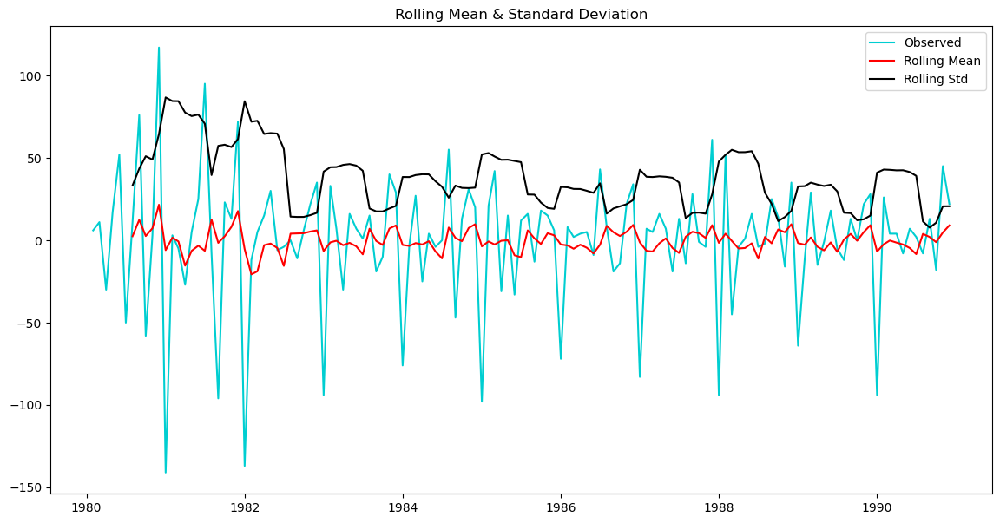

Results of Dickey-Fuller Test:
Test Statistic                -6.592372e+00
p-value                        7.061944e-09
#Lags Used                     1.200000e+01
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64 



In [116]:
test_stationarity(train_rose['Rose'].diff().dropna(),'darkturquoise')

### BUILDING MODELS WITH STATIONARIY DATASET:

#### AUTO ARIMA MODEL:

In [117]:
import itertools
p = q = range(0, 3)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [118]:
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [119]:
# from statsmodels.tsa.arima_model import ARIMA

# for param in pdq:
#     ARIMA_model = ARIMA(train_rose['Rose'].values,order=param).fit()
#     print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))
#     ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
from statsmodels.tsa.arima.model import ARIMA
# Assuming you have your data loaded in a variable called 'train_rose'
# and 'pdq' is a list of parameter tuples

ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])

for param in pdq:
    ARIMA_model = ARIMA(train_rose['Rose'].values, order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))
    
    new_row = pd.DataFrame({'param': [param], 'AIC': [ARIMA_model.aic]})
    ARIMA_AIC = pd.concat([ARIMA_AIC, new_row], ignore_index=True)

ARIMA(0, 1, 0) - AIC:1333.1546729124348
ARIMA(0, 1, 1) - AIC:1282.3098319748312
ARIMA(0, 1, 2) - AIC:1279.6715288535797
ARIMA(1, 1, 0) - AIC:1317.3503105381492
ARIMA(1, 1, 1) - AIC:1280.5742295380064
ARIMA(1, 1, 2) - AIC:1279.8707234231915
ARIMA(2, 1, 0) - AIC:1298.611034160493
ARIMA(2, 1, 1) - AIC:1281.507862186858
ARIMA(2, 1, 2) - AIC:1281.870722226434


In [120]:
ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
2,"(0, 1, 2)",1279.671529
5,"(1, 1, 2)",1279.870723
4,"(1, 1, 1)",1280.574230
7,"(2, 1, 1)",1281.507862
8,"(2, 1, 2)",1281.870722
1,"(0, 1, 1)",1282.309832
6,"(2, 1, 0)",1298.611034
3,"(1, 1, 0)",1317.350311
0,"(0, 1, 0)",1333.154673


In [121]:
auto_ARIMA = ARIMA(train_rose['Rose'], order=(0,1,2))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(0, 1, 2)   Log Likelihood                -636.836
Date:                Sat, 14 Sep 2024   AIC                           1279.672
Time:                        17:07:37   BIC                           1288.297
Sample:                    01-01-1980   HQIC                          1283.176
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6970      0.072     -9.689      0.000      -0.838      -0.556
ma.L2         -0.2042      0.073     -2.794      0.005      -0.347      -0.061
sigma2       965.8407     88.305     10.938      0.0

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [122]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test_rose['Rose']))

In [123]:
# rmse_arima_auto_model = metrics.mean_squared_error(test_rose['Rose'],predicted_auto_ARIMA[0],squared=False)
# print("For Auto-ARIMA Model forecast accuracy_score on the Test Data, RMSE is %3.3f" %(rmse_arima_auto_model))
predicted_auto_ARIMA = results_auto_ARIMA.forecast(len(test_rose['Rose']))

# Calculate RMSE
rmse_arima_auto_model = metrics.mean_squared_error(test_rose['Rose'], predicted_auto_ARIMA, squared=False)
print("For Auto-ARIMA Model forecast accuracy_score on the Test Data, RMSE is %3.3f" % rmse_arima_auto_model)

For Auto-ARIMA Model forecast accuracy_score on the Test Data, RMSE is 37.335


In [124]:
resultsDf_9 = pd.DataFrame({'Test RMSE': [rmse_arima_auto_model]}
                           ,index=['Auto_ARIMA(0, 1, 2)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_9])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


#### AUTO SARIMA MODEL:

In [125]:
SARIMA_train = train_rose.copy()
SARIMA_test = test_rose.copy()

In [126]:
import itertools
p = q = range(0,3)
d= range(1,2)
D = range(1,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)


In [127]:
SARIMA_AIC_rose = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_rose

,param,seasonal,AIC


In [128]:
import statsmodels.api as sm

# for param in pdq:
#     for param_seasonal in model_pdq:
#         SARIMA_model_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
#                                             order=param,
#                                             seasonal_order=param_seasonal,
#                                             enforce_stationarity=False,
#                                             enforce_invertibility=False)
            
#         results_SARIMA_rose = SARIMA_model_rose.fit(maxiter=1000)
#         print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose.aic))
#         SARIMA_AIC_rose = SARIMA_AIC_rose.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_rose.aic}, ignore_index=True)
SARIMA_AIC_rose = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                                      order=param,
                                                      seasonal_order=param_seasonal,
                                                      enforce_stationarity=False,
                                                      enforce_invertibility=False)
            
        results_SARIMA_rose = SARIMA_model_rose.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose.aic))
        
        new_row = pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [results_SARIMA_rose.aic]})
        SARIMA_AIC_rose = pd.concat([SARIMA_AIC_rose, new_row], ignore_index=True)

SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:1171.2013438279514
SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:965.5057301627294
SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:845.8687014776214
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:982.3269589658807
SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:975.3375383601602
SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:847.7332182654844
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:858.5132698374416
SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:853.3390729145062
SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:842.6282244224263
SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:1113.7663133562965
SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:915.073060671756
SARIMA(0, 1, 1)x(0, 1, 2, 12)7 - AIC:790.9032809265805
SARIMA(0, 1, 1)x(1, 1, 0, 12)7 - AIC:944.245665553056
SARIMA(0, 1, 1)x(1, 1, 1, 12)7 - AIC:929.3362488520081
SARIMA(0, 1, 1)x(1, 1, 2, 12)7 - AIC:792.7161670383982
SARIMA(0, 1, 1)x(2, 1, 0, 12)7 - AIC:810.3194350158657
SARIMA(0, 1, 1)x(2, 1, 1, 12)7 - AIC:804.1555757598343
SARIMA(0, 1, 1)x(2, 1, 2, 12)7 - AIC:782.1538715284703
SARIMA(0, 

In [129]:
SARIMA_AIC_rose.sort_values(by=['AIC']).head()

,param,seasonal,AIC
26,"(0, 1, 2)","(2, 1, 2, 12)",774.969119
53,"(1, 1, 2)","(2, 1, 2, 12)",776.940290
80,"(2, 1, 2)","(2, 1, 2, 12)",776.996099
17,"(0, 1, 1)","(2, 1, 2, 12)",782.153872
79,"(2, 1, 2)","(2, 1, 1, 12)",783.703652


In [130]:
auto_SARIMA_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                order=(0, 1, 2),
                                seasonal_order=(2, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_rose = auto_SARIMA_rose.fit(maxiter=1000)
print(results_auto_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(0, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -380.485
Date:                            Sat, 14 Sep 2024   AIC                            774.969
Time:                                    17:08:20   BIC                            792.622
Sample:                                         0   HQIC                           782.094
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9524      0.184     -5.166      0.000      -1.314      -0.591
ma.L2         -0.0764      0.126   

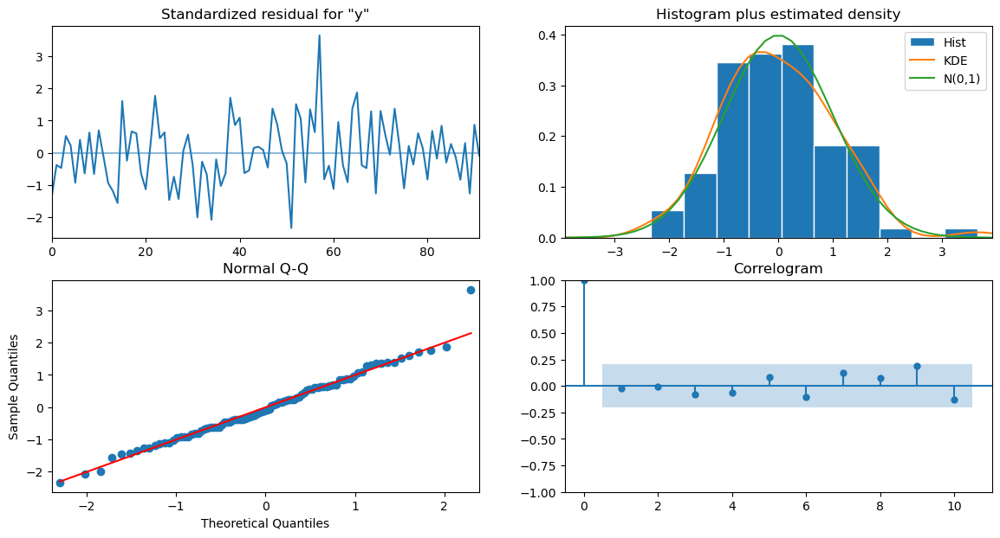

In [131]:
results_auto_SARIMA_rose.plot_diagnostics()
plt.show()

In [132]:
predicted_auto_SARIMA = results_auto_SARIMA_rose.get_forecast(steps=len(SARIMA_test['Rose']))

In [133]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,44.213524,14.221751,16.339403,72.087644
1,62.326767,14.300532,34.298239,90.355295
2,67.313318,14.302433,39.281064,95.345572
3,63.161053,14.305335,35.123112,91.198993
4,66.474277,14.310705,38.425811,94.522744


In [134]:
rose_forecasted = predicted_auto_SARIMA.predicted_mean
SARIMA_test['rose_forecasted'] = predicted_auto_SARIMA.predicted_mean
SARIMA_test.head()

,Rose,rose_forecasted
YearMonth,,
1991-01-01,54.0,44.213524
1991-02-01,55.0,62.326767
1991-03-01,66.0,67.313318
1991-04-01,65.0,63.161053
1991-05-01,60.0,66.474277


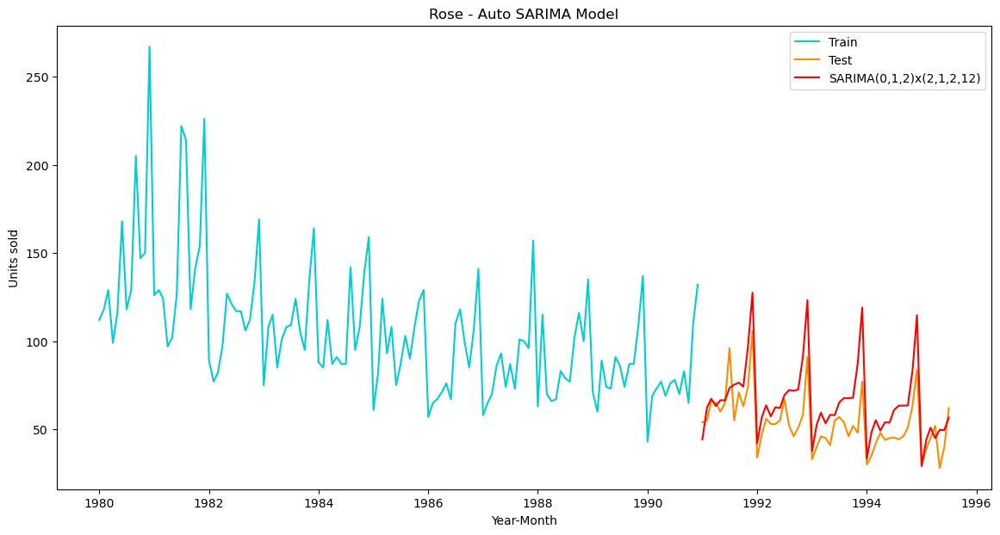

In [135]:
plt.plot(SARIMA_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(SARIMA_test['Rose'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['rose_forecasted'], color='red', label='SARIMA(0,1,2)x(2,1,2,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Rose - Auto SARIMA Model')
plt.legend(loc='best');

In [136]:
rmse_SARIMA_auto_model = metrics.mean_squared_error(SARIMA_test['Rose'],predicted_auto_SARIMA.predicted_mean,squared=False)
print("For Auto-SARIMA Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SARIMA_auto_model))

For Auto-SARIMA Model forecast on the Test Data, RMSE is 16.528


In [137]:
resultsDf_10 = pd.DataFrame({'Test RMSE': [rmse_SARIMA_auto_model]}
                           ,index=['Auto_SARIMA(0, 1, 2)*(2, 1, 2, 12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_10])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


#### AUTO SARIMA LOG MODEL:

In [138]:
rose_log_train = np.log10(SARIMA_train['Rose'])

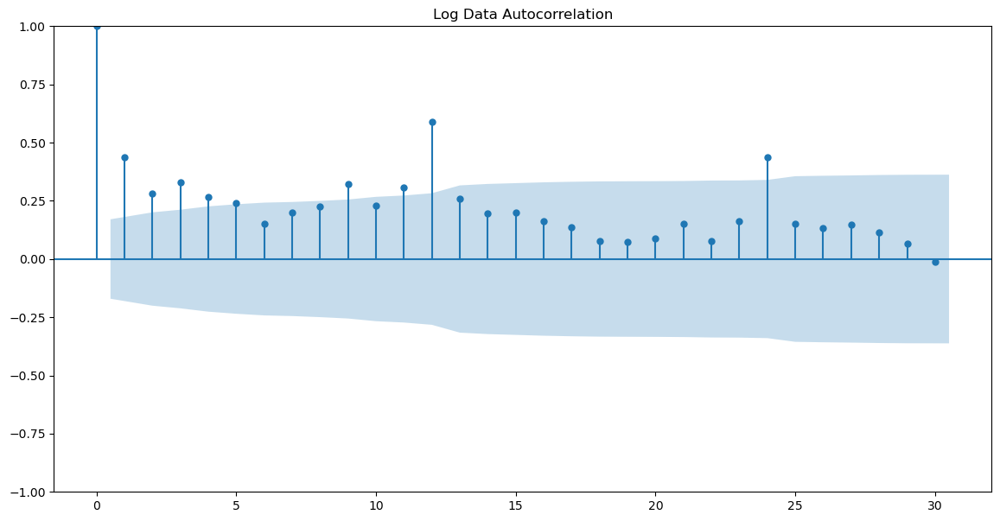

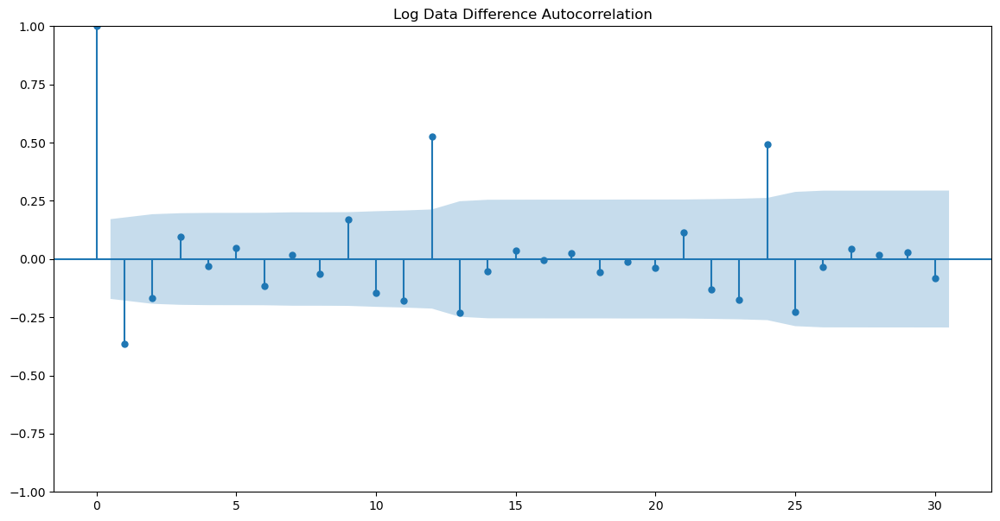

In [139]:
plot_acf(rose_log_train,lags=30,title='Log Data Autocorrelation')
plot_acf(rose_log_train.diff().dropna(),lags=30,title='Log Data Difference Autocorrelation')
plt.show()

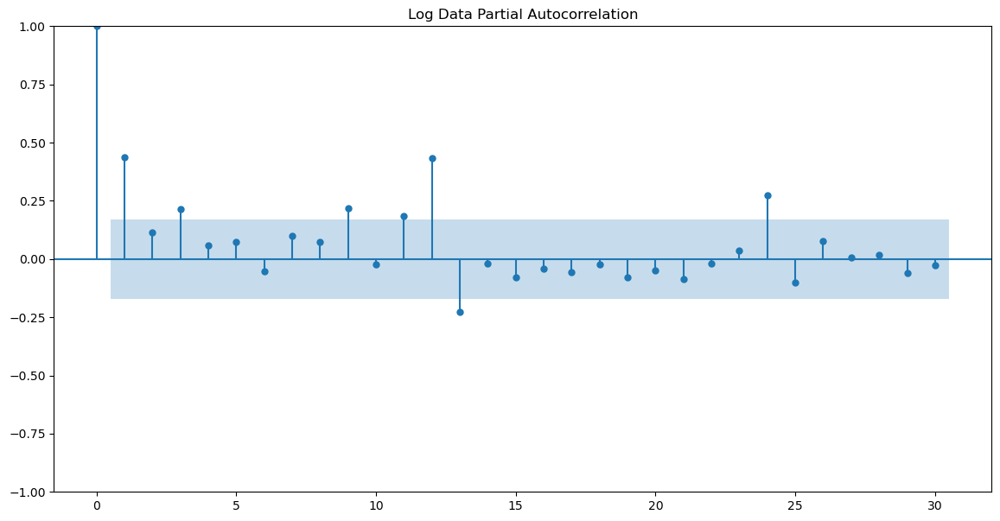

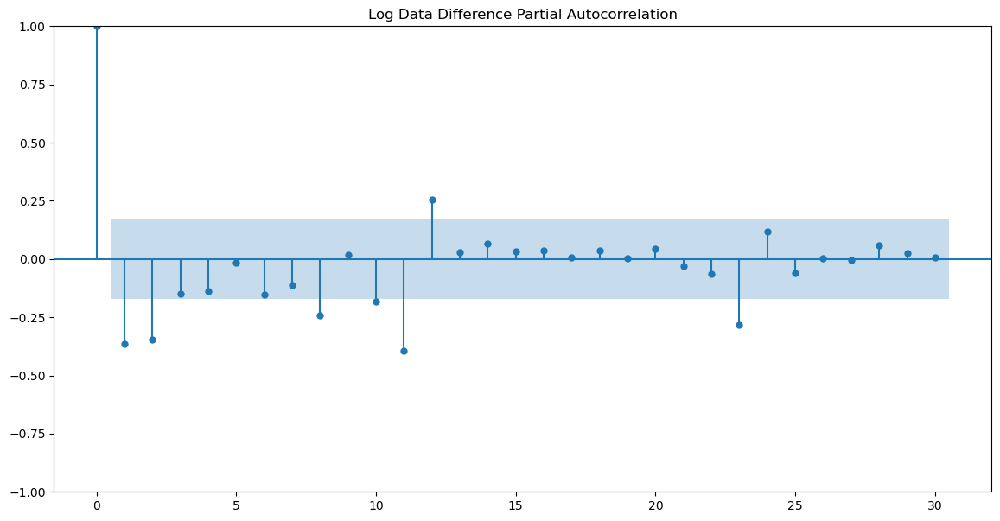

In [140]:
plot_pacf(rose_log_train,lags=30,title='Log Data Partial Autocorrelation')
plot_pacf(rose_log_train.diff().dropna(),lags=30,title='Log Data Difference Partial Autocorrelation')
plt.show()

In [141]:
import itertools
p = q = range(0, 3) 
d= range(1,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)


In [142]:
SARIMA_AIC_rose_log = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_rose_log

,param,seasonal,AIC


In [143]:
import statsmodels.api as sm

# for param in pdq:
#     for param_seasonal in model_pdq:
#         SARIMA_model_rose_log = sm.tsa.statespace.SARIMAX(rose_log_train,
#                                             order=param,
#                                             seasonal_order=param_seasonal,
#                                             enforce_stationarity=False,
#                                             enforce_invertibility=False)
            
#         results_SARIMA_rose_log = SARIMA_model_rose_log.fit(maxiter=1000)
#         print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose_log.aic))
#         SARIMA_AIC_rose_log = SARIMA_AIC_rose_log.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_rose_log.aic}, ignore_index=True)
SARIMA_AIC_rose_log = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_rose_log = sm.tsa.statespace.SARIMAX(rose_log_train,
                                                          order=param,
                                                          seasonal_order=param_seasonal,
                                                          enforce_stationarity=False,
                                                          enforce_invertibility=False)
            
        results_SARIMA_rose_log = SARIMA_model_rose_log.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose_log.aic))
        
        new_row = pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [results_SARIMA_rose_log.aic]})
        SARIMA_AIC_rose_log = pd.concat([SARIMA_AIC_rose_log, new_row], ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12)7 - AIC:-132.2811508841321
SARIMA(0, 1, 0)x(0, 0, 1, 12)7 - AIC:-151.24402059017396


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(0, 1, 0)x(0, 0, 2, 12)7 - AIC:-163.20900777080146
SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:-151.39741606038652


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:-195.6981021193255


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:-168.6306140518164
SARIMA(0, 1, 0)x(1, 0, 0, 12)7 - AIC:-176.14679360677212
SARIMA(0, 1, 0)x(1, 0, 1, 12)7 - AIC:-193.80943149417138


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(0, 1, 0)x(1, 0, 2, 12)7 - AIC:-182.39902069346826
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:-184.19318049207516


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:-184.99828084552436


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:-167.69698599152628
SARIMA(0, 1, 0)x(2, 0, 0, 12)7 - AIC:-189.5613341304328


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. 

SARIMA(0, 1, 0)x(2, 0, 1, 12)7 - AIC:-189.0500494975325
SARIMA(0, 1, 0)x(2, 0, 2, 12)7 - AIC:-188.67550184265843
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:-163.31782089862688


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:-163.44104667425432


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:-165.20276057935925
SARIMA(0, 1, 1)x(0, 0, 0, 12)7 - AIC:-180.16317688315087
SARIMA(0, 1, 1)x(0, 0, 1, 12)7 - AIC:-193.9888499631184


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(0, 1, 1)x(0, 0, 2, 12)7 - AIC:-205.88038347388226
SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:-201.16086945183406


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:-245.3156236695612


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 1, 2, 12)7 - AIC:-215.71778314567024
SARIMA(0, 1, 1)x(1, 0, 0, 12)7 - AIC:-226.46068043208766


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 0, 1, 12)7 - AIC:-247.07640750872983


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 0, 2, 12)7 - AIC:-225.17137606286835
SARIMA(0, 1, 1)x(1, 1, 0, 12)7 - AIC:-227.96854219264833


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 1, 1, 12)7 - AIC:-224.9103727961736


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(0, 1, 1)x(1, 1, 2, 12)7 - AIC:-214.0032014185393
SARIMA(0, 1, 1)x(2, 0, 0, 12)7 - AIC:-238.8703526247194


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 0, 1, 12)7 - AIC:-236.8730042262431


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 0, 2, 12)7 - AIC:-233.27824078060976


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 1, 0, 12)7 - AIC:-211.70848019689163


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 1, 1, 12)7 - AIC:-213.56045304089142


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 1, 2, 12)7 - AIC:-213.98381584612554
SARIMA(0, 1, 2)x(0, 0, 0, 12)7 - AIC:-180.9067439276704
SARIMA(0, 1, 2)x(0, 0, 1, 12)7 - AIC:-195.15144478316452


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(0, 1, 2)x(0, 0, 2, 12)7 - AIC:-204.8649477827101
SARIMA(0, 1, 2)x(0, 1, 0, 12)7 - AIC:-201.89225859264712


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 1, 1, 12)7 - AIC:-242.23212567741052


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 1, 2, 12)7 - AIC:-211.40879959098942
SARIMA(0, 1, 2)x(1, 0, 0, 12)7 - AIC:-229.57397150125968


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 0, 1, 12)7 - AIC:-243.8188457143798


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 0, 2, 12)7 - AIC:-227.07067096913727
SARIMA(0, 1, 2)x(1, 1, 0, 12)7 - AIC:-229.6060689331952


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 1, 1, 12)7 - AIC:-226.58393762439613


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 1, 2, 12)7 - AIC:-209.7495004124596


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 0, 0, 12)7 - AIC:-239.81418499579596


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 0, 1, 12)7 - AIC:-237.877960623383


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 0, 2, 12)7 - AIC:-235.53511675223007


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 1, 0, 12)7 - AIC:-210.54341008594486


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 1, 1, 12)7 - AIC:-211.93556305724778


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 1, 2, 12)7 - AIC:-209.8707868240489
SARIMA(1, 1, 0)x(0, 0, 0, 12)7 - AIC:-148.66657556379576
SARIMA(1, 1, 0)x(0, 0, 1, 12)7 - AIC:-165.57392474613187


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(1, 1, 0)x(0, 0, 2, 12)7 - AIC:-177.0529287682182
SARIMA(1, 1, 0)x(0, 1, 0, 12)7 - AIC:-161.81472953636262
SARIMA(1, 1, 0)x(0, 1, 1, 12)7 - AIC:-210.4065758316278


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(1, 1, 0)x(0, 1, 2, 12)7 - AIC:-185.95216979584566
SARIMA(1, 1, 0)x(1, 0, 0, 12)7 - AIC:-184.88200556960865


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 0, 1, 12)7 - AIC:-207.51664229463435


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 0, 2, 12)7 - AIC:-195.974535759213
SARIMA(1, 1, 0)x(1, 1, 0, 12)7 - AIC:-195.19182223783673


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 1, 1, 12)7 - AIC:-197.24859974014473


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 1, 2, 12)7 - AIC:-184.6923566003189
SARIMA(1, 1, 0)x(2, 0, 0, 12)7 - AIC:-201.8348363646511


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 0, 1, 12)7 - AIC:-200.27919506415247


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 0, 2, 12)7 - AIC:-202.8368664753615


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 1, 0, 12)7 - AIC:-181.30079585661593


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 1, 1, 12)7 - AIC:-181.45308963955537


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 1, 2, 12)7 - AIC:-183.62488387843928
SARIMA(1, 1, 1)x(0, 0, 0, 12)7 - AIC:-181.82485136936475
SARIMA(1, 1, 1)x(0, 0, 1, 12)7 - AIC:-195.90180088419746


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(1, 1, 1)x(0, 0, 2, 12)7 - AIC:-206.14977924659905
SARIMA(1, 1, 1)x(0, 1, 0, 12)7 - AIC:-203.19120422980552


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 1, 1, 12)7 - AIC:-244.19409987981138


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 1, 2, 12)7 - AIC:-214.2212318348036
SARIMA(1, 1, 1)x(1, 0, 0, 12)7 - AIC:-225.89780059347146


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 0, 1, 12)7 - AIC:-246.52380328786387


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 0, 2, 12)7 - AIC:-226.36034039458832


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 1, 0, 12)7 - AIC:-227.10895290066057


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 1, 1, 12)7 - AIC:-225.59590649929547


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 1, 2, 12)7 - AIC:-212.51332690380903


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 0, 0, 12)7 - AIC:-236.63151416892586


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 0, 1, 12)7 - AIC:-235.03481211691883


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 0, 2, 12)7 - AIC:-233.13837725899754


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 1, 0, 12)7 - AIC:-211.03141412337735


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 1, 1, 12)7 - AIC:-212.8861265577396


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 1, 2, 12)7 - AIC:-212.86166293846165
SARIMA(1, 1, 2)x(0, 0, 0, 12)7 - AIC:-180.26441475338297


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 0, 1, 12)7 - AIC:-193.1517844760158


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 0, 2, 12)7 - AIC:-202.3634174855232


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 1, 0, 12)7 - AIC:-200.3511263994938


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 1, 1, 12)7 - AIC:-243.15204259790232


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 1, 2, 12)7 - AIC:-209.40936117421987
SARIMA(1, 1, 2)x(1, 0, 0, 12)7 - AIC:-225.4952142288759


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 0, 1, 12)7 - AIC:-245.79245764056623


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 0, 2, 12)7 - AIC:-225.46377250601637


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 1, 0, 12)7 - AIC:-225.47007507772864


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 1, 1, 12)7 - AIC:-224.62296663936792


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 1, 2, 12)7 - AIC:-207.6138879167298


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 0, 0, 12)7 - AIC:-235.62223913437487


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 0, 1, 12)7 - AIC:-233.6392991060927


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 0, 2, 12)7 - AIC:-233.33372517083055


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 1, 0, 12)7 - AIC:-209.06037301223702


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 1, 1, 12)7 - AIC:-211.35956398519033


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 1, 2, 12)7 - AIC:-206.5760071371131
SARIMA(2, 1, 0)x(0, 0, 0, 12)7 - AIC:-162.05049979882875
SARIMA(2, 1, 0)x(0, 0, 1, 12)7 - AIC:-172.67759303715184


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(2, 1, 0)x(0, 0, 2, 12)7 - AIC:-183.51513414303997
SARIMA(2, 1, 0)x(0, 1, 0, 12)7 - AIC:-170.97394380093536


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(0, 1, 1, 12)7 - AIC:-216.01651061389896


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(0, 1, 2, 12)7 - AIC:-190.22658157218433
SARIMA(2, 1, 0)x(1, 0, 0, 12)7 - AIC:-192.7064351681946


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(2, 1, 0)x(1, 0, 1, 12)7 - AIC:-218.0709095245418
SARIMA(2, 1, 0)x(1, 0, 2, 12)7 - AIC:-201.83724550170894
SARIMA(2, 1, 0)x(1, 1, 0, 12)7 - AIC:-198.56143311922528


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 1, 1, 12)7 - AIC:-200.15579725545226


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 1, 2, 12)7 - AIC:-188.84464503204435


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 0, 0, 12)7 - AIC:-206.0755658839313


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 0, 1, 12)7 - AIC:-204.24887965897994


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 0, 2, 12)7 - AIC:-205.94342501558785


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 1, 0, 12)7 - AIC:-184.84843132718387


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 1, 1, 12)7 - AIC:-186.32669989701648


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 1, 2, 12)7 - AIC:-187.5150311791719
SARIMA(2, 1, 1)x(0, 0, 0, 12)7 - AIC:-180.18642237760554


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 0, 1, 12)7 - AIC:-194.72043239343301


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 0, 2, 12)7 - AIC:-205.38611382473738
SARIMA(2, 1, 1)x(0, 1, 0, 12)7 - AIC:-203.99973865381108


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 1, 1, 12)7 - AIC:-243.36373736655048


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 1, 2, 12)7 - AIC:-212.2400311659992
SARIMA(2, 1, 1)x(1, 0, 0, 12)7 - AIC:-224.05002132592728


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 0, 1, 12)7 - AIC:-246.47194054238582


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 0, 2, 12)7 - AIC:-225.256901160796


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 1, 0, 12)7 - AIC:-222.96973670247903


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 1, 1, 12)7 - AIC:-224.9167454593108


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 1, 2, 12)7 - AIC:-210.99283367515847


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 0, 0, 12)7 - AIC:-235.5222135611865


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 0, 1, 12)7 - AIC:-233.6621262298479


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 0, 2, 12)7 - AIC:-234.3304848382112


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 1, 0, 12)7 - AIC:-207.10470078545228


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 1, 1, 12)7 - AIC:-209.45566579007948


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 1, 2, 12)7 - AIC:-209.73702044904098
SARIMA(2, 1, 2)x(0, 0, 0, 12)7 - AIC:-178.28757663801025


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 0, 1, 12)7 - AIC:-190.77979637665277


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 0, 2, 12)7 - AIC:-200.81603138264805


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 1, 0, 12)7 - AIC:-199.75650556145027


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 1, 1, 12)7 - AIC:-243.7079843843579


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 1, 2, 12)7 - AIC:-208.47750095984904


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 0, 0, 12)7 - AIC:-222.2002578479606


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 0, 1, 12)7 - AIC:-243.81901612347912


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 0, 2, 12)7 - AIC:-224.11787246229835


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 1, 0, 12)7 - AIC:-222.70267486226342


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 1, 1, 12)7 - AIC:-226.71108306754448


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 1, 2, 12)7 - AIC:-205.6871671217182


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 0, 0, 12)7 - AIC:-231.56914952670428


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 0, 1, 12)7 - AIC:-229.9386780033634


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 0, 2, 12)7 - AIC:-231.60738025592835


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 1, 0, 12)7 - AIC:-205.08745009475737


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 1, 1, 12)7 - AIC:-209.22657810561518


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 1, 2, 12)7 - AIC:-205.3308255956444


In [144]:
SARIMA_AIC_rose_log.sort_values(by=['AIC']).head()

,param,seasonal,AIC
25,"(0, 1, 1)","(1, 0, 1, 12)",-247.076408
79,"(1, 1, 1)","(1, 0, 1, 12)",-246.523803
133,"(2, 1, 1)","(1, 0, 1, 12)",-246.471941
97,"(1, 1, 2)","(1, 0, 1, 12)",-245.792458
22,"(0, 1, 1)","(0, 1, 1, 12)",-245.315624


In [145]:
import statsmodels.api as sm

auto_SARIMA_rose_log = sm.tsa.statespace.SARIMAX(rose_log_train,
                                order=(0, 1, 1),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_rose_log = auto_SARIMA_rose_log.fit(maxiter=1000)
print(results_auto_SARIMA_rose_log.summary())

                                     SARIMAX Results                                      
Dep. Variable:                               Rose   No. Observations:                  132
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 12)   Log Likelihood                 127.538
Date:                            Sat, 14 Sep 2024   AIC                           -247.076
Time:                                    17:09:48   BIC                           -236.028
Sample:                                01-01-1980   HQIC                          -242.591
                                     - 12-01-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.0652      0.058    -18.391      0.000      -1.179      -0.952
ar.S.L12       0.9555      0.028   

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


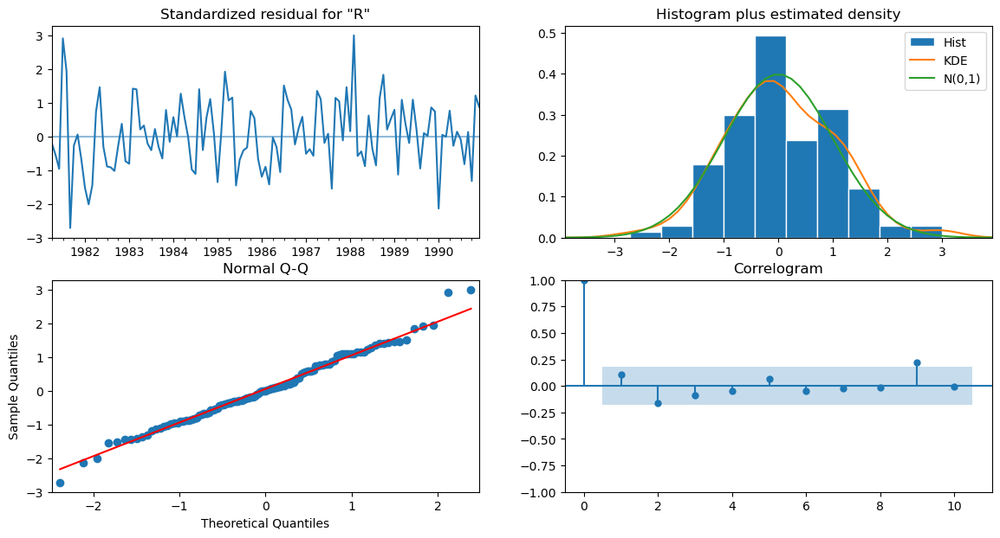

In [146]:
results_auto_SARIMA_rose_log.plot_diagnostics()
plt.show()

In [147]:
predicted_auto_SARIMA_rose_log = results_auto_SARIMA_rose_log.get_forecast(steps=len(SARIMA_test['Rose']))

In [148]:
predicted_auto_SARIMA_rose_log.summary_frame(alpha=0.05).head()

Rose,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-01,1.754735,0.076361,1.605070,1.904400
1991-02-01,1.821744,0.076453,1.671898,1.971590
1991-03-01,1.848372,0.076596,1.698247,1.998497
1991-04-01,1.821956,0.076738,1.671552,1.972360
1991-05-01,1.839040,0.076880,1.688358,1.989723


In [149]:
rose_forecasted_log = predicted_auto_SARIMA_rose_log.predicted_mean
SARIMA_test['rose_forecasted_log'] = np.power(10, predicted_auto_SARIMA_rose_log.predicted_mean)
SARIMA_test.head()

,Rose,rose_forecasted,rose_forecasted_log
YearMonth,,,
1991-01-01,54.0,44.213524,56.850541
1991-02-01,55.0,62.326767,66.335190
1991-03-01,66.0,67.313318,70.529652
1991-04-01,65.0,63.161053,66.367631
1991-05-01,60.0,66.474277,69.030404


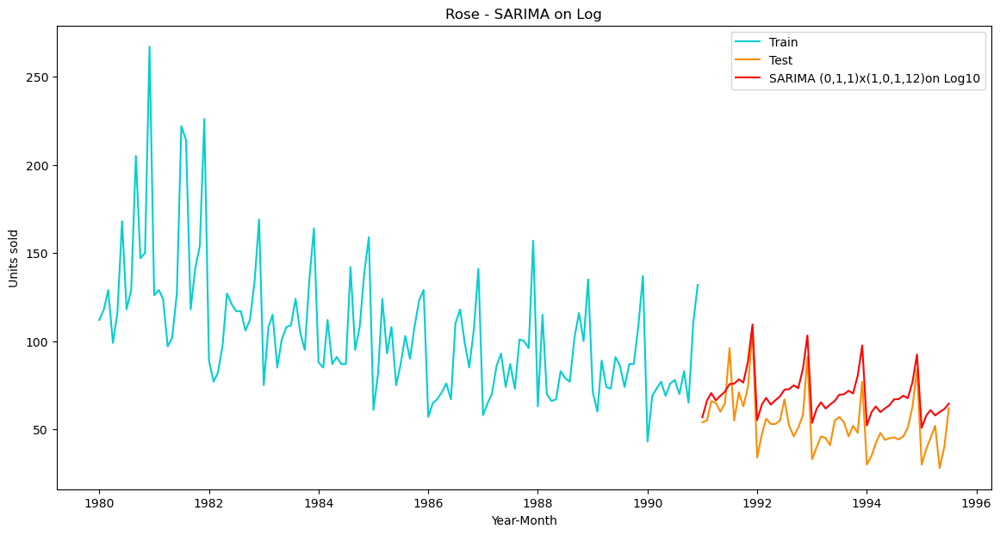

In [150]:
plt.plot(SARIMA_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(SARIMA_test['Rose'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['rose_forecasted_log'], color='red', label='SARIMA (0,1,1)x(1,0,1,12)on Log10')
plt.ylabel('Units sold')
plt.xlabel('Year-Month')
plt.title('Rose - SARIMA on Log')
plt.legend(loc='best');

In [151]:
rmse_SARIMA_auto_model_log = metrics.mean_squared_error(SARIMA_test['Rose'],SARIMA_test['rose_forecasted_log'],squared=False)
print("For Auto-SARIMA_log Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SARIMA_auto_model_log))

For Auto-SARIMA_log Model forecast on the Test Data, RMSE is 17.918


In [152]:
resultsDf_11 = pd.DataFrame({'Test RMSE': [rmse_SARIMA_auto_model_log]}
                           ,index=['Auto_SARIMA_log(0, 1, 1)*(1, 0, 1, 12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_11])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


#### MANUAL ARIMA MODEL:

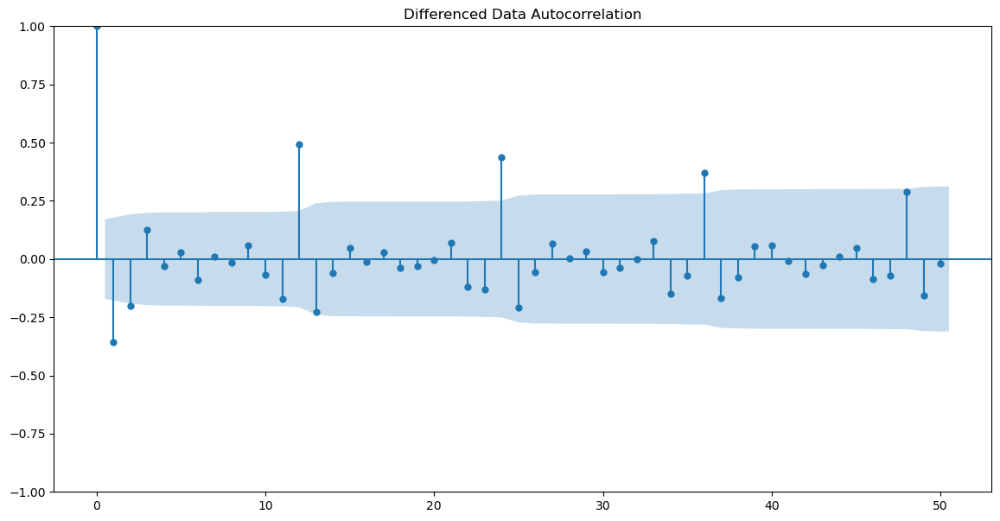

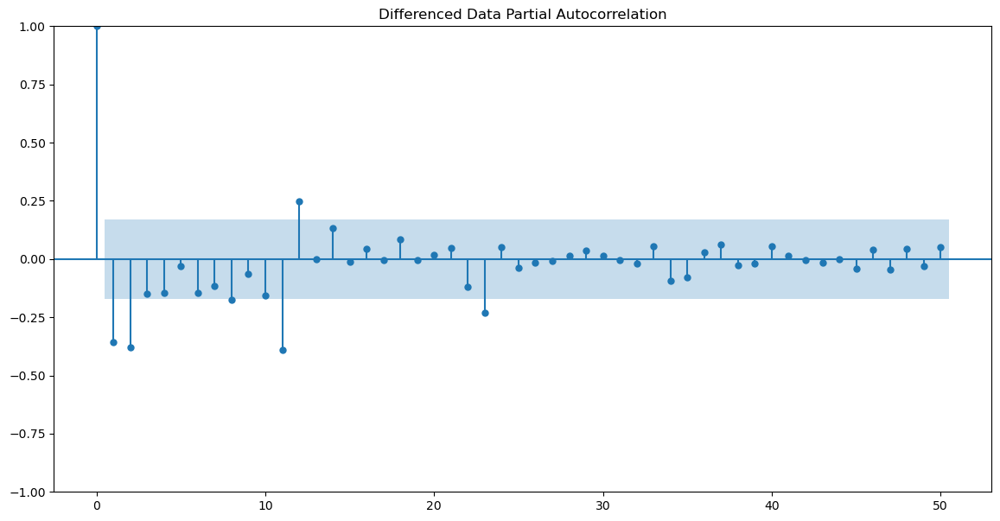

In [153]:
plot_acf(train_rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(train_rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

In [154]:
manual_ARIMA = ARIMA(train_rose['Rose'].astype('float64'), order=(0,1,0))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -665.577
Date:                Sat, 14 Sep 2024   AIC                           1333.155
Time:                        17:09:50   BIC                           1336.030
Sample:                    01-01-1980   HQIC                          1334.323
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1515.6738    122.418     12.381      0.000    1275.740    1755.608
Ljung-Box (L1) (Q):                  17.11   Jarque-Bera (JB):                59.55
Prob(Q):                              0.00   Pr

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [155]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test_rose['Rose']))

In [156]:
# rmse_arima_manual_model = metrics.mean_squared_error(test_rose['Rose'],predicted_manual_ARIMA[0],squared=False)
# print("For Manual-ARIMA Model forecast on the Test Data, RMSE is %3.3f" %(rmse_arima_manual_model))
predicted_manual_ARIMA = results_manual_ARIMA.forecast(len(test_rose['Rose']))

# Calculate RMSE
rmse_arima_manual_model = metrics.mean_squared_error(test_rose['Rose'], predicted_manual_ARIMA, squared=False)
print("For Manual-ARIMA Model forecast on the Test Data, RMSE is %3.3f" % rmse_arima_manual_model)

For Manual-ARIMA Model forecast on the Test Data, RMSE is 79.746


In [157]:
resultsDf_12 = pd.DataFrame({'Test RMSE': [rmse_arima_manual_model]}
                           ,index=['Manual_ARIMA(0,1,0)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_12])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


#### MANUAL SARIMA MODEL:

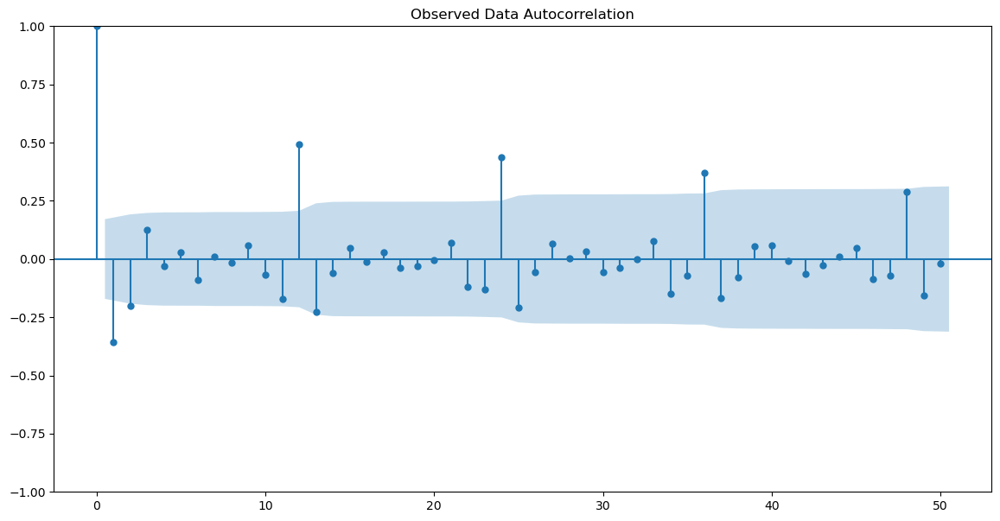

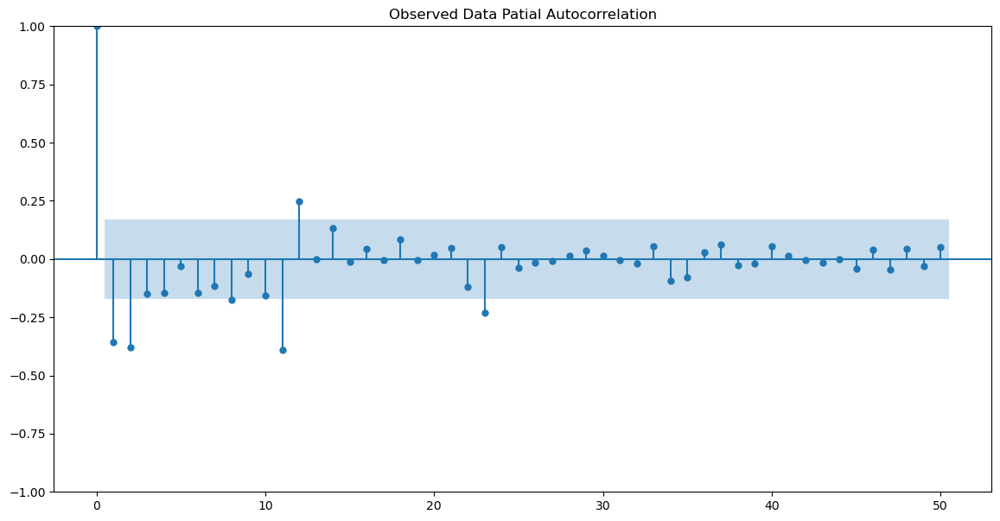

In [158]:
plot_acf(SARIMA_train['Rose'].diff().dropna(),lags=50,title='Observed Data Autocorrelation')
plot_pacf(SARIMA_train['Rose'].diff().dropna(),lags=50,title='Observed Data Patial Autocorrelation')
plt.show()

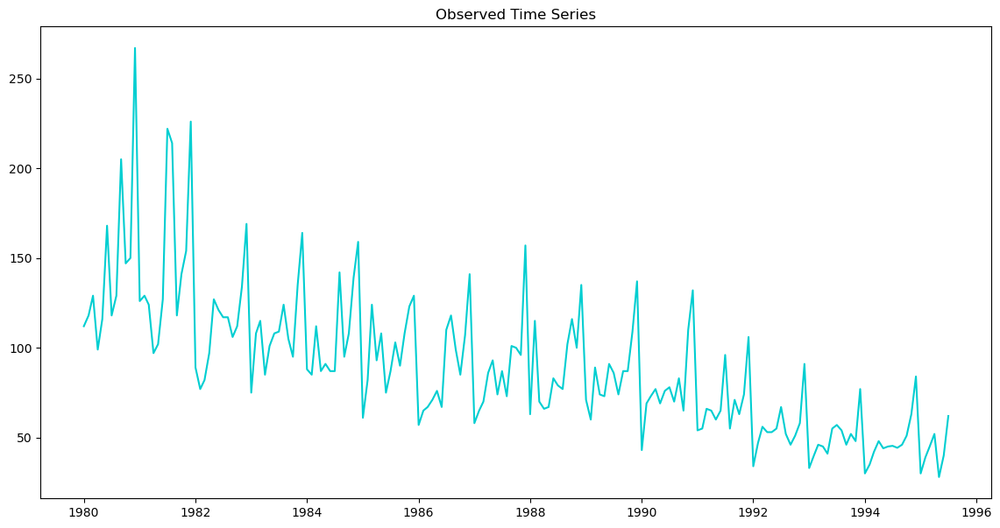

In [159]:
plt.plot(df_rose['Rose'], color = 'darkturquoise')
plt.title ('Observed Time Series');

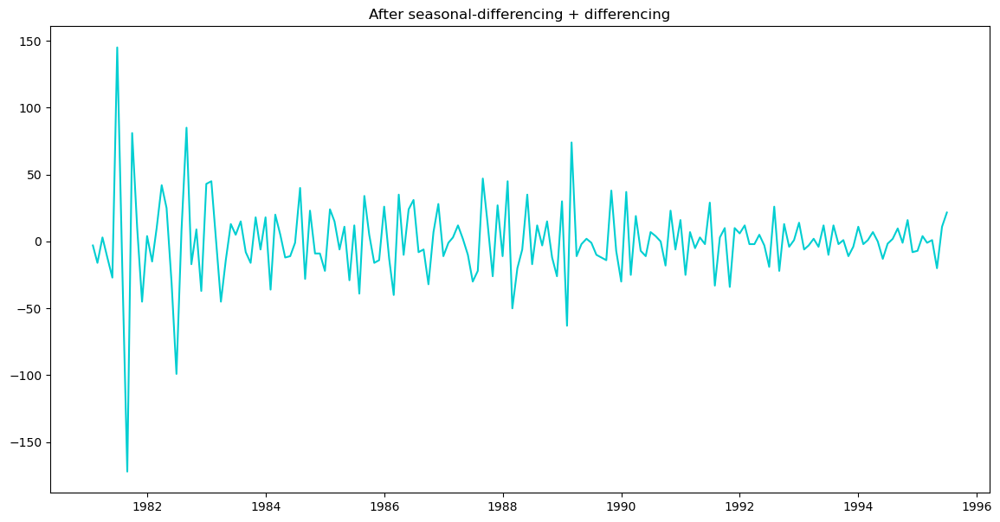

In [160]:
plt.plot((df_rose['Rose'].diff(12).dropna()).diff().dropna(),  color = 'darkturquoise')
plt.title ('After seasonal-differencing + differencing');

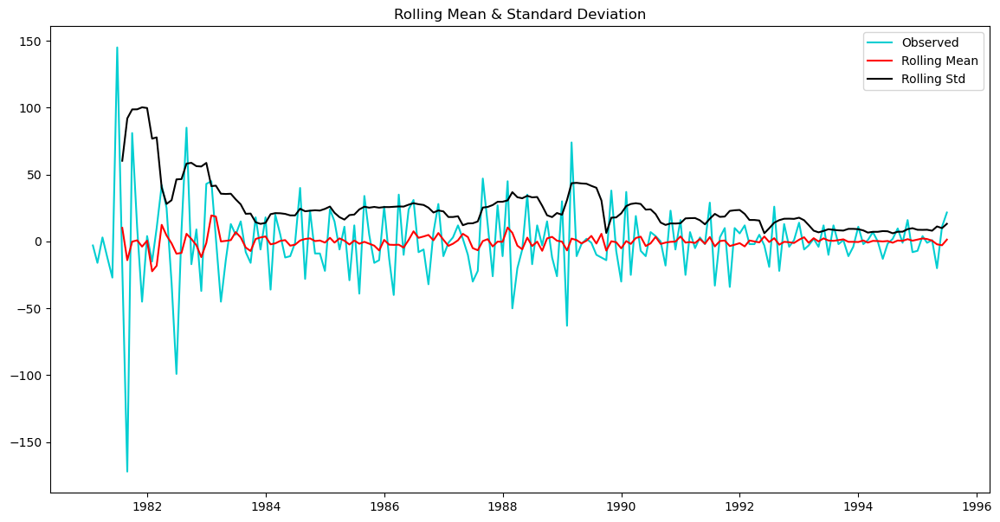

Results of Dickey-Fuller Test:
Test Statistic                  -4.605791
p-value                          0.000126
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [161]:
test_stationarity((df_rose['Rose'].diff(12).dropna()).diff().dropna(),'darkturquoise')

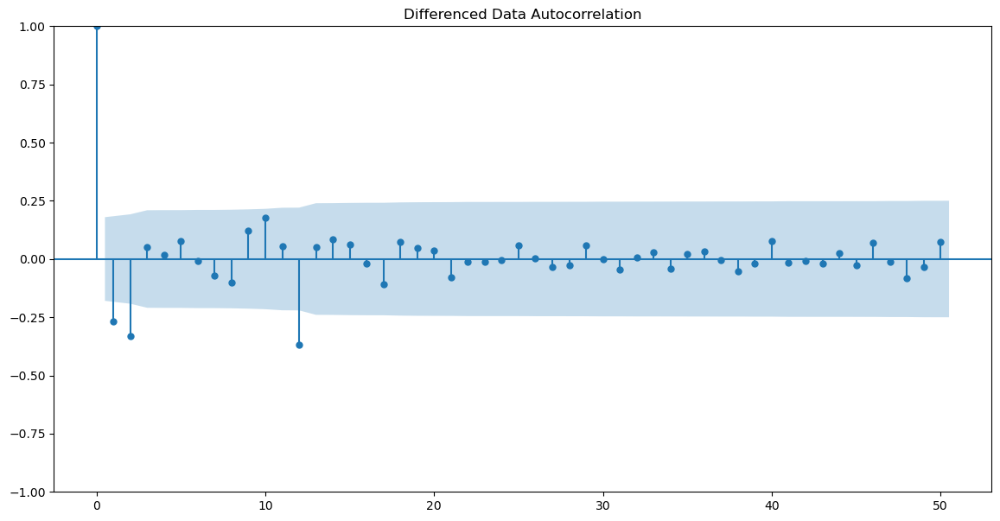

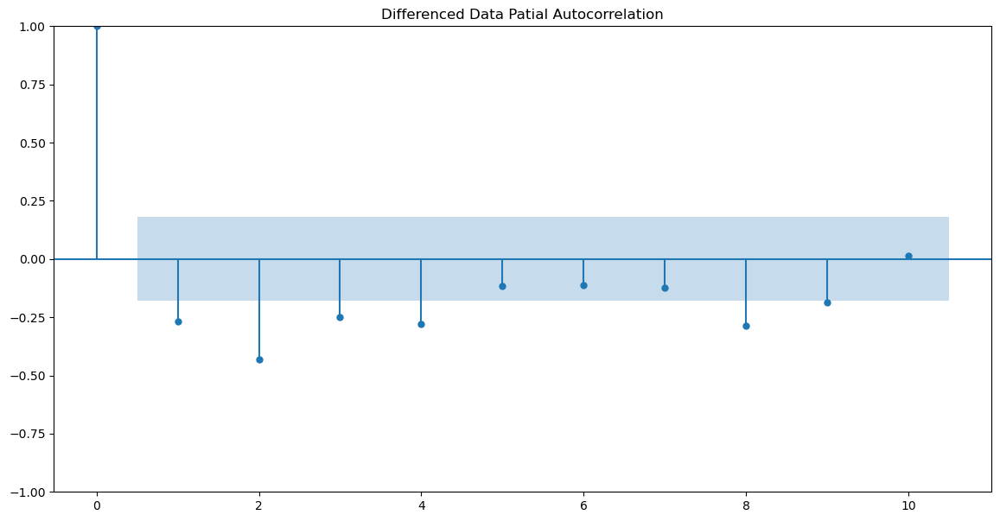

In [162]:
plot_acf((SARIMA_train['Rose'].diff(12).dropna()).diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf((SARIMA_train['Rose'].diff(12).dropna()).diff().dropna(),lags=10,title='Differenced Data Patial Autocorrelation')
plt.show()

In [163]:
manual_SARIMA_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                order=(4, 1, 2),
                                seasonal_order=(0, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_rose = manual_SARIMA_rose.fit(maxiter=1000)
print(results_manual_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -384.369
Date:                            Sat, 14 Sep 2024   AIC                            786.737
Time:                                    17:09:52   BIC                            809.433
Sample:                                         0   HQIC                           795.898
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8967      0.132     -6.814      0.000      -1.155      -0.639
ar.L2          0.0165      0.171   

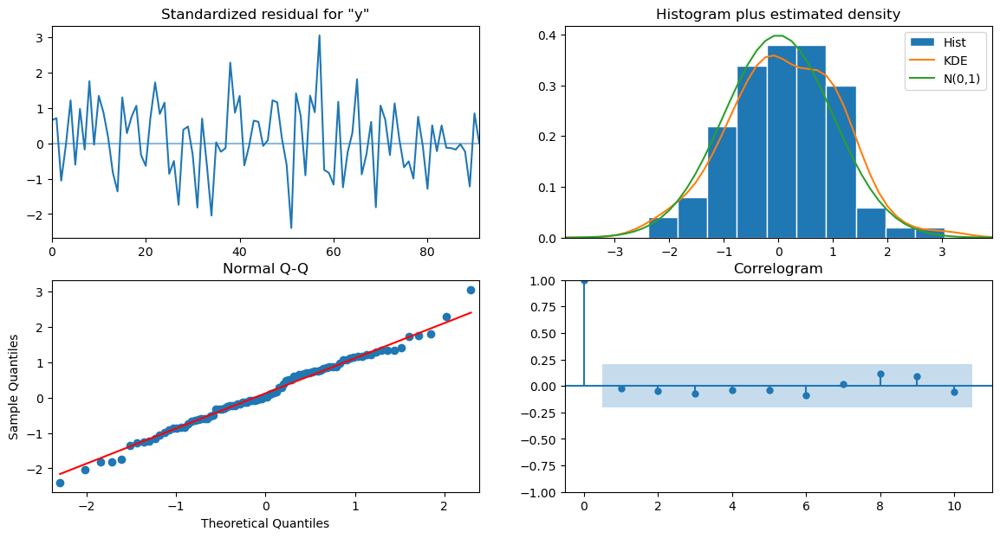

In [164]:
results_manual_SARIMA_rose.plot_diagnostics()
plt.show()

In [165]:
predicted_manual_SARIMA = results_manual_SARIMA_rose.get_forecast(steps=len(SARIMA_test['Rose']))

In [166]:
predicted_manual_SARIMA.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,44.733041,15.552666,14.250376,75.215705
1,64.208694,16.000767,32.847767,95.569620
2,65.110689,16.074606,33.605041,96.616338
3,68.453063,16.150995,36.797693,100.108432
4,61.423433,16.154555,29.761086,93.085780


In [167]:
manual_rose_forecasted = predicted_manual_SARIMA.predicted_mean
SARIMA_test['manual_rose_forecasted'] = predicted_manual_SARIMA.predicted_mean
SARIMA_test.head()

,Rose,rose_forecasted,rose_forecasted_log,manual_rose_forecasted
YearMonth,,,,
1991-01-01,54.0,44.213524,56.850541,44.733041
1991-02-01,55.0,62.326767,66.335190,64.208694
1991-03-01,66.0,67.313318,70.529652,65.110689
1991-04-01,65.0,63.161053,66.367631,68.453063
1991-05-01,60.0,66.474277,69.030404,61.423433


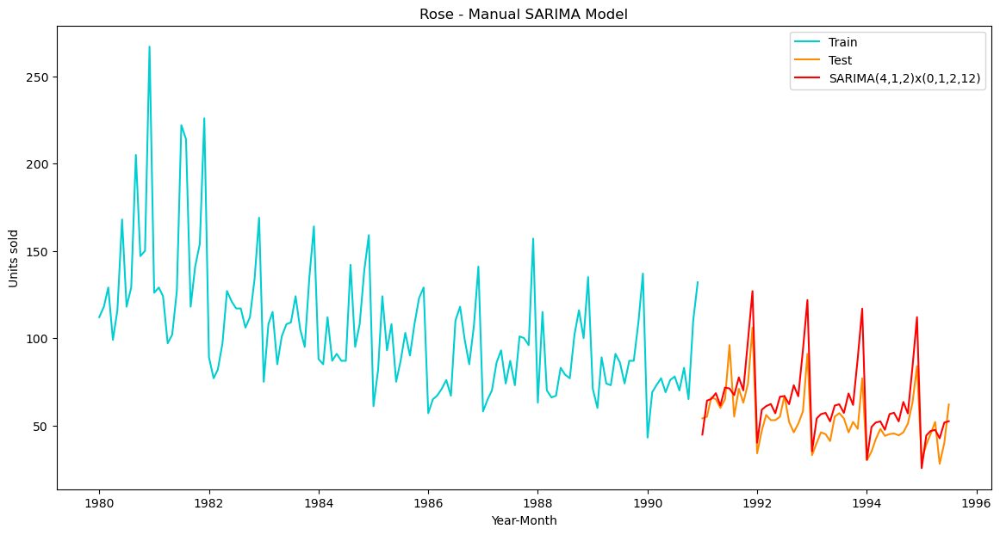

In [168]:
plt.plot(SARIMA_train['Rose'], label='Train', color = 'darkturquoise')
plt.plot(SARIMA_test['Rose'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['manual_rose_forecasted'], color='red', label='SARIMA(4,1,2)x(0,1,2,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Rose - Manual SARIMA Model')
plt.legend(loc='best');

In [169]:
rmse_SARIMA_manual_model = metrics.mean_squared_error(SARIMA_test['Rose'],predicted_manual_SARIMA.predicted_mean,squared=False)
print("For Manual-SARIMA Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SARIMA_manual_model))

For Manual-SARIMA Model forecast on the Test Data, RMSE is 15.389


### COMPARING AND FINDING BEST MODEL FROM ALL THE OTHER MODELS:

In [170]:
resultsDf_13 = pd.DataFrame({'Test RMSE': [rmse_SARIMA_manual_model]}
                           ,index=['Manual_SARIMA(4, 1, 2)*(0, 1, 2, 12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_13])
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


In [171]:
rose_resultsDf

,Test RMSE
RegressionOnTime,15.278369
NaiveModel,79.745697
SimpleAverage,15.773671
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
"Alpha=0.0987, SES Optimized",37.620427
"Alpha=0.10,SES_Iterative",36.856268
"Alpha=0.0,Beta=0.0, DES Optimized",63.074706


In [172]:
rose_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE
2 point TMA,11.530054
4 point TMA,14.458402
6 point TMA,14.572976
9 point TMA,14.732918
RegressionOnTime,15.278369
"Manual_SARIMA(4, 1, 2)*(0, 1, 2, 12)",15.388806
SimpleAverage,15.773671
"Auto_SARIMA(0, 1, 2)*(2, 1, 2, 12)",16.527690
"Auto_SARIMA_log(0, 1, 1)*(1, 0, 1, 12)",17.917694
"Alpha=0.065,Beta=0.054,gamma=0.0 TES Optimized",20.194223


In [173]:
Full_model_TES_rose = ExponentialSmoothing(df_rose['Rose'],trend='additive',seasonal='multiplicative')
Full_model_TES_rose_fit = Full_model_TES_rose.fit(smoothing_level=0.1,smoothing_trend=0.2,smoothing_seasonal=0.3,optimized=True,use_brute=True)
TES_rose_forecast = Full_model_TES_rose_fit.forecast(steps=12)

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [174]:
rmse_rose_tes_full = metrics.mean_squared_error(df_rose['Rose'],Full_model_TES_rose_fit.fittedvalues,squared=False)
print("For Triple Exponential Smoothing Model forecast on the Entire Data, RMSE is %3.3f" %(rmse_rose_tes_full))

For Triple Exponential Smoothing Model forecast on the Entire Data, RMSE is 17.887


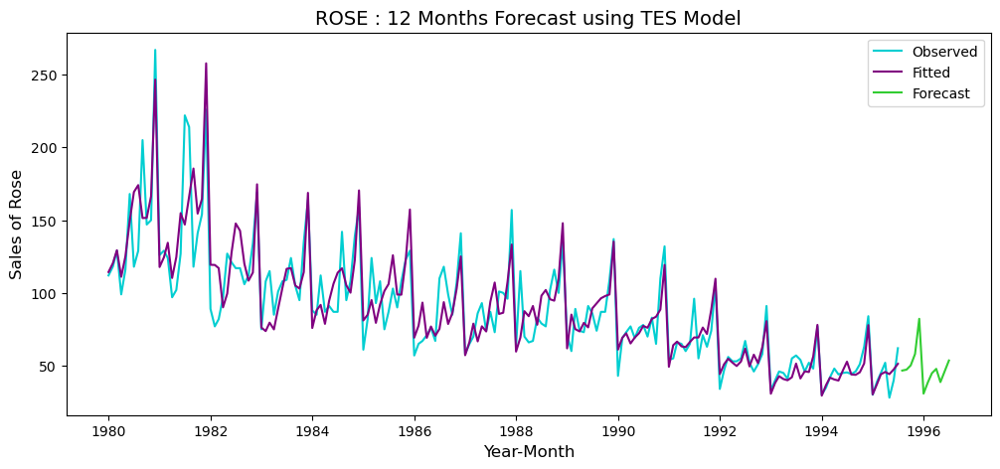

In [175]:
plt.figure(figsize=(12,5))

plt.plot(df_rose['Rose'], label='Observed', color = 'darkturquoise')
plt.plot(Full_model_TES_rose_fit.fittedvalues, label='Fitted', color = 'purple')
plt.plot(TES_rose_forecast, label='Forecast', color = 'limegreen')

plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales of Rose',fontsize=12)
plt.title('ROSE : 12 Months Forecast using TES Model', fontsize=14)

plt.legend(loc='best')
plt.show()

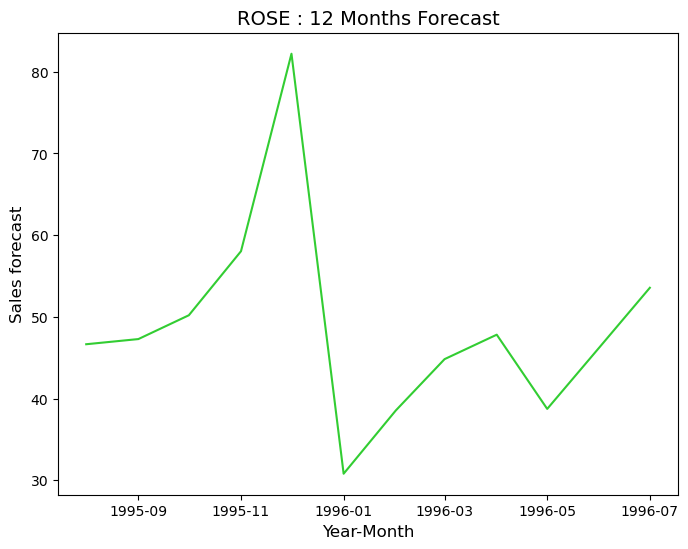

In [176]:
plt.figure(figsize=(8,6))
plt.plot(TES_rose_forecast, label='Forecast', color = 'limegreen')
plt.xlabel('Year-Month',fontsize=12)
plt.ylabel('Sales forecast',fontsize=12)
plt.title('ROSE : 12 Months Forecast', fontsize=14);

In [177]:
TES_rose_forecast

1995-08-01    46.645790
1995-09-01    47.277865
1995-10-01    50.192393
1995-11-01    58.032966
1995-12-01    82.211767
1996-01-01    30.793144
1996-02-01    38.536058
1996-03-01    44.822234
1996-04-01    47.814473
1996-05-01    38.727986
1996-06-01    46.255071
1996-07-01    53.559025
Freq: MS, dtype: float64

In [178]:
TES_rose_forecast.describe()

count    12.000000
mean     48.739064
std      12.747211
min      30.793144
25%      43.298672
50%      46.961827
75%      51.034051
max      82.211767
dtype: float64

In [179]:
TES_rose_forecast.sum()

584.8687702972678

### FOR SPARKING DATASET FORECASTING:

In [180]:
spark_df.head()

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


In [379]:
spark_df.tail()

,YearMonth,Sparkling
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688
186,1995-07,2031


In [381]:
spark_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   YearMonth  187 non-null    object
 1   Sparkling  187 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.1+ KB


In [383]:
Date = pd.date_range(start='1/1/1980', end='8/1/1995', freq='M')
Date

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='ME')

In [385]:
spark_df['Time_Stamp'] = pd.DataFrame(Date,columns=['Month'])
spark_df.head()

,YearMonth,Sparkling,Time_Stamp
0,1980-01,1686,1980-01-31
1,1980-02,1591,1980-02-29
2,1980-03,2304,1980-03-31
3,1980-04,1712,1980-04-30
4,1980-05,1471,1980-05-31


In [387]:
spark_df.set_index('Time_Stamp',inplace=True)
spark_df.drop(['YearMonth'], axis=1, inplace=True)
spark_df.head()

,Sparkling
Time_Stamp,
1980-01-31,1686
1980-02-29,1591
1980-03-31,2304
1980-04-30,1712
1980-05-31,1471


In [391]:
spark = pd.read_csv('Sparkling.csv', header = 0, index_col = 0, parse_dates = True)
df_spark = spark.squeeze("columns")
printmd('**First 5 rows for Rose Wine :**')
df_spark.head()

**First 5 rows for Rose Wine :**

YearMonth
1980-01-01    1686
1980-02-01    1591
1980-03-01    2304
1980-04-01    1712
1980-05-01    1471
Name: Sparkling, dtype: int64

In [393]:
printmd('**View the bottom 5 rows of Sparkling dataset :**')
df_spark.tail()

**View the bottom 5 rows of Sparkling dataset :**

YearMonth
1995-03-01    1897
1995-04-01    1862
1995-05-01    1670
1995-06-01    1688
1995-07-01    2031
Name: Sparkling, dtype: int64

In [395]:
printmd('**The number of Null values in Sparkling dataset:**')
print(df_spark.isnull().sum())

**The number of Null values in Sparkling dataset:**

0


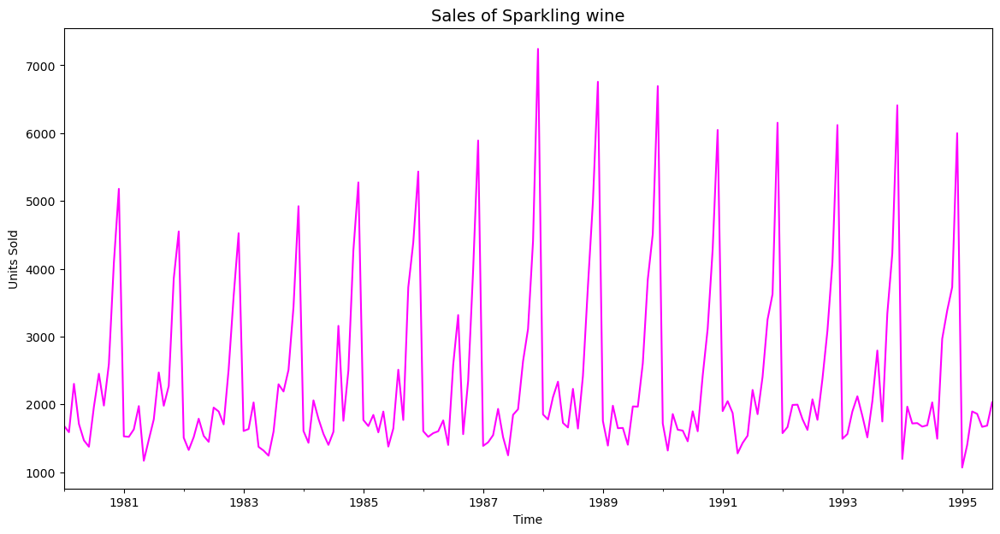

In [397]:
df_spark.plot(color='magenta') 
plt.title('Sales of Sparkling wine', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Units Sold')
plt.show()

In [399]:
printmd('**Data Description for Sparkling Dataset:**')
df_spark.describe()

**Data Description for Sparkling Dataset:**

count     187.000000
mean     2402.417112
std      1295.111540
min      1070.000000
25%      1605.000000
50%      1874.000000
75%      2549.000000
max      7242.000000
Name: Sparkling, dtype: float64

**Yearly Boxplot for Sparkling Dataset:**

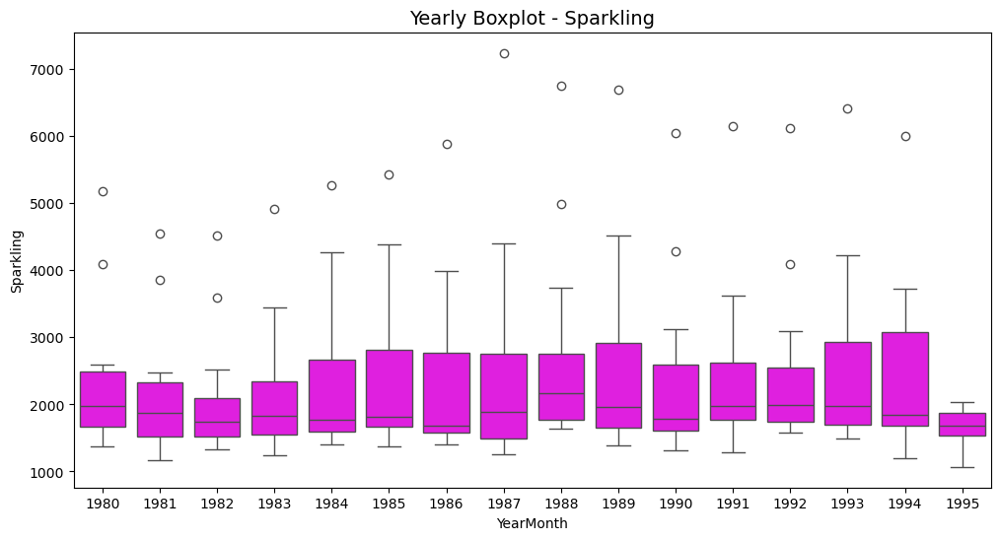

In [401]:
printmd('**Yearly Boxplot for Sparkling Dataset:**')
plt.figure(figsize = (12, 6))
sns.boxplot(x = df_spark.index.year,y = df_spark, color = 'magenta')
plt.title('Yearly Boxplot - Sparkling', fontsize=14)
plt.show()

**Monthly Boxplot for all the years for Sparkling Dataset:**

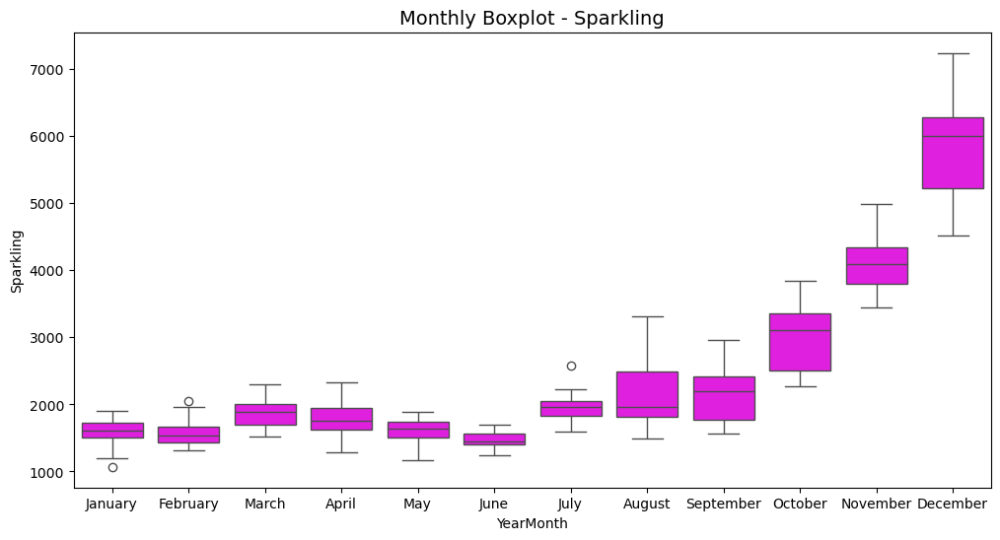

In [403]:
printmd('**Monthly Boxplot for all the years for Sparkling Dataset:**')
plt.figure(figsize = (12, 6))
sns.boxplot(x = df_spark.index.month_name(),y = df_spark, color='magenta')
plt.title('Monthly Boxplot - Sparkling', fontsize=14)
plt.show()

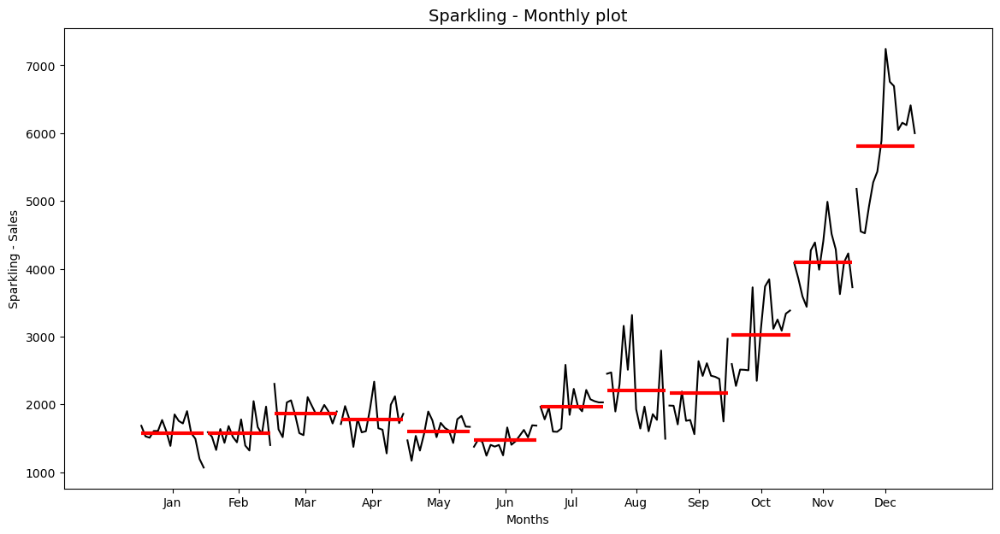

In [405]:
from statsmodels.graphics.tsaplots import month_plot
month_plot(df_spark,ylabel='Sparkling - Sales')
plt.xlabel('Months')
plt.title('Sparkling - Monthly plot', fontsize = 14)
plt.show()

In [407]:
monthly_sales_across_years_spark = pd.pivot_table(pd.DataFrame(df_spark), columns = df_spark.index.month, 
                                                      index = df_spark.index.year)
monthly_sales_across_years_spark

Sparkling                                                          \
YearMonth        1       2       3       4       5       6       7       8    
YearMonth                                                                     
1980         1686.0  1591.0  2304.0  1712.0  1471.0  1377.0  1966.0  2453.0   
1981         1530.0  1523.0  1633.0  1976.0  1170.0  1480.0  1781.0  2472.0   
1982         1510.0  1329.0  1518.0  1790.0  1537.0  1449.0  1954.0  1897.0   
1983         1609.0  1638.0  2030.0  1375.0  1320.0  1245.0  1600.0  2298.0   
1984         1609.0  1435.0  2061.0  1789.0  1567.0  1404.0  1597.0  3159.0   
1985         1771.0  1682.0  1846.0  1589.0  1896.0  1379.0  1645.0  2512.0   
1986         1606.0  1523.0  1577.0  1605.0  1765.0  1403.0  2584.0  3318.0   
1987         1389.0  1442.0  1548.0  1935.0  1518.0  1250.0  1847.0  1930.0   
1988         1853.0  1779.0  2108.0  2336.0  1728.0  1661.0  2230.0  1645.0   
1989         1757.0  1394.0  1982.0  1650.0  1654.0  1406.0  1971.0  1968.0   
1990         1720.0  1321.0  1859.0  1628.0  1615.0  1457.0  1899.0  1605.0   
1991         1902.0  2049.0  1874.0  1279.0  1432.0  1540.0  2214.0  1857.0   
1992         1577.0  1667.0  1993.0  1997.0  1783.0  1625.0  2076.0  1773.0   
1993         1494.0  1564.0  1898.0  2121.0  1831.0  1515.0  2048.0  2795.0   
1994         1197.0  1968.0  1720.0  1725.0  1674.0  1693.0  2031.0  1495.0   
1995         1070.0  1402.0  1897.0  1862.0  1670.0  1688.0  2031.0     NaN   

                                           
YearMonth      9       10      11      12  
YearMonth                                  
1980       1984.0  2596.0  4087.0  5179.0  
1981       1981.0  2273.0  3857.0  4551.0  
1982       1706.0  2514.0  3593.0  4524.0  
1983       2191.0  2511.0  3440.0  4923.0  
1984       1759.0  2504.0  4273.0  5274.0  
1985       1771.0  3727.0  4388.0  5434.0  
1986       1562.0  2349.0  3987.0  5891.0  
1987       2638.0  3114.0  4405.0  7242.0  
1988       2421.0  3740.0  4988.0  6757.0  
1989       2608.0  3845.0  4514.0  6694.0  
1990       2424.0  3116.0  4286.0  6047.0  
1991       2408.0  3252.0  3627.0  6153.0  
1992       2377.0  3088.0  4096.0  6119.0  
1993       1749.0  3339.0  4227.0  6410.0  
1994       2968.0  3385.0  3729.0  5999.0  
1995          NaN     NaN     NaN     NaN

**Monthly Wine sales across years for Sparkling:**

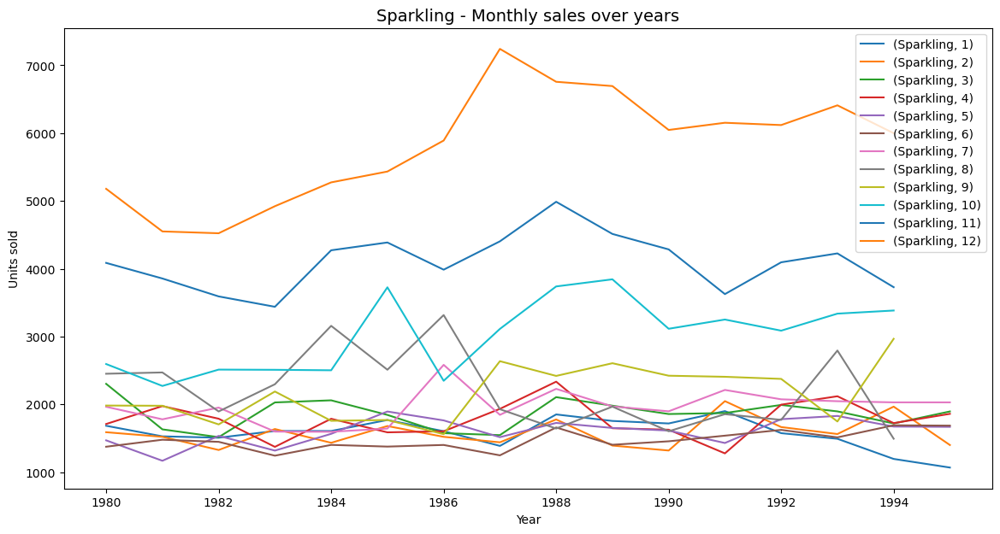

In [409]:
printmd('**Monthly Wine sales across years for Sparkling:**')
monthly_sales_across_years_spark.plot()
plt.legend(loc='best')
plt.ylabel('Units sold')
plt.xlabel('Year')
plt.title('Sparkling - Monthly sales over years', fontsize=14)
plt.show()

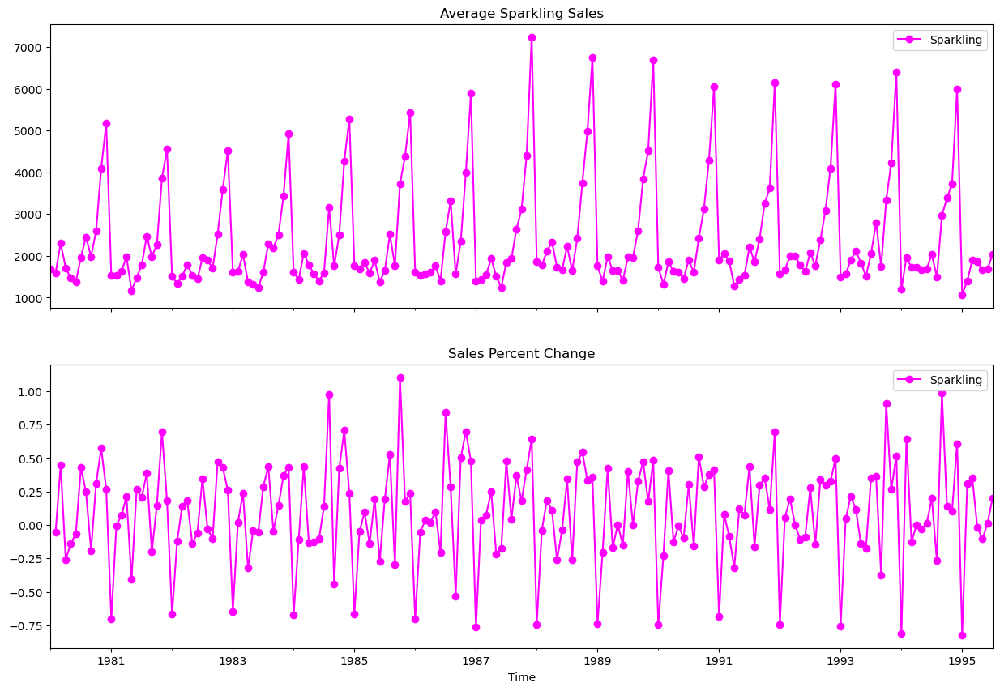

In [411]:
# group by date and get average Sparkling sales and precent change
average_spark    = df_spark.groupby(spark.index).mean()
pct_change_spark = df_spark.groupby(spark.index).sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,10))
# plot average Sparkling sales over time(year-month)
ax1 = average_spark.plot(legend=True,ax=axis1,marker='o',title="Average Sparkling Sales", color = 'magenta')
# plot precent change for Sales over time(year-month)
ax2 = pct_change_spark.plot(legend=True,ax=axis2,marker='o',color='magenta',title="Sales Percent Change")
plt.xlabel('Time')
plt.legend(loc='best')
plt.show()

In [413]:
from statsmodels.tsa.seasonal import seasonal_decompose

**Decomposition of Sparkling Time Series with additive Seasonality:**

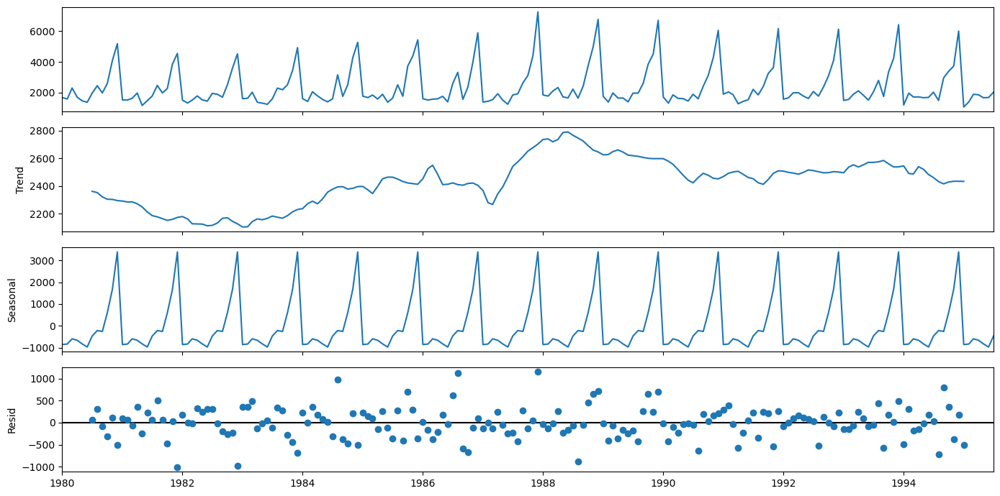

In [415]:
printmd('**Decomposition of Sparkling Time Series with additive Seasonality:**')
decomposition_add = seasonal_decompose(spark,model='additive')
decomposition_add.plot();

**Decomposition of Sparkling Time Series with multiplicative Seasonality:**

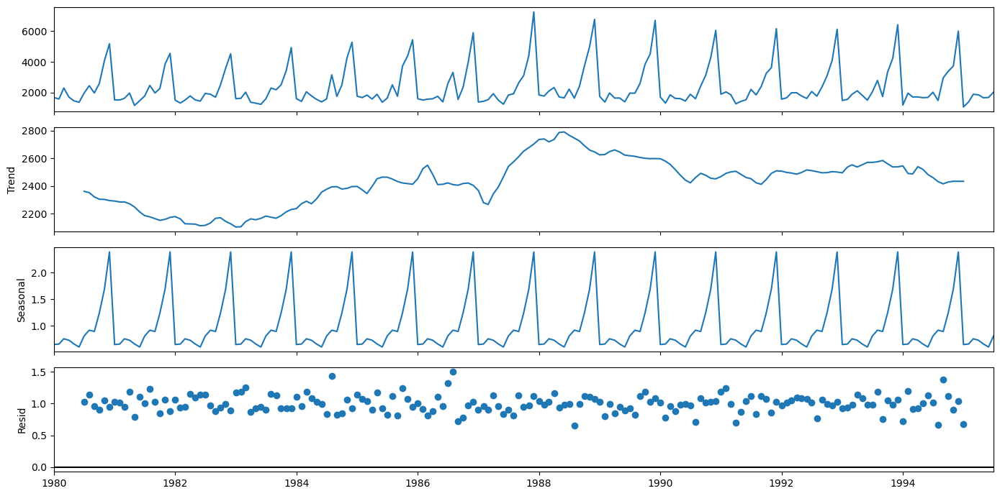

In [417]:
printmd('**Decomposition of Sparkling Time Series with multiplicative Seasonality:**')
decomposition_mul = seasonal_decompose(spark,model='multiplicative')
decomposition_mul.plot();

In [419]:
df_spark = pd.DataFrame(df_spark)
train_spark = df_spark[df_spark.index.year < 1991]
test_spark = df_spark[df_spark.index.year >= 1991]

In [421]:
print('Length of Train Data:', len(train_spark))
print('Length of Test Data:', len(test_spark))

Length of Train Data: 132
Length of Test Data: 55


In [423]:
print('First few rows of Training Data:','\n',train_spark.head(),'\n')
print('Last few rows of Training Data:','\n',train_spark.tail(),'\n')
print('First few rows of Test Data:','\n',test_spark.head(),'\n')
print('Last few rows of Test Data:','\n',test_spark.tail(),'\n')

First few rows of Training Data: 
             Sparkling
YearMonth            
1980-01-01       1686
1980-02-01       1591
1980-03-01       2304
1980-04-01       1712
1980-05-01       1471 

Last few rows of Training Data: 
             Sparkling
YearMonth            
1990-08-01       1605
1990-09-01       2424
1990-10-01       3116
1990-11-01       4286
1990-12-01       6047 

First few rows of Test Data: 
             Sparkling
YearMonth            
1991-01-01       1902
1991-02-01       2049
1991-03-01       1874
1991-04-01       1279
1991-05-01       1432 

Last few rows of Test Data: 
             Sparkling
YearMonth            
1995-03-01       1897
1995-04-01       1862
1995-05-01       1670
1995-06-01       1688
1995-07-01       2031 



In [425]:
print(train_spark.shape)
print(test_spark.shape)

(132, 1)
(55, 1)


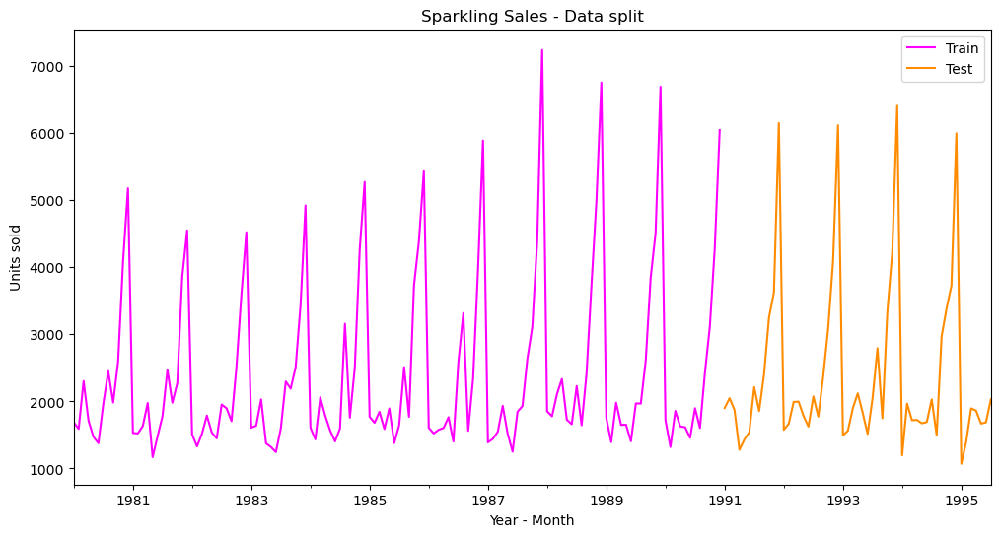

In [427]:
plt.figure(figsize = (12, 6))
train_spark['Sparkling'].plot(label = 'Train',color='magenta')
test_spark['Sparkling'].plot(label = 'Test',color='darkorange')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling Sales - Data split', fontsize = 12)
plt.show();

In [429]:
train_time = [i+1 for i in range(len(train_spark))]
test_time = [i+133 for i in range(len(test_spark))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [431]:
LinearRegression_train_spark = train_spark.copy()
LinearRegression_test_spark = test_spark.copy()

In [433]:
LinearRegression_train_spark['time'] = train_time
LinearRegression_test_spark['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train_spark.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train_spark.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test_spark.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test_spark.tail(),'\n')

First few rows of Training Data 
             Sparkling  time
YearMonth                  
1980-01-01       1686     1
1980-02-01       1591     2
1980-03-01       2304     3
1980-04-01       1712     4
1980-05-01       1471     5 

Last few rows of Training Data 
             Sparkling  time
YearMonth                  
1990-08-01       1605   128
1990-09-01       2424   129
1990-10-01       3116   130
1990-11-01       4286   131
1990-12-01       6047   132 

First few rows of Test Data 
             Sparkling  time
YearMonth                  
1991-01-01       1902   133
1991-02-01       2049   134
1991-03-01       1874   135
1991-04-01       1279   136
1991-05-01       1432   137 

Last few rows of Test Data 
             Sparkling  time
YearMonth                  
1995-03-01       1897   183
1995-04-01       1862   184
1995-05-01       1670   185
1995-06-01       1688   186
1995-07-01       2031   187 



### LINEAR REGRESSION MODEL:

In [435]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(LinearRegression_train_spark[['time']],LinearRegression_train_spark['Sparkling'].values)

LinearRegression()

In [437]:
LinearRegression_train_spark['RegOnTime_spark'] = lr.predict(LinearRegression_train_spark[['time']])
LinearRegression_test_spark['RegOnTime_spark'] = lr.predict(LinearRegression_test_spark[['time']])

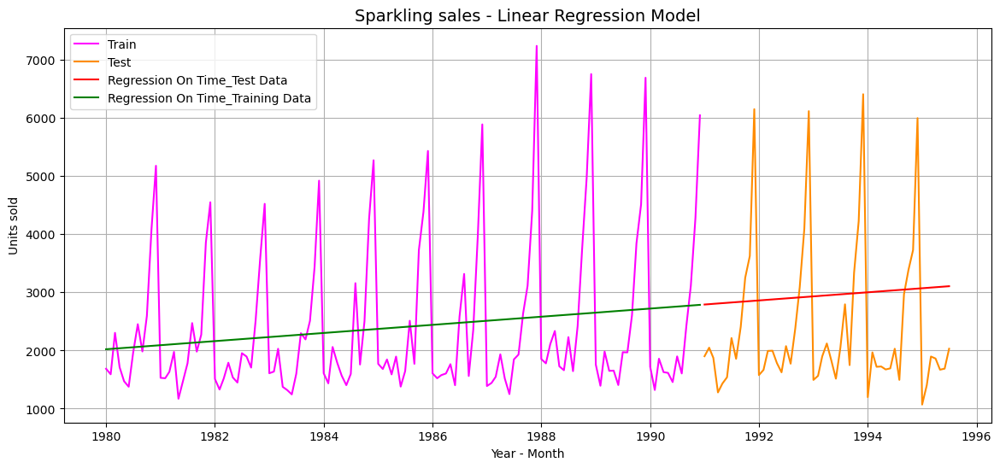

In [439]:
plt.figure(figsize=(14,6))
plt.plot( train_spark['Sparkling'], label='Train',color = 'magenta')
plt.plot(test_spark['Sparkling'], label='Test',color = 'darkorange')
plt.plot(LinearRegression_test_spark['RegOnTime_spark'], label='Regression On Time_Test Data',color = 'red')
plt.plot(LinearRegression_train_spark['RegOnTime_spark'], label='Regression On Time_Training Data',color = 'green')
plt.title('Sparkling sales - Linear Regression Model', fontsize = 14)
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.grid();

In [443]:
rmse_reg = metrics.mean_squared_error(test_spark['Sparkling'],LinearRegression_test_spark['RegOnTime_spark'],squared=False)
print("For Regression On Time forecast on the Test Data, RMSE is %3.3f " %(rmse_reg))

For Regression On Time forecast on the Test Data, RMSE is 1389.135 


In [445]:
spark_resultsDf = pd.DataFrame({'Test RMSE': [rmse_reg]},index=['RegressionOnTime'])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175


### NAIVE MODEL:

In [447]:
NaiveModel_train = train_spark.copy()
NaiveModel_test = test_spark.copy()

In [449]:
NaiveModel_train['spark_naive'] = np.asarray(train_spark['Sparkling'])[len(np.asarray(train_spark['Sparkling']))-1]
NaiveModel_train['spark_naive'].head()

YearMonth
1980-01-01    6047
1980-02-01    6047
1980-03-01    6047
1980-04-01    6047
1980-05-01    6047
Name: spark_naive, dtype: int64

In [451]:
NaiveModel_test['spark_naive'] = np.asarray(train_spark['Sparkling'])[len(np.asarray(train_spark['Sparkling']))-1]
NaiveModel_test['spark_naive'].head()

YearMonth
1991-01-01    6047
1991-02-01    6047
1991-03-01    6047
1991-04-01    6047
1991-05-01    6047
Name: spark_naive, dtype: int64

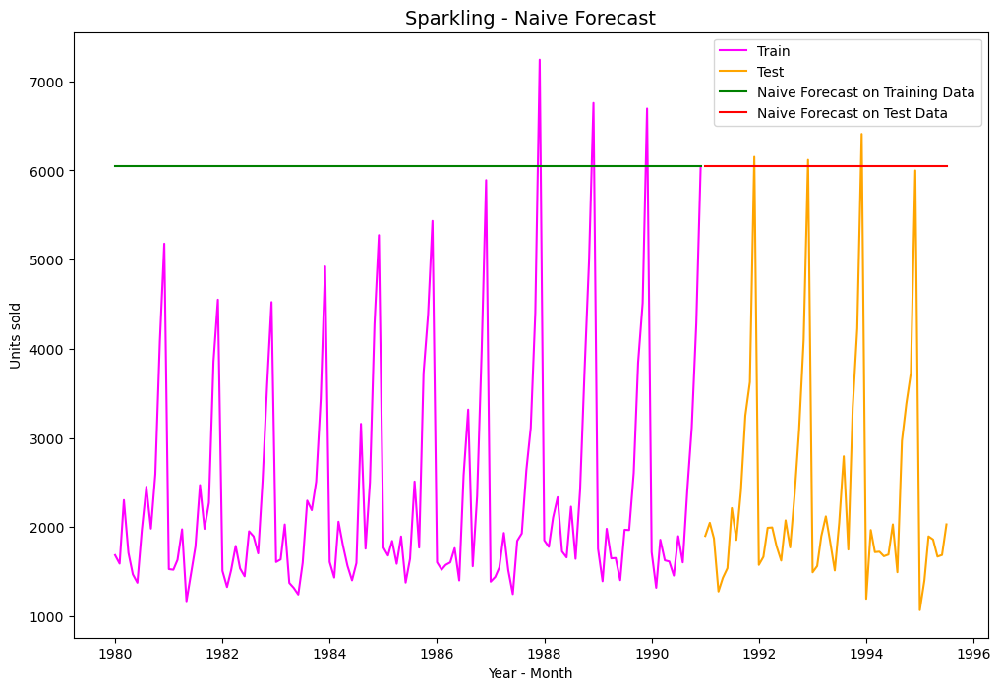

In [453]:
plt.figure(figsize=(12,8))
plt.plot(NaiveModel_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(test_spark['Sparkling'], label='Test', color = 'orange')
plt.plot(NaiveModel_train['spark_naive'], label='Naive Forecast on Training Data', color = 'green')
plt.plot(NaiveModel_test['spark_naive'], label='Naive Forecast on Test Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title("Sparkling - Naive Forecast", fontsize = 14)
plt.show();

In [455]:
rmse_naive = metrics.mean_squared_error(test_spark['Sparkling'],NaiveModel_test['spark_naive'],squared=False)
print("For Naive forecast on the Test Data, RMSE is %3.3f " %(rmse_naive))

For Naive forecast on the Test Data, RMSE is 3864.279 


In [457]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_naive]},index=['NaiveModel'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_2])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352


#### SIMPLE AVERAGE:

In [459]:
SimpleAverage_train = train_spark.copy()
SimpleAverage_test = test_spark.copy()

In [461]:
SimpleAverage_train['spark_mean_forecast'] = train_spark['Sparkling'].mean()
SimpleAverage_train['spark_mean_forecast'].head()

YearMonth
1980-01-01    2403.780303
1980-02-01    2403.780303
1980-03-01    2403.780303
1980-04-01    2403.780303
1980-05-01    2403.780303
Name: spark_mean_forecast, dtype: float64

In [463]:
SimpleAverage_test['spark_mean_forecast'] = train_spark['Sparkling'].mean()
SimpleAverage_test['spark_mean_forecast'].head()

YearMonth
1991-01-01    2403.780303
1991-02-01    2403.780303
1991-03-01    2403.780303
1991-04-01    2403.780303
1991-05-01    2403.780303
Name: spark_mean_forecast, dtype: float64

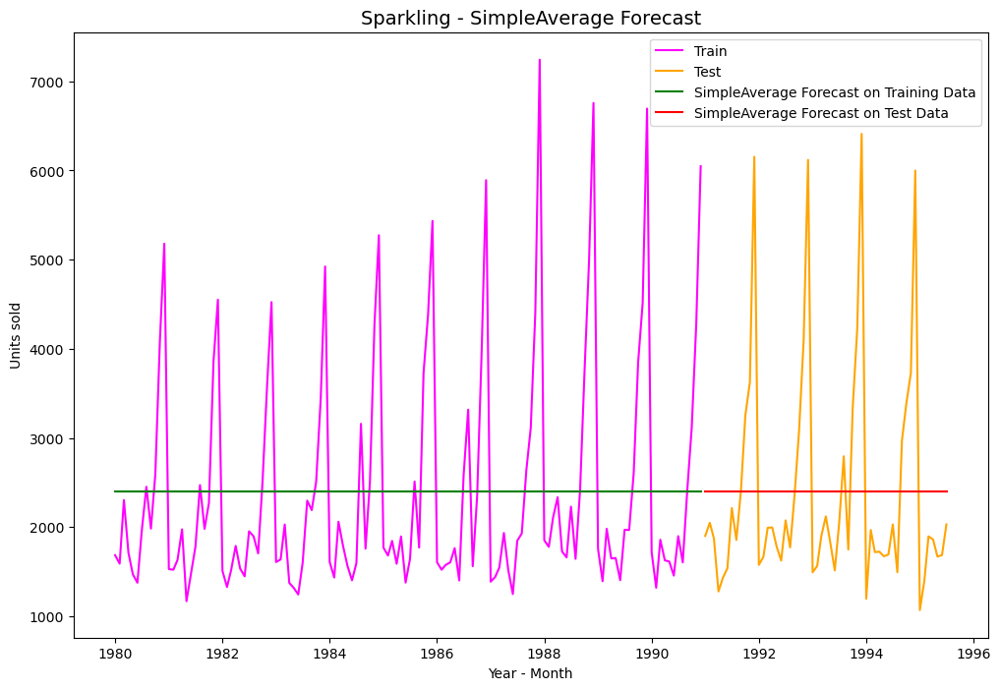

In [465]:
plt.figure(figsize=(12,8))
plt.plot(SimpleAverage_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(test_spark['Sparkling'], label='Test', color = 'orange')
plt.plot(SimpleAverage_train['spark_mean_forecast'], label='SimpleAverage Forecast on Training Data', color = 'green')
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SimpleAverage Forecast on Test Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title("Sparkling - SimpleAverage Forecast", fontsize=14)
plt.show()

In [467]:
rmse_simple_avg = metrics.mean_squared_error(test_spark['Sparkling'],SimpleAverage_test['spark_mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data, RMSE is %3.3f " %(rmse_simple_avg))

For Simple Average forecast on the Test Data, RMSE is 1275.082 


In [469]:
resultsDf_3 = pd.DataFrame({'Test RMSE': [rmse_simple_avg]},index=['SimpleAverage'])
spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_3])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804


#### MOVING AVERAGE:

In [471]:
MovingAverage = df_spark.copy()
MovingAverage.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [473]:
MovingAverage['Spark_Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
MovingAverage['Spark_Trailing_4'] = MovingAverage['Sparkling'].rolling(4).mean()
MovingAverage['Spark_Trailing_6'] = MovingAverage['Sparkling'].rolling(6).mean()
MovingAverage['Spark_Trailing_9'] = MovingAverage['Sparkling'].rolling(9).mean()

MovingAverage.head()

,Sparkling,Spark_Trailing_2,Spark_Trailing_4,Spark_Trailing_6,Spark_Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN


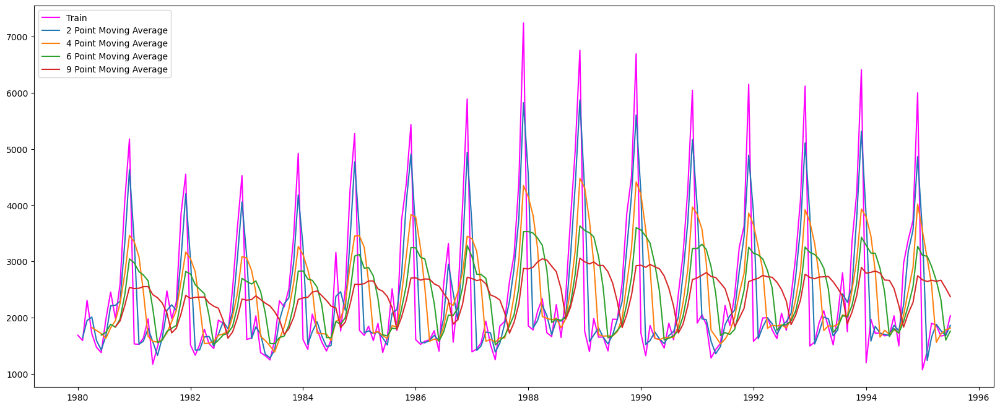

In [475]:
plt.figure(figsize=(20,8))
plt.plot(MovingAverage['Sparkling'], label='Train', color='magenta')
plt.plot(MovingAverage['Spark_Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_9'],label = '9 Point Moving Average')
plt.legend(loc = 'best');

In [477]:
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

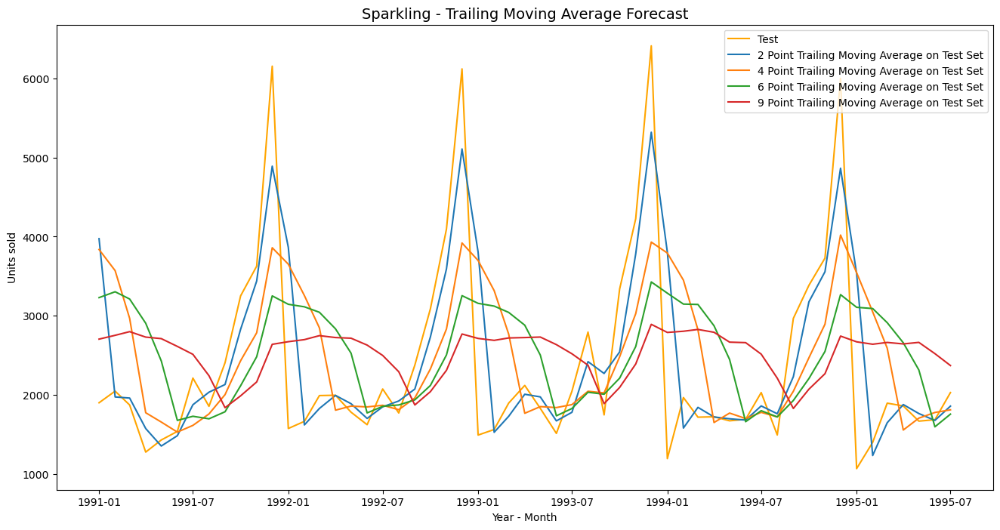

In [479]:
plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_test['Sparkling'], label='Test', color = 'orange')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')

plt.title("Sparkling - Trailing Moving Average Forecast", fontsize=14);

In [481]:
rmse_spark_MovingAverage_2 = metrics.mean_squared_error(test_spark['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Test Data,  rmse_spark is %3.3f " %(rmse_spark_MovingAverage_2))

## Test Data - rmse_spark --> 4 point Spark_Trailing MA

rmse_spark_MovingAverage_4 = metrics.mean_squared_error(test_spark['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Test Data,  rmse_spark is %3.3f" %(rmse_spark_MovingAverage_4))

## Test Data - rmse_spark --> 6 point Spark_Trailing MA

rmse_spark_MovingAverage_6 = metrics.mean_squared_error(test_spark['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Test Data,  rmse_spark is %3.3f" %(rmse_spark_MovingAverage_6))

## Test Data - rmse_spark --> 9 point Spark_Trailing MA

rmse_spark_MovingAverage_9 = metrics.mean_squared_error(test_spark['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Test Data,  rmse_spark is %3.3f" %(rmse_spark_MovingAverage_9))

For 2 point Moving Average Model forecast on the Test Data,  rmse_spark is 813.401 
For 4 point Moving Average Model forecast on the Test Data,  rmse_spark is 1156.590
For 6 point Moving Average Model forecast on the Test Data,  rmse_spark is 1283.927
For 9 point Moving Average Model forecast on the Test Data,  rmse_spark is 1346.278


In [483]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_spark_MovingAverage_2,rmse_spark_MovingAverage_4
                                          ,rmse_spark_MovingAverage_6,rmse_spark_MovingAverage_9]}
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_4])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315


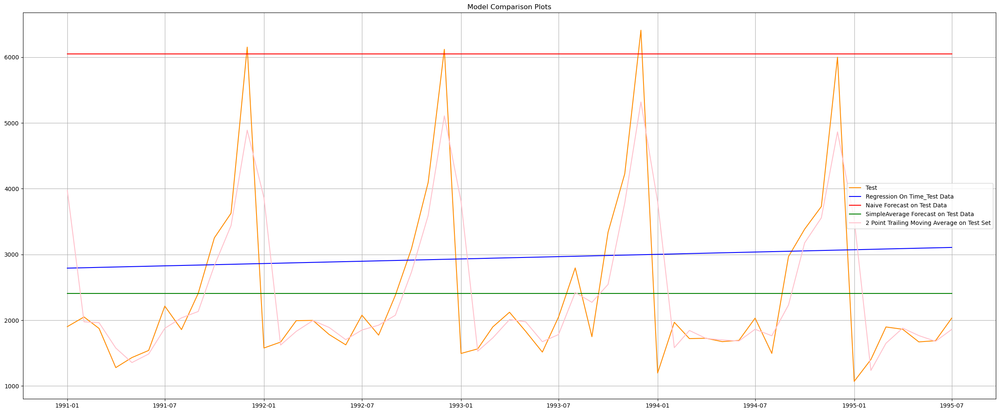

In [485]:
plt.figure(figsize=(30,12))
plt.plot(test_spark['Sparkling'], label='Test',color='darkorange')
plt.plot(LinearRegression_test_spark['RegOnTime_spark'], label='Regression On Time_Test Data',color='blue')
plt.plot(NaiveModel_test['spark_naive'], label='Naive Forecast on Test Data',color='red')
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SimpleAverage Forecast on Test Data',color='green')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Test Set',color='pink')
plt.legend(loc='best')
plt.title("Model Comparison Plots")
plt.grid();

#### (SIMPLE EXPONENTIAL SMOOTHING)SES MODEL:

In [487]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [489]:
SES_train = train_spark.copy()
SES_test = test_spark.copy()

In [491]:
model_SES = SimpleExpSmoothing(SES_train['Sparkling'])

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [493]:
model_SES_autofit = model_SES.fit(optimized=True,use_brute=True)

In [495]:
printmd('**The output parameters for optimized model are:**')
model_SES_autofit.params

**The output parameters for optimized model are:**

{'smoothing_level': 0.03953488372093023,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [497]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test_spark['Sparkling']))
printmd('**Viewing the first five Predictions for Test Data:**')
SES_test.head()

**Viewing the first five Predictions for Test Data:**

,Sparkling,predict
YearMonth,,
1991-01-01,1902,2676.676366
1991-02-01,2049,2676.676366
1991-03-01,1874,2676.676366
1991-04-01,1279,2676.676366
1991-05-01,1432,2676.676366


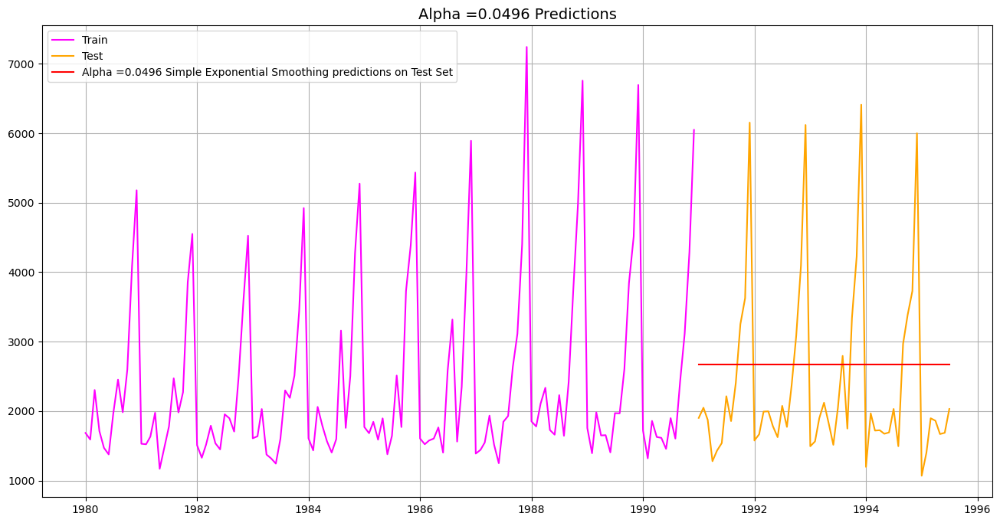

In [499]:
plt.figure(figsize=(16,8))
plt.plot(SES_train['Sparkling'], label='Train',color = 'magenta')
plt.plot(SES_test['Sparkling'], label='Test',color = 'orange')

plt.plot(SES_test['predict'], label='Alpha =0.0496 Simple Exponential Smoothing predictions on Test Set',color = 'red')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha =0.0496 Predictions',fontsize = 14);

In [501]:
rmse_SES = metrics.mean_squared_error(SES_test['Sparkling'],SES_test['predict'],squared=False)
print("For Alpha =0.0496 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SES))

For Alpha =0.0496 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 1304.927


In [503]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_SES]}
                           ,index=['Alpha=0.0496, SES Optimized'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_5])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405


In [505]:
resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha Values,Train RMSE,Test RMSE


In [509]:
resultsDf_6 = pd.DataFrame(columns=['Alpha Values', 'Train RMSE', 'Test RMSE'])

alpha_list = [0.025, 0.05, 0.25, 0.1, 0.2, 0.3, 0.5, 0.99]
for i in alpha_list:
    model_SES_alpha_i = model_SES.fit(smoothing_level=i, optimized=False, use_brute=True)
    SES_train['predict', i] = model_SES_alpha_i.fittedvalues
    SES_test['predict', i] = model_SES_alpha_i.forecast(len(test_spark['Sparkling']))
    
    rmse_SES_train_i = metrics.mean_squared_error(SES_train['Sparkling'], SES_train['predict', i], squared=False)
    rmse_SES_test_i = metrics.mean_squared_error(SES_test['Sparkling'], SES_test['predict', i], squared=False)
    
    new_row = pd.DataFrame({'Alpha Values': [i], 'Train RMSE': [rmse_SES_train_i], 'Test RMSE': [rmse_SES_test_i]})
    resultsDf_6 = pd.concat([resultsDf_6, new_row], ignore_index=True)

In [511]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True).head()

,Alpha Values,Train RMSE,Test RMSE
0,0.025,1322.084340,1286.248846
1,0.050,1318.429335,1316.411742
3,0.100,1333.873836,1375.393398
4,0.200,1356.042987,1595.206839
2,0.250,1359.701408,1755.488175


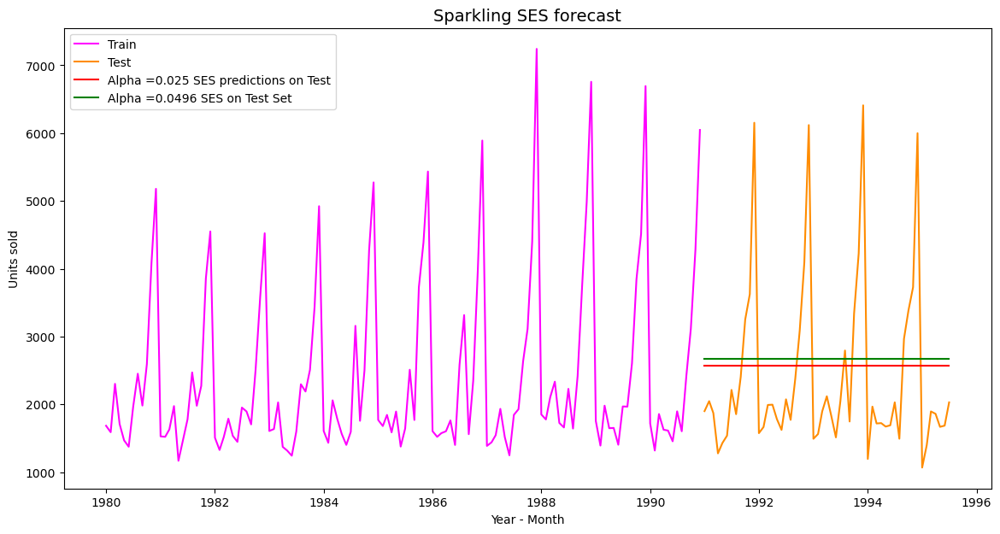

In [513]:
plt.plot(SES_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(SES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SES_test['predict', 0.025], color = 'red', label='Alpha =0.025 SES predictions on Test')
plt.plot(SES_test['predict'], label='Alpha =0.0496 SES on Test Set',color = 'green')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling SES forecast', fontsize=14)
plt.legend(loc='best');

In [515]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE': [resultsDf_6.sort_values(by=['Test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.025,SES iterative'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_6_1])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846


#### DES MODEL:

In [517]:
DES_train = train_spark.copy()
DES_test = test_spark.copy()

In [519]:
model_DES = Holt(DES_train['Sparkling'])

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [521]:
model_DES_autofit = model_DES.fit(optimized=True,use_brute=True)

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [523]:
printmd('**The output parameters for optimized model are:**')
model_DES_autofit.params

**The output parameters for optimized model are:**

{'smoothing_level': 0.6885714285714285,
 'smoothing_trend': 9.999999999999999e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [525]:
alpha = model_DES_autofit.params['smoothing_level']
beta = model_DES_autofit.params['smoothing_trend']
print(alpha)
print(beta)

0.6885714285714285
9.999999999999999e-05


In [527]:
DES_test['predict_spark',alpha,beta] = model_DES_autofit.forecast(len(test_spark['Sparkling']))
printmd('**Viewing the first five Predictions for Test Data:**')
DES_test.head()

**Viewing the first five Predictions for Test Data:**

,Sparkling,"(predict_spark, 0.6885714285714285, 9.999999999999999e-05)"
YearMonth,,
1991-01-01,1902,5221.278699
1991-02-01,2049,5127.886554
1991-03-01,1874,5034.494409
1991-04-01,1279,4941.102264
1991-05-01,1432,4847.710119


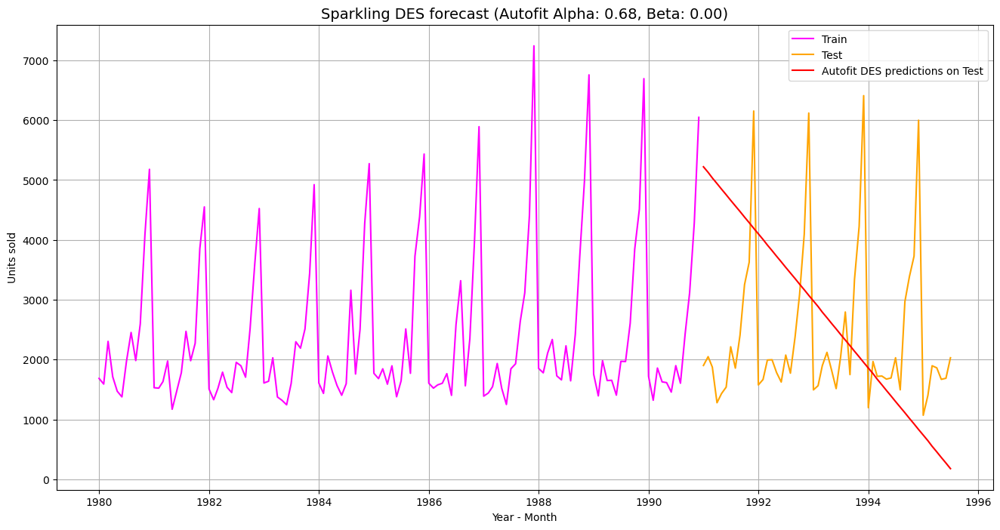

In [529]:
plt.figure(figsize=(16,8))
plt.plot(DES_train['Sparkling'], label='Train',color = 'magenta')
plt.plot(DES_test['Sparkling'], label='Test',color = 'orange')

plt.plot(DES_test['predict_spark',alpha,beta], color = 'red', label='Autofit DES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling DES forecast (Autofit Alpha: 0.68, Beta: 0.00)', fontsize=14)
plt.legend(loc='best')
plt.grid();

In [531]:
rmse_DES = metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict_spark',alpha,beta],squared=False)
print("For Auto-fit Double Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_DES))

For Auto-fit Double Exponential Smoothing Model forecast on the Test Data, RMSE is 2007.239


In [533]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [rmse_DES]}
                           ,index=['Alpha=0.68,Beta=0.0, DES Optimized'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_7])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


In [535]:
resultsDf_7 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_7

,Alpha Values,Beta Values,Train RMSE,Test RMSE


In [539]:
resultsDf_7 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Train RMSE', 'Test RMSE'])

for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i, smoothing_trend=j, optimized=False, use_brute=True)
        DES_train['predict', i, j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict', i, j] = model_DES_alpha_i_j.forecast(len(test_spark['Sparkling']))
        
        rmse_DES_train = np.round(metrics.mean_squared_error(DES_train['Sparkling'], DES_train['predict', i, j], squared=False), 2)
        rmse_DES_test = np.round(metrics.mean_squared_error(DES_test['Sparkling'], DES_test['predict', i, j], squared=False), 2)
        
        new_row = pd.DataFrame({'Alpha Values': [i], 'Beta Values': [j], 'Train RMSE': [rmse_DES_train], 'Test RMSE': [rmse_DES_test]})
        resultsDf_7 = pd.concat([resultsDf_7, new_row], ignore_index=True)

In [541]:
resultsDf_7.sort_values(by=['Test RMSE'],ascending=True).head()

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,1382.52,1778.56
1,0.1,0.2,1413.60,2599.44
10,0.2,0.1,1418.04,3611.76
2,0.1,0.3,1445.76,4293.08
20,0.3,0.1,1431.17,5908.19


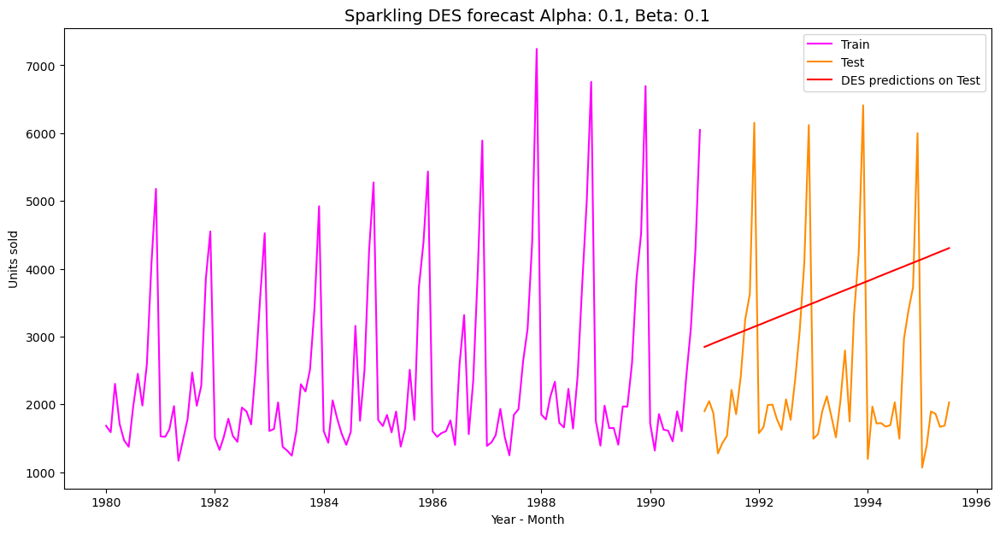

In [543]:
plt.plot(DES_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(DES_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(DES_test['predict', 0.1, 0.1], color = 'red', label='DES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling DES forecast Alpha: 0.1, Beta: 0.1', fontsize=14)
plt.legend(loc='best');

In [545]:
resultsDf_7_1 = pd.DataFrame({'Test RMSE': [resultsDf_7.sort_values(by=['Test RMSE'],ascending=True).values[0][3]]}
                           ,index=['Alpha=0.1,Beta=0.1,DES iterative'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_7_1])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


### TES MODEL:

In [547]:
TES_train = train_spark.copy()
TES_test = test_spark.copy()

In [549]:
model_TES = ExponentialSmoothing(TES_train['Sparkling'],trend='additive',seasonal='multiplicative')

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [551]:
model_TES_autofit = model_TES.fit(optimized=True,use_brute=True)

In [553]:
printmd('**The output parameters for optimized model are:**')
model_TES_autofit.params

**The output parameters for optimized model are:**

{'smoothing_level': 0.11133818361298699,
 'smoothing_trend': 0.049505131019509915,
 'smoothing_seasonal': 0.3620795793580111,
 'damping_trend': nan,
 'initial_level': 2356.4967888704355,
 'initial_trend': -10.187944726007238,
 'initial_seasons': array([0.71296382, 0.68242226, 0.90755008, 0.80515228, 0.65597218,
        0.65414505, 0.88617935, 1.13345121, 0.92046306, 1.21337874,
        1.87340336, 2.37811768]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [555]:
alpha = model_TES_autofit.params['smoothing_level']
beta = model_TES_autofit.params['smoothing_trend']
gamma = model_TES_autofit.params['smoothing_seasonal']
print(alpha)
print(beta)
print(gamma)

0.11133818361298699
0.049505131019509915
0.3620795793580111


In [557]:
TES_test['predict',alpha,beta,gamma] = model_TES_autofit.forecast(steps=len(test_spark['Sparkling']))

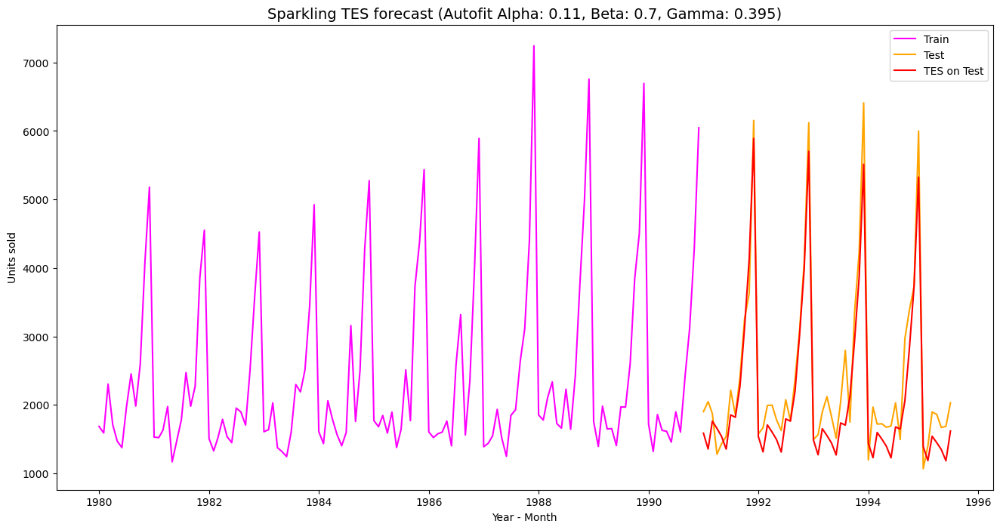

In [559]:
plt.figure(figsize=(16,8))
plt.plot(TES_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(TES_test['Sparkling'], label='Test', color = 'orange')

plt.plot(TES_test['predict',alpha,beta,gamma], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling TES forecast (Autofit Alpha: 0.11, Beta: 0.7, Gamma: 0.395)', fontsize=14)

plt.legend(loc='best');

In [561]:
rmse_TES = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict',alpha,beta,gamma],squared=False)
print("For Auto-fit Triple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_TES))

For Auto-fit Triple Exponential Smoothing Model forecast on the Test Data, RMSE is 404.287


In [563]:
resultsDf_8 = pd.DataFrame({'Test RMSE': [rmse_TES]}
                           ,index=['Alpha=0.11,Beta=0.7,gamma=0.395 TES Optimized'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


In [565]:
resultsDf_8 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8

,Alpha Values,Beta Values,Train RMSE,Test RMSE


In [570]:
resultsDf_8 = pd.DataFrame(columns=['Alpha Values', 'Beta Values', 'Gamma Values', 'Train RMSE', 'Test RMSE'])

for i in np.arange(0.1, 1.1, 0.1):
    for j in np.arange(0.1, 1.1, 0.1):
        for k in np.arange(0.3, 1.1, 0.1):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_trend=j, smoothing_seasonal=k, optimized=False, use_brute=True)
            TES_train['predict', i, j, k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict', i, j, k] = model_TES_alpha_i_j_k.forecast(len(test_spark['Sparkling']))
        
            rmse_TES_train = metrics.mean_squared_error(TES_train['Sparkling'], TES_train['predict', i, j, k], squared=False)
            rmse_TES_test = metrics.mean_squared_error(TES_test['Sparkling'], TES_test['predict', i, j, k], squared=False)
            
            new_row = pd.DataFrame({'Alpha Values': [i], 'Beta Values': [j], 'Gamma Values': [k], 'Train RMSE': [rmse_TES_train], 'Test RMSE': [rmse_TES_test]})
            resultsDf_8 = pd.concat([resultsDf_8, new_row], ignore_index=True)

In [571]:
resultsDf_8.sort_values(by=['Test RMSE'],ascending=True).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE
320,0.5,0.1,0.3,396.598057,345.913415
176,0.3,0.3,0.3,397.797318,361.397300
321,0.5,0.1,0.4,405.370169,365.288320
109,0.2,0.4,0.8,513.149439,368.374003
240,0.4,0.1,0.3,382.899740,376.708937


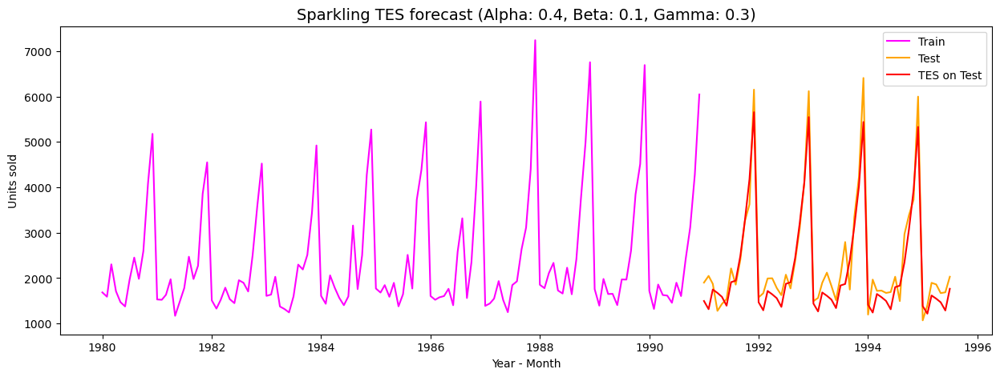

In [574]:
plt.figure(figsize=(15,5))
plt.plot(TES_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(TES_test['Sparkling'], label='Test', color = 'orange')

plt.plot(TES_test['predict', 0.4, 0.1, 0.3], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling TES forecast (Alpha: 0.4, Beta: 0.1, Gamma: 0.3)', fontsize=14)

plt.legend(loc='best');

In [576]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE': [resultsDf_8.sort_values(by=['Test RMSE'],ascending=True).values[0][3]]}
                           ,index=['Alpha=0.4,Beta=0.1,gamma=0.3,TES iterative'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8_1])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


In [578]:
spark_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE
"Alpha=0.4,Beta=0.1,gamma=0.3,TES iterative",396.598057
"Alpha=0.11,Beta=0.7,gamma=0.395 TES Optimized",404.286809
2 point TMA,813.400684
4 point TMA,1156.589694
SimpleAverage,1275.081804
6 point TMA,1283.927428
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.0496, SES Optimized",1304.927405
9 point TMA,1346.278315
RegressionOnTime,1389.135175


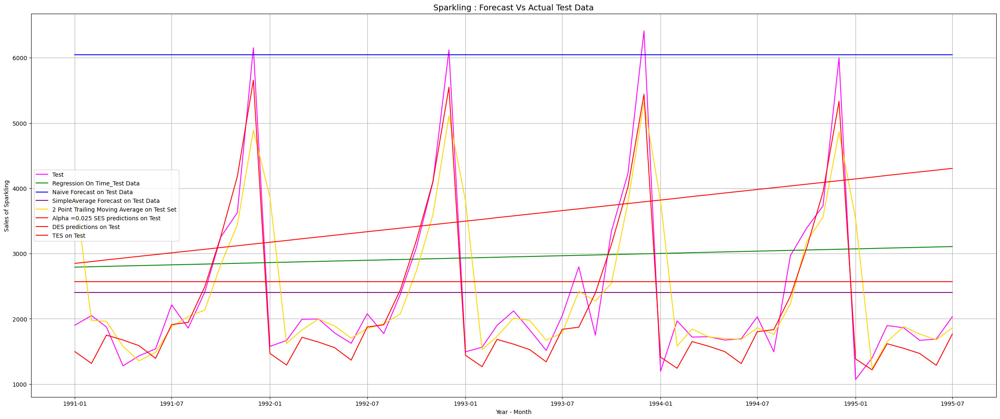

In [580]:
plt.figure(figsize=(30,12))
#Train Data
# plt.plot(train_spark['Sparkling'], label='Train',color='magenta')
#Test Data
plt.plot(test_spark['Sparkling'], label='Test',color='magenta')
#Linear Regression
plt.plot(LinearRegression_test_spark['RegOnTime_spark'], label='Regression On Time_Test Data',color='green')
#Naive Forecast
plt.plot(NaiveModel_test['spark_naive'], label='Naive Forecast on Test Data',color='blue')
#Simple Average
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SimpleAverage Forecast on Test Data',color='purple')
#2-point trailing moving average
plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Test Set',color='gold')
#SES itervative at alpha=0.025
plt.plot(SES_test['predict', 0.025], color = 'red', label='Alpha =0.025 SES predictions on Test')
#DES iterative at alpha=0.1 and beta=0.1
plt.plot(DES_test['predict', 0.1, 0.1], color = 'red', label='DES predictions on Test')
#TES iterative at alpha=0.4, beta=0.1 and gamma=0.3
plt.plot(TES_test['predict', 0.4, 0.1, 0.3], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Sales of Sparkling')
plt.title('Sparkling : Forecast Vs Actual Test Data', fontsize=14)
plt.grid()
plt.legend(loc='best');

### CHECKING FOR STATIONARITY:

In [582]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries, color):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=7).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color=color,label='Observed')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

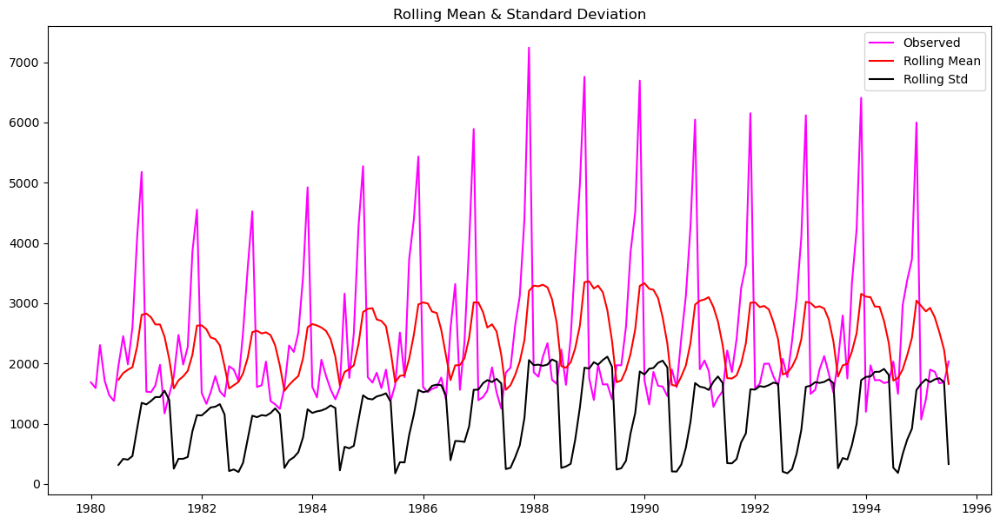

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [590]:
test_stationarity(df_spark['Sparkling'],'magenta')

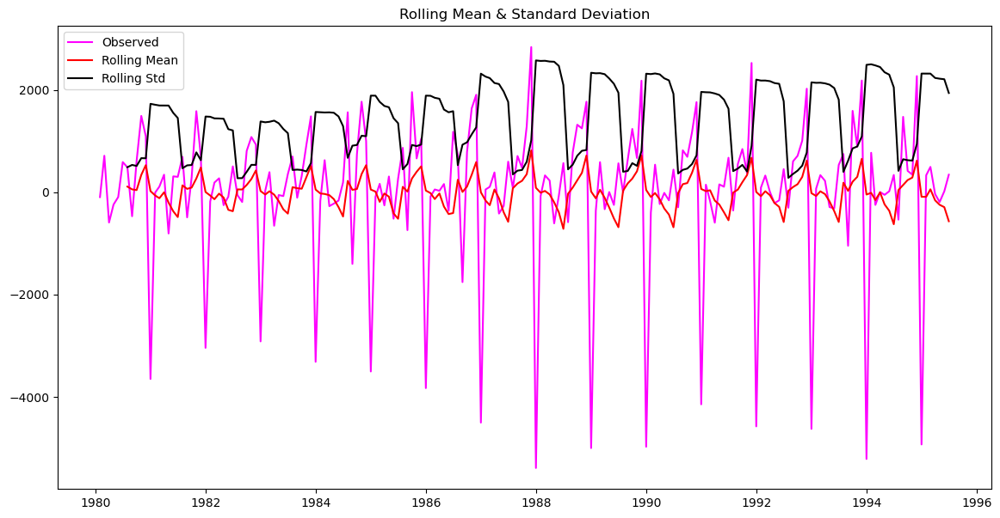

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [586]:
test_stationarity(df_spark['Sparkling'].diff().dropna(),'magenta')

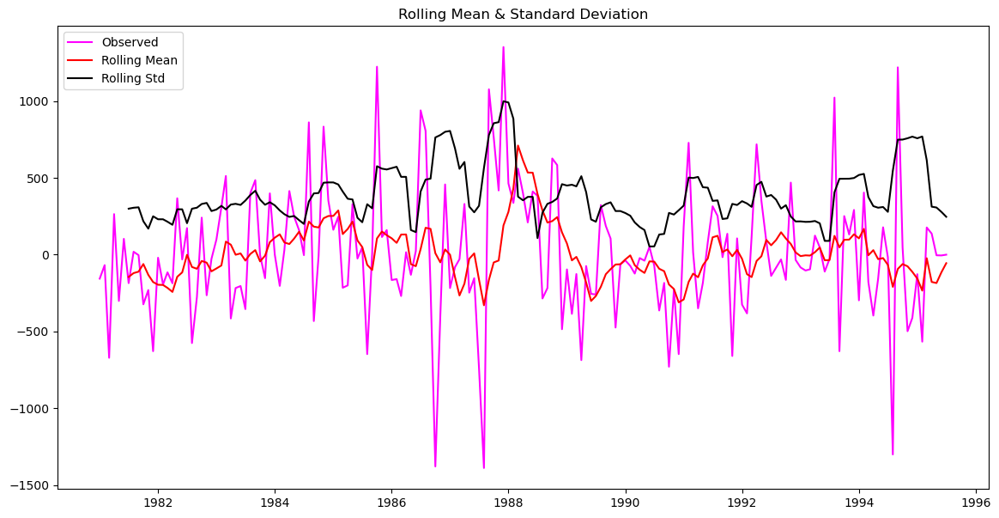

Results of Dickey-Fuller Test:
Test Statistic                  -4.460165
p-value                          0.000232
#Lags Used                      11.000000
Number of Observations Used    163.000000
Critical Value (1%)             -3.471119
Critical Value (5%)             -2.879441
Critical Value (10%)            -2.576314
dtype: float64 



In [588]:
test_stationarity(df_spark['Sparkling'].diff(12).dropna(), 'magenta')

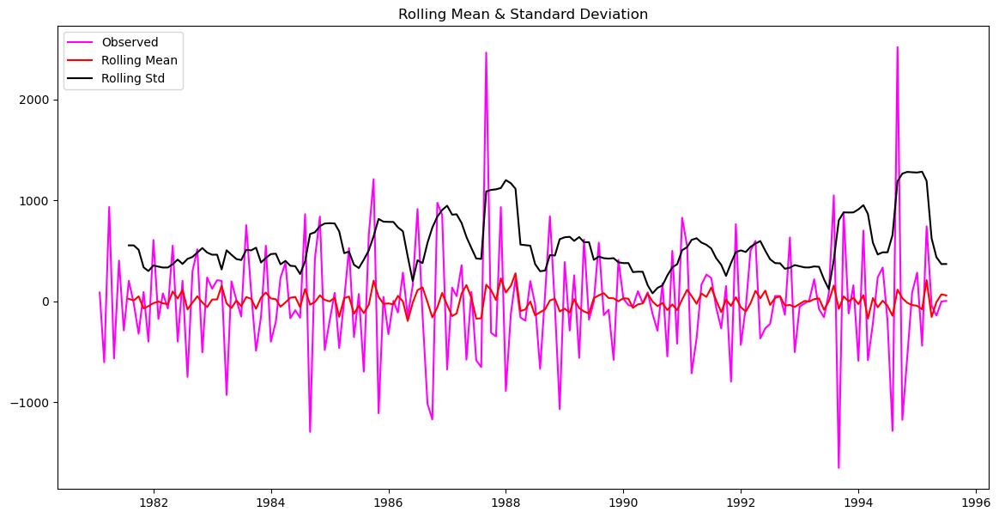

Results of Dickey-Fuller Test:
Test Statistic                  -5.113533
p-value                          0.000013
#Lags Used                      11.000000
Number of Observations Used    162.000000
Critical Value (1%)             -3.471374
Critical Value (5%)             -2.879552
Critical Value (10%)            -2.576373
dtype: float64 



In [592]:
test_stationarity((df_spark['Sparkling'].diff(12).dropna()).diff().dropna(), 'magenta')

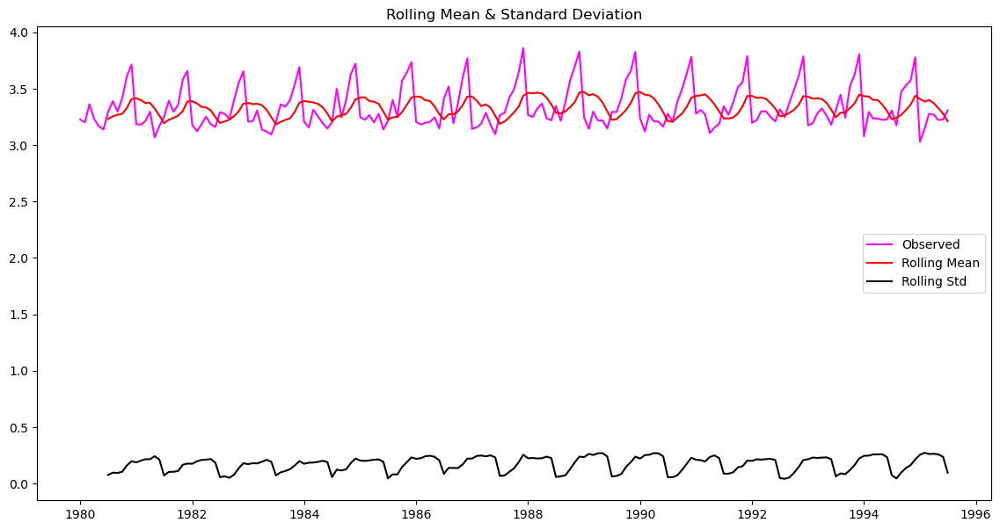

Results of Dickey-Fuller Test:
Test Statistic                  -1.749630
p-value                          0.405740
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [594]:
test_stationarity(np.log10(df_spark['Sparkling']), 'magenta')

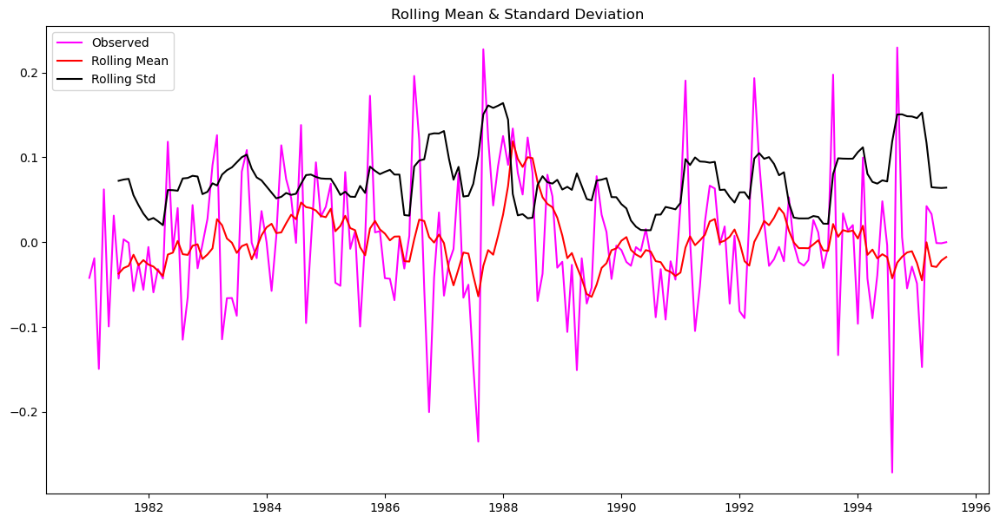

Results of Dickey-Fuller Test:
Test Statistic                  -5.183811
p-value                          0.000009
#Lags Used                      11.000000
Number of Observations Used    163.000000
Critical Value (1%)             -3.471119
Critical Value (5%)             -2.879441
Critical Value (10%)            -2.576314
dtype: float64 



In [596]:
test_stationarity(np.log10(df_spark['Sparkling']).diff(12).dropna(),  'magenta')

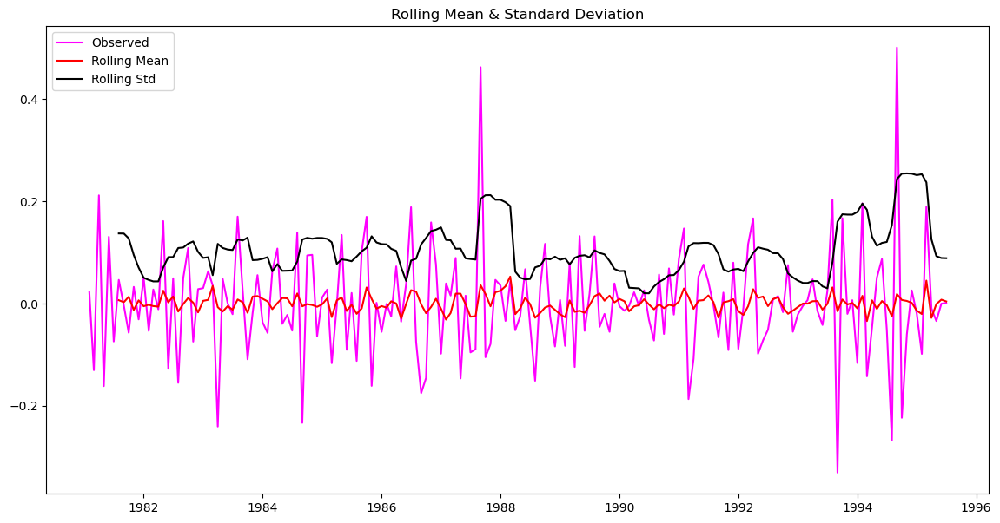

Results of Dickey-Fuller Test:
Test Statistic                  -5.254601
p-value                          0.000007
#Lags Used                      12.000000
Number of Observations Used    161.000000
Critical Value (1%)             -3.471633
Critical Value (5%)             -2.879665
Critical Value (10%)            -2.576434
dtype: float64 



In [598]:
test_stationarity((np.log10(df_spark['Sparkling']).diff(12).dropna()).diff().dropna(),'magenta')

In [600]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

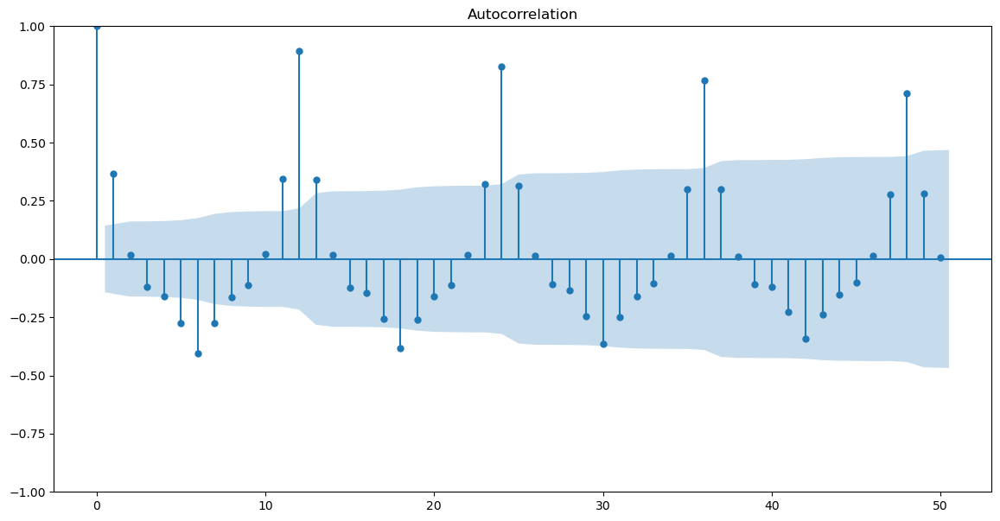

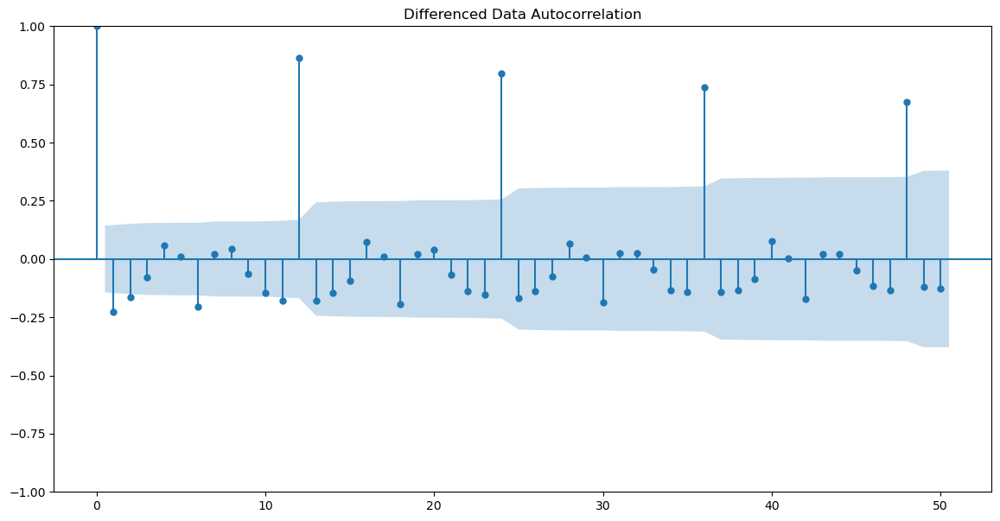

In [602]:
plot_acf(df_spark['Sparkling'],lags=50)
plot_acf(df_spark['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show();

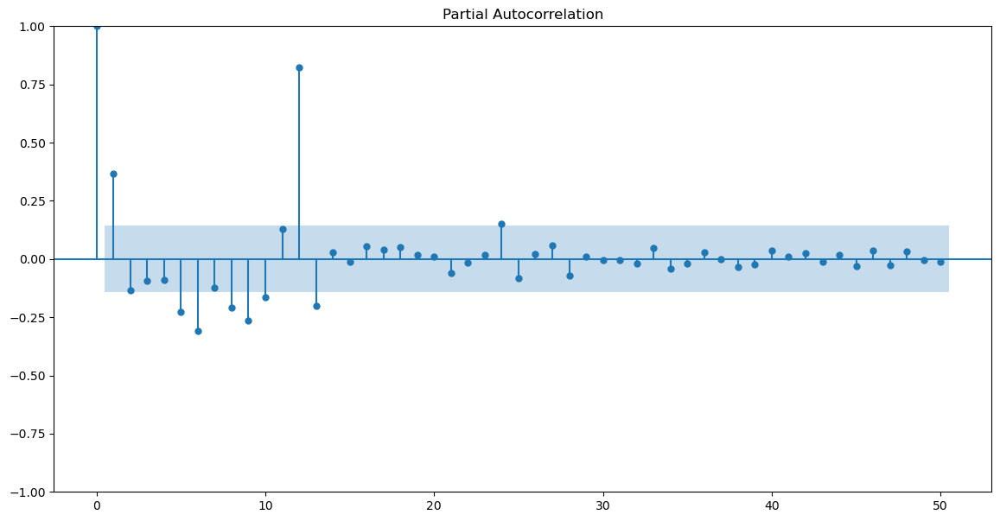

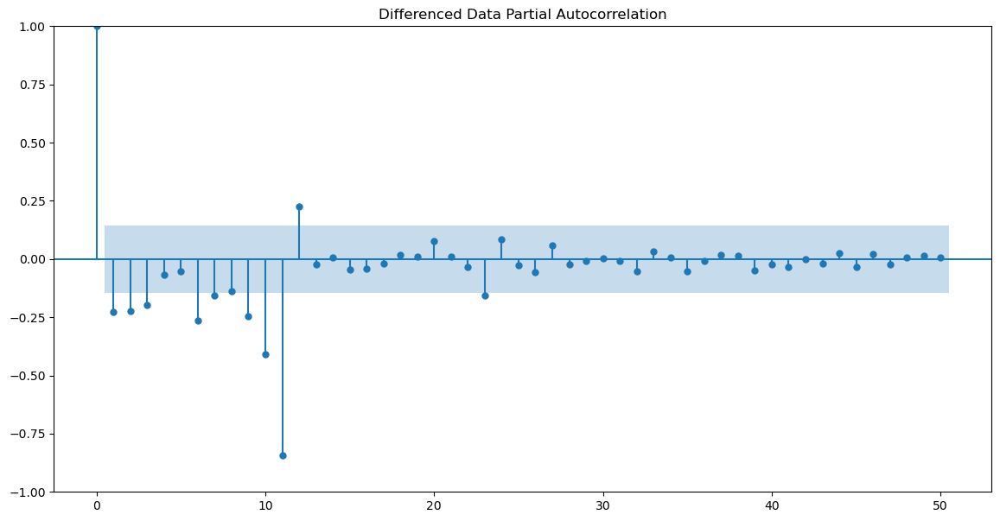

In [604]:
plot_pacf(df_spark['Sparkling'],lags=50)
plot_pacf(df_spark['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

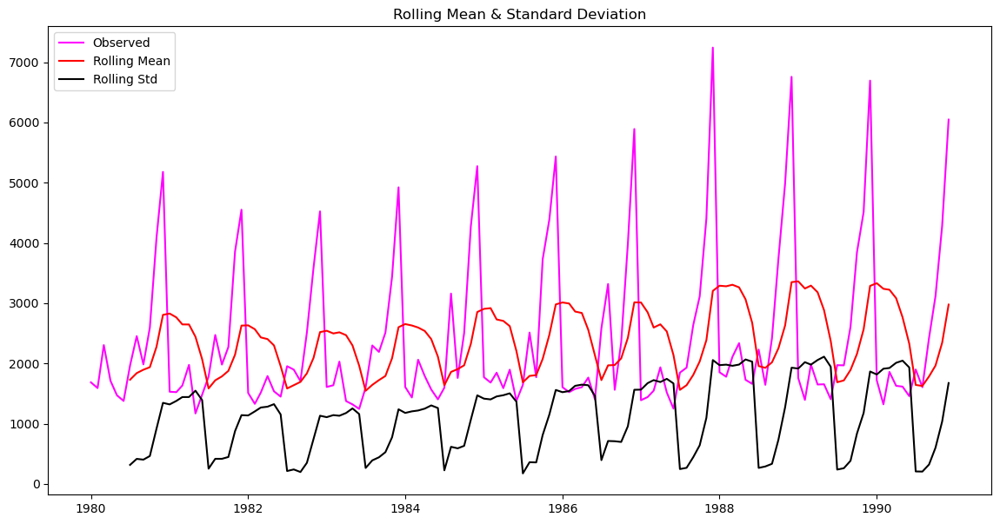

Results of Dickey-Fuller Test:
Test Statistic                  -1.208926
p-value                          0.669744
#Lags Used                      12.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64 



In [606]:
test_stationarity(train_spark['Sparkling'],'magenta')

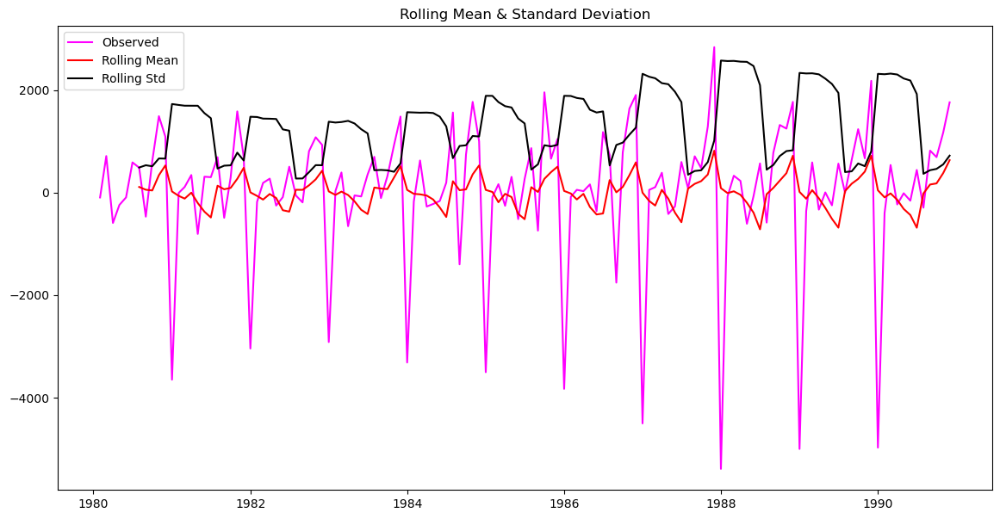

Results of Dickey-Fuller Test:
Test Statistic                -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [607]:
test_stationarity(train_spark['Sparkling'].diff().dropna(),'magenta')

#### AUTO ARIMA MODEL:

In [610]:
import itertools
p = q = range(0, 3)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [612]:
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [620]:
from statsmodels.tsa.arima.model import ARIMA

ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])

for param in pdq:
    ARIMA_model = ARIMA(train_spark['Sparkling'].values, order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))
    
    new_row = pd.DataFrame({'param': [param], 'AIC': [ARIMA_model.aic]})
    ARIMA_AIC = pd.concat([ARIMA_AIC, new_row], ignore_index=True)

ARIMA(0, 1, 0) - AIC:2267.6630357855465
ARIMA(0, 1, 1) - AIC:2263.060015591336
ARIMA(0, 1, 2) - AIC:2234.4083231238383
ARIMA(1, 1, 0) - AIC:2266.6085393190087
ARIMA(1, 1, 1) - AIC:2235.755094673378
ARIMA(1, 1, 2) - AIC:2234.5272004517433
ARIMA(2, 1, 0) - AIC:2260.365743968086
ARIMA(2, 1, 1) - AIC:2233.7776263084434
ARIMA(2, 1, 2) - AIC:2213.5092128369015


In [622]:
ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
8,"(2, 1, 2)",2213.509213
7,"(2, 1, 1)",2233.777626
2,"(0, 1, 2)",2234.408323
5,"(1, 1, 2)",2234.527200
4,"(1, 1, 1)",2235.755095
6,"(2, 1, 0)",2260.365744
1,"(0, 1, 1)",2263.060016
3,"(1, 1, 0)",2266.608539
0,"(0, 1, 0)",2267.663036


In [624]:
auto_ARIMA = ARIMA(train_spark['Sparkling'], order=(2,1,2))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1101.755
Date:                Sat, 14 Sep 2024   AIC                           2213.509
Time:                        20:23:40   BIC                           2227.885
Sample:                    01-01-1980   HQIC                          2219.351
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3121      0.046     28.781      0.000       1.223       1.401
ar.L2         -0.5593      0.072     -7.739      0.000      -0.701      -0.418
ma.L1         -1.9917      0.109    -18.214      0.0

In [628]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test_spark['Sparkling']))

# Calculate RMSE
rmse_arima_auto_model = metrics.mean_squared_error(test_spark['Sparkling'], predicted_auto_ARIMA, squared=False)
print("For Auto-ARIMA Model forecast accuracy_score on the Test Data, RMSE is %3.3f" % rmse_arima_auto_model)

For Auto-ARIMA Model forecast accuracy_score on the Test Data, RMSE is 1299.980


In [630]:
resultsDf_9 = pd.DataFrame({'Test RMSE': [rmse_arima_auto_model]}
                           ,index=['Auto_ARIMA(2,1,2)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_9])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


#### AUTO SARIMA MODEL:

In [632]:
SARIMA_train = train_spark.copy()
SARIMA_test = test_spark.copy()

In [634]:
import itertools
p = q = range(0,3)
d= range(1,2)
D = range(1,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)


In [636]:
SARIMA_AIC_spark = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_spark

,param,seasonal,AIC


In [640]:
SARIMA_AIC_spark = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                                       order=param,
                                                       seasonal_order=param_seasonal,
                                                       enforce_stationarity=False,
                                                       enforce_invertibility=False)
            
        results_SARIMA_spark = SARIMA_model_spark.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_spark.aic))
        
        new_row = pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [results_SARIMA_spark.aic]})
        SARIMA_AIC_spark = pd.concat([SARIMA_AIC_spark, new_row], ignore_index=True)

SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:1822.9824851895298
SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:1626.8626334678888
SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:1452.6773574255355
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:1646.377816766144
SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:1628.3243908192392
SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:1454.5289621306667
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:1466.6211360755017
SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:1468.5000981866604
SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:1455.9911553692655
SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:1760.6565719828557
SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:1569.663923423009
SARIMA(0, 1, 1)x(0, 1, 2, 12)7 - AIC:1399.1083846680235
SARIMA(0, 1, 1)x(1, 1, 0, 12)7 - AIC:1602.8594819023883
SARIMA(0, 1, 1)x(1, 1, 1, 12)7 - AIC:1570.8550259196109
SARIMA(0, 1, 1)x(1, 1, 2, 12)7 - AIC:1400.6709524137293
SARIMA(0, 1, 1)x(2, 1, 0, 12)7 - AIC:1428.2448811159443
SARIMA(0, 1, 1)x(2, 1, 1, 12)7 - AIC:1429.6168027963386
SARIMA(0, 1, 1)x(2, 1, 2, 12)7 - AIC:1402.63858885

In [641]:
SARIMA_AIC_spark.sort_values(by=['AIC']).head()

,param,seasonal,AIC
47,"(1, 1, 2)","(0, 1, 2, 12)",1382.347780
20,"(0, 1, 2)","(0, 1, 2, 12)",1382.484254
50,"(1, 1, 2)","(1, 1, 2, 12)",1384.137874
74,"(2, 1, 2)","(0, 1, 2, 12)",1384.317618
23,"(0, 1, 2)","(1, 1, 2, 12)",1384.398867


In [642]:
auto_SARIMA_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                order=(1, 1, 2),
                                seasonal_order=(0, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_spark = auto_SARIMA_spark.fit(maxiter=1000)
print(results_auto_SARIMA_spark.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(1, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -685.174
Date:                            Sat, 14 Sep 2024   AIC                           1382.348
Time:                                    20:28:35   BIC                           1397.479
Sample:                                         0   HQIC                          1388.455
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5507      0.287     -1.922      0.055      -1.112       0.011
ma.L1         -0.1612      0.235   

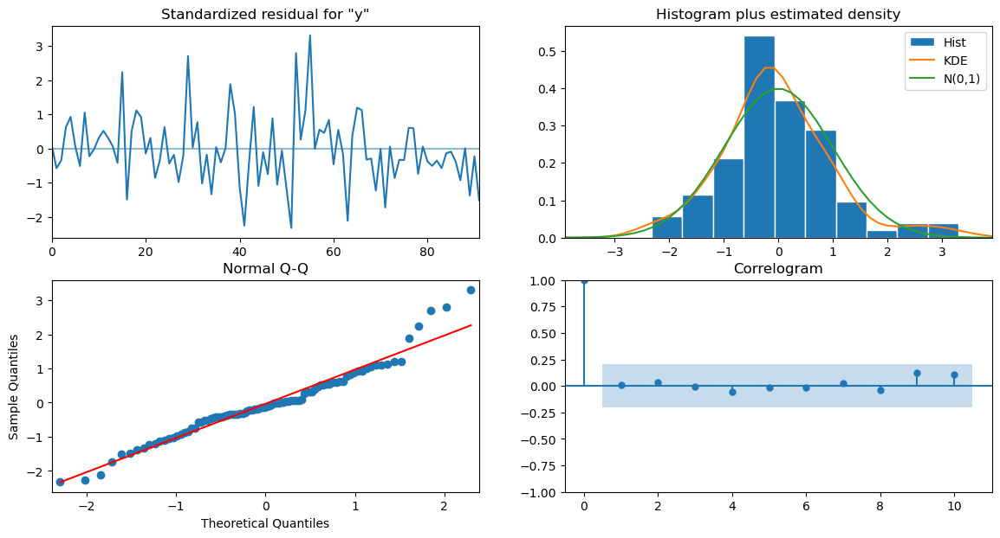

In [643]:
results_auto_SARIMA_spark.plot_diagnostics()
plt.show()

In [644]:
predicted_auto_SARIMA = results_auto_SARIMA_spark.get_forecast(steps=len(SARIMA_test['Sparkling']))

In [650]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1460.244613,412.922817,650.930764,2269.558462
1,1392.437155,429.721352,550.198782,2234.675528
2,1743.201695,430.065917,900.287986,2586.115403
3,1650.066914,433.930079,799.579588,2500.554241
4,1522.656022,434.242966,671.555448,2373.756596


In [652]:
spark_forecasted = predicted_auto_SARIMA.predicted_mean
SARIMA_test['spark_forecasted'] = predicted_auto_SARIMA.predicted_mean
SARIMA_test.head()

,Sparkling,spark_forecasted
YearMonth,,
1991-01-01,1902,1460.244613
1991-02-01,2049,1392.437155
1991-03-01,1874,1743.201695
1991-04-01,1279,1650.066914
1991-05-01,1432,1522.656022


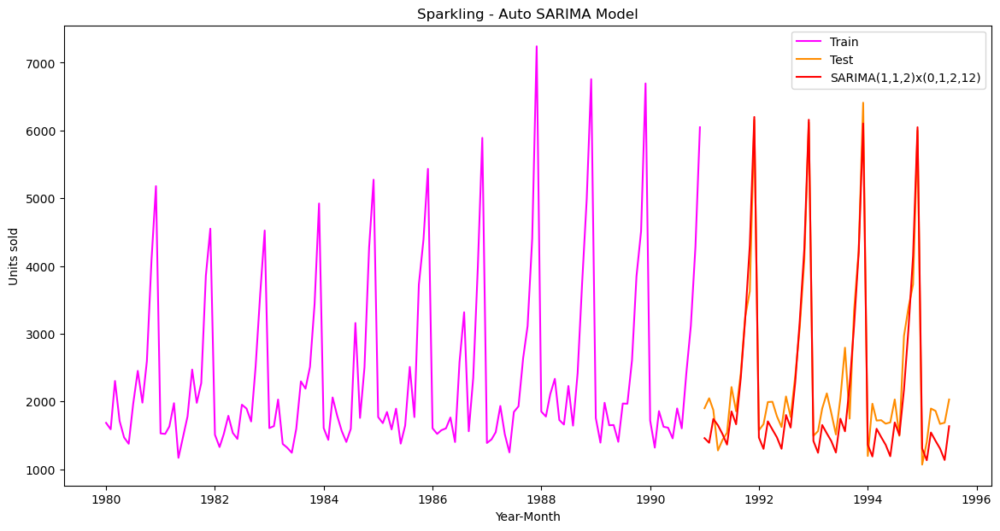

In [654]:
plt.plot(SARIMA_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(SARIMA_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['spark_forecasted'], color='red', label='SARIMA(1,1,2)x(0,1,2,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Sparkling - Auto SARIMA Model')
plt.legend(loc='best');

In [656]:
rmse_SARIMA_auto_model = metrics.mean_squared_error(SARIMA_test['Sparkling'],predicted_auto_SARIMA.predicted_mean,squared=False)
print("For Auto-SARIMA Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SARIMA_auto_model))

For Auto-SARIMA Model forecast on the Test Data, RMSE is 382.577


In [658]:
resultsDf_10 = pd.DataFrame({'Test RMSE': [rmse_SARIMA_auto_model]}
                           ,index=['Auto_SARIMA(1, 1, 2)*(0, 1, 2, 12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_10])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


#### AUTO SARIMA LOG MODEL:

In [660]:
spark_log_train = np.log10(SARIMA_train['Sparkling'])

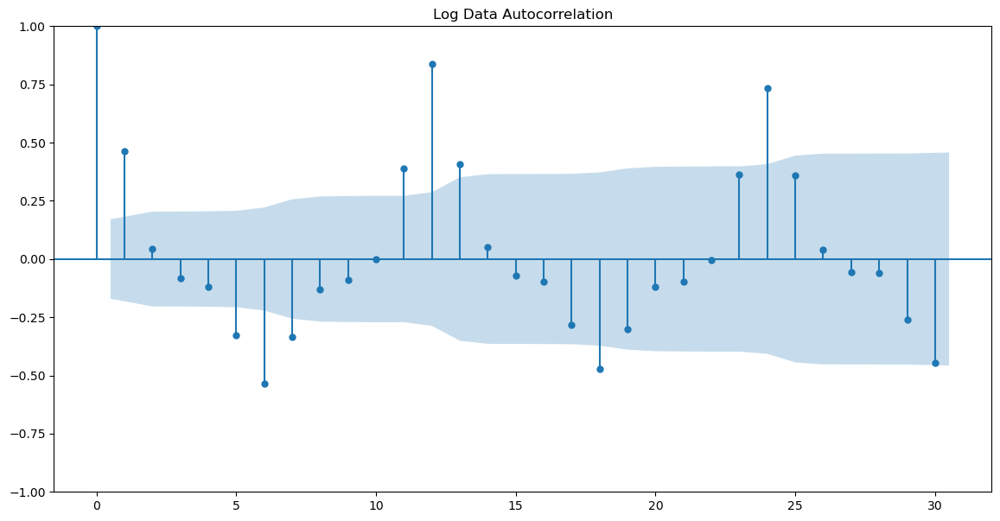

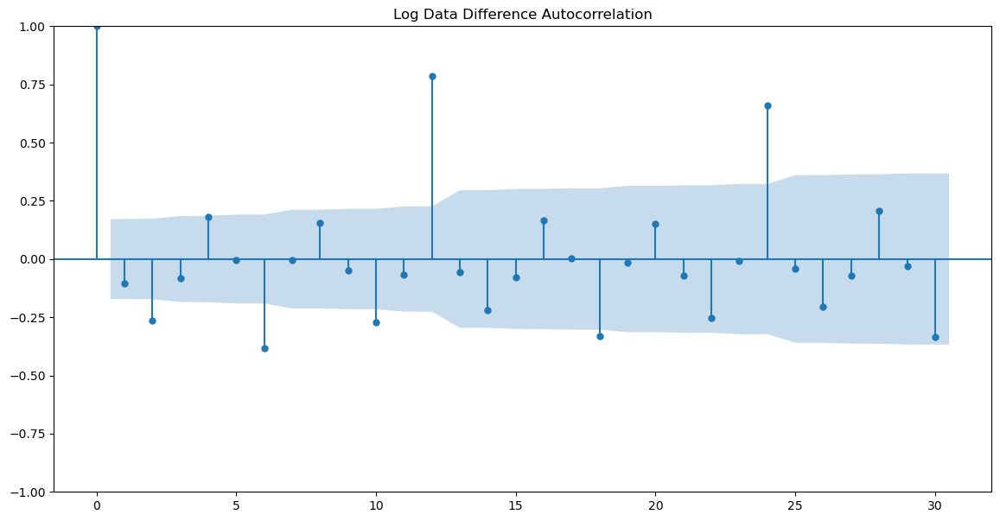

In [662]:
plot_acf(spark_log_train,lags=30,title='Log Data Autocorrelation')
plot_acf(spark_log_train.diff().dropna(),lags=30,title='Log Data Difference Autocorrelation')
plt.show()

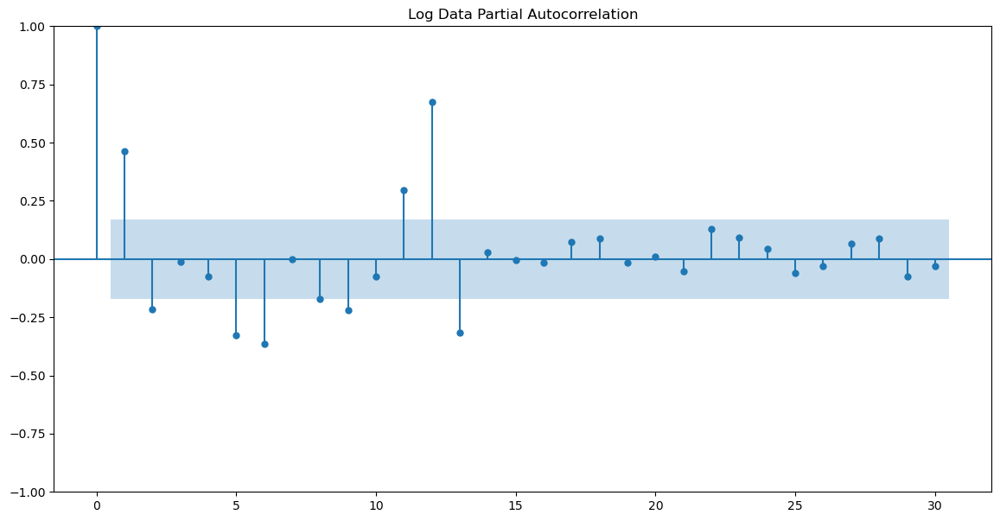

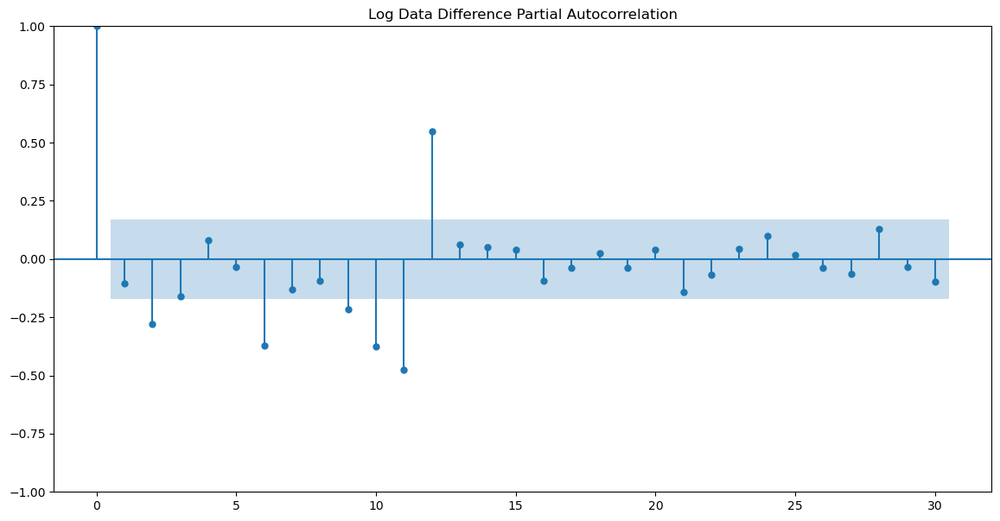

In [664]:
plot_pacf(spark_log_train,lags=30,title='Log Data Partial Autocorrelation')
plot_pacf(spark_log_train.diff().dropna(),lags=30,title='Log Data Difference Partial Autocorrelation')
plt.show()

In [666]:
p = q = range(0, 3) 
d= range(1,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)


In [668]:
SARIMA_AIC_spark_log = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_spark_log

,param,seasonal,AIC


In [672]:
SARIMA_AIC_spark_log = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_spark_log = sm.tsa.statespace.SARIMAX(spark_log_train,
                                                           order=param,
                                                           seasonal_order=param_seasonal,
                                                           enforce_stationarity=False,
                                                           enforce_invertibility=False)
            
        results_SARIMA_spark_log = SARIMA_model_spark_log.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_spark_log.aic))
        
        new_row = pd.DataFrame({'param': [param], 'seasonal': [param_seasonal], 'AIC': [results_SARIMA_spark_log.aic]})
        SARIMA_AIC_spark_log = pd.concat([SARIMA_AIC_spark_log, new_row], ignore_index=True)

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred

SARIMA(0, 1, 0)x(0, 0, 0, 12)7 - AIC:-57.22316326227245
SARIMA(0, 1, 0)x(0, 0, 1, 12)7 - AIC:-122.81829469978429
SARIMA(0, 1, 0)x(0, 0, 2, 12)7 - AIC:-137.0730421959755
SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:-209.91064381942726


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:-205.210408069403


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:-175.1137825481767
SARIMA(0, 1, 0)x(1, 0, 0, 12)7 - AIC:-217.95527734168542


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(0, 1, 0)x(1, 0, 1, 12)7 - AIC:-225.19047184646078


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(1, 0, 2, 12)7 - AIC:-197.41328522416188
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:-200.40913589961724


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:-196.67576098647834


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:-173.28892529131588


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 0, 0, 12)7 - AIC:-201.15491722200665


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 0, 1, 12)7 - AIC:-199.3058031075764


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 0, 2, 12)7 - AIC:-198.59900294565426


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:-177.22797543082524


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:-175.2356670998703


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:-170.87276453469096
SARIMA(0, 1, 1)x(0, 0, 0, 12)7 - AIC:-57.79216893671347


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 0, 1, 12)7 - AIC:-122.23260707100329


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 0, 2, 12)7 - AIC:-138.4362271532035


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:-256.1029419320406


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:-253.58476293321945


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(0, 1, 2, 12)7 - AIC:-218.55896772959838


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 0, 0, 12)7 - AIC:-261.54687848471957


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 0, 1, 12)7 - AIC:-284.472032176547


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 0, 2, 12)7 - AIC:-244.46391671551163


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 1, 0, 12)7 - AIC:-248.20817525013146


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 1, 1, 12)7 - AIC:-247.01117654794862


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(1, 1, 2, 12)7 - AIC:-217.72696409457723


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 0, 0, 12)7 - AIC:-246.5064249699579


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 0, 1, 12)7 - AIC:-250.67711458152718


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 0, 2, 12)7 - AIC:-245.2776466114729


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 1, 0, 12)7 - AIC:-220.45389861146057


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 1, 1, 12)7 - AIC:-218.5480927833268


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 1)x(2, 1, 2, 12)7 - AIC:-211.89408863141963


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 0, 0, 12)7 - AIC:-87.1643040822186


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 0, 1, 12)7 - AIC:-153.63447340751685


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 0, 2, 12)7 - AIC:-164.7466361154928


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 1, 0, 12)7 - AIC:-259.92139751216746


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 1, 1, 12)7 - AIC:-249.20890338191907


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(0, 1, 2, 12)7 - AIC:-218.5770533126301


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 0, 0, 12)7 - AIC:-266.23765144782135


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 0, 1, 12)7 - AIC:-281.5679956732993


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 0, 2, 12)7 - AIC:-239.86560542893446


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 1, 0, 12)7 - AIC:-248.0109052041072


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 1, 1, 12)7 - AIC:-242.46916577113603


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(1, 1, 2, 12)7 - AIC:-217.11584503757683


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 0, 0, 12)7 - AIC:-247.04555352202374


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 0, 1, 12)7 - AIC:-248.9518537084615


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 0, 2, 12)7 - AIC:-241.81109587375403


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 1, 0, 12)7 - AIC:-219.96266727464695


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 1, 1, 12)7 - AIC:-217.98044623246298


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0, 1, 2)x(2, 1, 2, 12)7 - AIC:-213.24054150808766
SARIMA(1, 1, 0)x(0, 0, 0, 12)7 - AIC:-56.62659251170257


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(0, 0, 1, 12)7 - AIC:-122.23327147995931


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(0, 0, 2, 12)7 - AIC:-137.12305940896957
SARIMA(1, 1, 0)x(0, 1, 0, 12)7 - AIC:-224.9583452104442


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(0, 1, 1, 12)7 - AIC:-223.18645151646976


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(0, 1, 2, 12)7 - AIC:-189.47871153639184


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 0, 0, 12)7 - AIC:-228.63007854811255


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 0, 1, 12)7 - AIC:-249.99948139877353


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 0, 2, 12)7 - AIC:-214.3002159348691


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 1, 0, 12)7 - AIC:-213.8626351769519


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 1, 1, 12)7 - AIC:-216.48481538188145


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(1, 1, 2, 12)7 - AIC:-188.43343464826637


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 0, 0, 12)7 - AIC:-213.36893600382078


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 0, 1, 12)7 - AIC:-214.34261630302663


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 0, 2, 12)7 - AIC:-215.1013842366827


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 1, 0, 12)7 - AIC:-189.15129867779606


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 1, 1, 12)7 - AIC:-187.3824300907345


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 0)x(2, 1, 2, 12)7 - AIC:-185.46983506199456


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 0, 0, 12)7 - AIC:-85.03639777159083


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 0, 1, 12)7 - AIC:-149.54590381833128


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 0, 2, 12)7 - AIC:-162.409342955923


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 1, 0, 12)7 - AIC:-259.55710820924486


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 1, 1, 12)7 - AIC:-252.28291737533465


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(0, 1, 2, 12)7 - AIC:-217.36137931619035


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 0, 0, 12)7 - AIC:-262.8378505680533


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 0, 1, 12)7 - AIC:-282.5173354048781


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 0, 2, 12)7 - AIC:-242.95737571713684


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(1, 1, 0, 12)7 - AIC:-245.2801204692133


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(1, 1, 1)x(1, 1, 1, 12)7 - AIC:-245.47599127130832
SARIMA(1, 1, 1)x(1, 1, 2, 12)7 - AIC:-216.42210325603102


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 0, 0, 12)7 - AIC:-243.35313364342193


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 0, 1, 12)7 - AIC:-245.33002452286763


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 0, 2, 12)7 - AIC:-243.80069273672092


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 1, 0, 12)7 - AIC:-217.23881329095857


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 1, 1, 12)7 - AIC:-215.26243469517098


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 1)x(2, 1, 2, 12)7 - AIC:-210.76635752939714


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 0, 0, 12)7 - AIC:-87.29031318800887


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 0, 1, 12)7 - AIC:-152.23666284166546


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 0, 2, 12)7 - AIC:-162.99564205843058


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 1, 0, 12)7 - AIC:-257.95070653351195


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 1, 1, 12)7 - AIC:-248.10669194421104


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(0, 1, 2, 12)7 - AIC:-217.836152776865


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 0, 0, 12)7 - AIC:-263.87479281749836


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 0, 1, 12)7 - AIC:-279.6116825609235


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 0, 2, 12)7 - AIC:-241.4019875796921


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 1, 0, 12)7 - AIC:-244.0638837899847


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 1, 1, 12)7 - AIC:-242.33302947296707


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(1, 1, 2, 12)7 - AIC:-216.13566366118948


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 0, 0, 12)7 - AIC:-242.5577125283594


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 0, 1, 12)7 - AIC:-246.0151730812106


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 0, 2, 12)7 - AIC:-240.85868057185513


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 1, 0, 12)7 - AIC:-216.2772237039561


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 1, 1, 12)7 - AIC:-214.3903073396737


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1, 1, 2)x(2, 1, 2, 12)7 - AIC:-212.14297587969645
SARIMA(2, 1, 0)x(0, 0, 0, 12)7 - AIC:-64.4876489717416


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(0, 0, 1, 12)7 - AIC:-132.59657557264975


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(0, 0, 2, 12)7 - AIC:-146.20195908024635
SARIMA(2, 1, 0)x(0, 1, 0, 12)7 - AIC:-232.98423242313734


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(2, 1, 0)x(0, 1, 1, 12)7 - AIC:-235.64046575767094


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(0, 1, 2, 12)7 - AIC:-200.49406022922577


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 0, 0, 12)7 - AIC:-235.3092525336148


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 0, 1, 12)7 - AIC:-260.8299764467378


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 0, 2, 12)7 - AIC:-225.63629574962326


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 1, 0, 12)7 - AIC:-222.18308244799223


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 1, 1, 12)7 - AIC:-225.2641690486527


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(1, 1, 2, 12)7 - AIC:-199.46694142697027


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 0, 0, 12)7 - AIC:-220.76970932117734


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 0, 1, 12)7 - AIC:-223.23027008234476


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 0, 2, 12)7 - AIC:-224.34361816051285


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 1, 0, 12)7 - AIC:-198.8091739334064


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 1, 1, 12)7 - AIC:-196.83111531191304


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 0)x(2, 1, 2, 12)7 - AIC:-194.94138816671668


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 0, 0, 12)7 - AIC:-88.27946167239466


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 0, 1, 12)7 - AIC:-154.380397364994


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 0, 2, 12)7 - AIC:-166.2312785329168


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 1, 0, 12)7 - AIC:-257.70150311875267
SARIMA(2, 1, 1)x(0, 1, 1, 12)7 - AIC:-250.37254794623578


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(0, 1, 2, 12)7 - AIC:-215.46644426482644


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 0, 0, 12)7 - AIC:-259.4932610897552


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 0, 1, 12)7 - AIC:-278.28823048284437


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 0, 2, 12)7 - AIC:-241.07884967904877


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 1, 0, 12)7 - AIC:-240.35091543072755


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 1, 1, 12)7 - AIC:-243.47779317617827


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(1, 1, 2, 12)7 - AIC:-214.68151711286293


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 0, 0, 12)7 - AIC:-238.95953054677918


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 0, 1, 12)7 - AIC:-240.7471218823529


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 0, 2, 12)7 - AIC:-242.0511437111283


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 1, 0, 12)7 - AIC:-212.2955877864221


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 1, 1, 12)7 - AIC:-210.33407448161535


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 1)x(2, 1, 2, 12)7 - AIC:-208.7963295609805


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 0, 0, 12)7 - AIC:-96.13368012617147


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 0, 1, 12)7 - AIC:-150.71504749743715


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 0, 2, 12)7 - AIC:-161.9416815661723


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 1, 0, 12)7 - AIC:-258.6037391814755


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 1, 1, 12)7 - AIC:-246.59665092141574


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(0, 1, 2, 12)7 - AIC:-215.89805688156702


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was pr

SARIMA(2, 1, 2)x(1, 0, 0, 12)7 - AIC:-261.30874770631726
SARIMA(2, 1, 2)x(1, 0, 1, 12)7 - AIC:-277.8803185271494


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 0, 2, 12)7 - AIC:-239.40945204051016


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 1, 0, 12)7 - AIC:-239.3341210824501


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 1, 1, 12)7 - AIC:-240.349851313052


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(1, 1, 2, 12)7 - AIC:-214.22803311353596


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 0, 0, 12)7 - AIC:-236.96032145276507


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 0, 1, 12)7 - AIC:-241.5724123440022


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 0, 2, 12)7 - AIC:-238.102030678409


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 1, 0, 12)7 - AIC:-211.45849416877337


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 1, 1, 12)7 - AIC:-209.49383007072575


C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2, 1, 2)x(2, 1, 2, 12)7 - AIC:-210.1488761995619


In [673]:
SARIMA_AIC_spark_log.sort_values(by=['AIC']).head()

,param,seasonal,AIC
25,"(0, 1, 1)","(1, 0, 1, 12)",-284.472032
79,"(1, 1, 1)","(1, 0, 1, 12)",-282.517335
43,"(0, 1, 2)","(1, 0, 1, 12)",-281.567996
97,"(1, 1, 2)","(1, 0, 1, 12)",-279.611683
133,"(2, 1, 1)","(1, 0, 1, 12)",-278.288230


In [676]:
auto_SARIMA_spark_log = sm.tsa.statespace.SARIMAX(spark_log_train,
                                order=(0, 1, 1),
                                seasonal_order=(1, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_spark_log = auto_SARIMA_spark_log.fit(maxiter=1000)
print(results_auto_SARIMA_spark_log.summary())

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                                     SARIMAX Results                                      
Dep. Variable:                          Sparkling   No. Observations:                  132
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 12)   Log Likelihood                 146.236
Date:                            Sat, 14 Sep 2024   AIC                           -284.472
Time:                                    20:35:42   BIC                           -273.423
Sample:                                01-01-1980   HQIC                          -279.986
                                     - 12-01-1990                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8966      0.045    -19.861      0.000      -0.985      -0.808
ar.S.L12       1.0112      0.020   

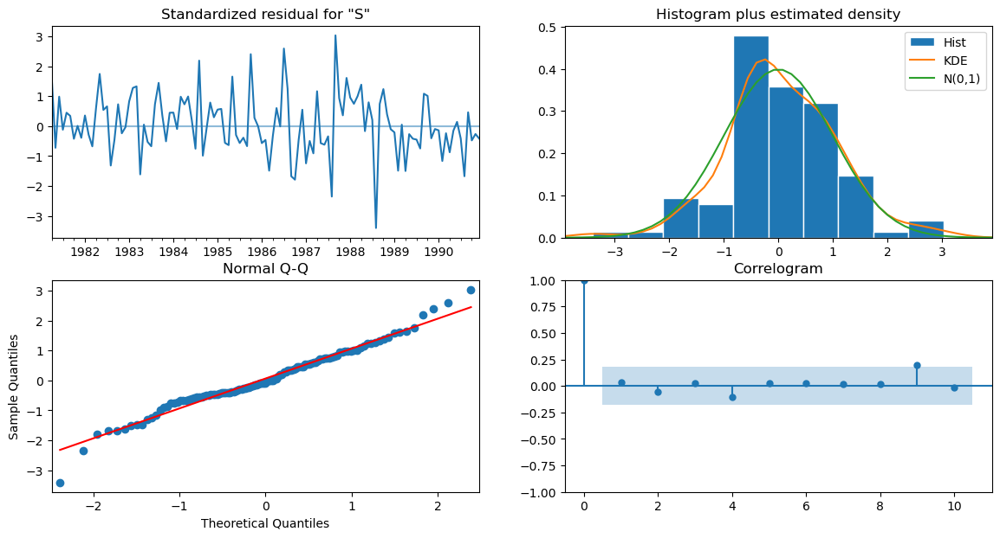

In [678]:
results_auto_SARIMA_spark_log.plot_diagnostics()
plt.show()

In [680]:
predicted_auto_SARIMA_spark_log = results_auto_SARIMA_spark_log.get_forecast(steps=len(SARIMA_test['Sparkling']))

In [682]:
predicted_auto_SARIMA_spark_log.summary_frame(alpha=0.05).head()

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-01,3.212029,0.067109,3.080498,3.343560
1991-02-01,3.141306,0.067466,3.009076,3.273536
1991-03-01,3.256284,0.067821,3.123356,3.389211
1991-04-01,3.226731,0.068175,3.093110,3.360352
1991-05-01,3.195785,0.068527,3.061474,3.330097


In [684]:
spark_forecasted_log = predicted_auto_SARIMA_spark_log.predicted_mean
SARIMA_test['spark_forecasted_log'] = np.power(10, predicted_auto_SARIMA_spark_log.predicted_mean)
SARIMA_test.head()

,Sparkling,spark_forecasted,spark_forecasted_log
YearMonth,,,
1991-01-01,1902,1460.244613,1629.404149
1991-02-01,2049,1392.437155,1384.541742
1991-03-01,1874,1743.201695,1804.196824
1991-04-01,1279,1650.066914,1685.508515
1991-05-01,1432,1522.656022,1569.586986


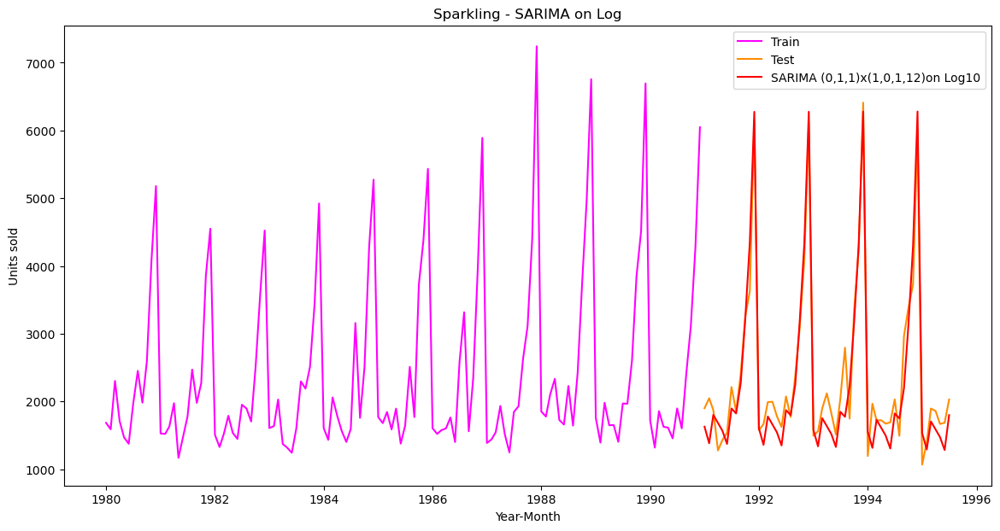

In [686]:
plt.plot(SARIMA_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(SARIMA_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['spark_forecasted_log'], color='red', label='SARIMA (0,1,1)x(1,0,1,12)on Log10')
plt.ylabel('Units sold')
plt.xlabel('Year-Month')
plt.title('Sparkling - SARIMA on Log')
plt.legend(loc='best');

In [688]:
rmse_SARIMA_auto_model_log = metrics.mean_squared_error(SARIMA_test['Sparkling'],SARIMA_test['spark_forecasted_log'],squared=False)
print("For Auto-SARIMA_log Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SARIMA_auto_model_log))

For Auto-SARIMA_log Model forecast on the Test Data, RMSE is 336.811


In [690]:
resultsDf_11 = pd.DataFrame({'Test RMSE': [rmse_SARIMA_auto_model_log]}
                           ,index=['Auto_SARIMA_log(0, 1, 1)*(1, 0, 1, 12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_11])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


#### MANUAL ARIMA MODEL:

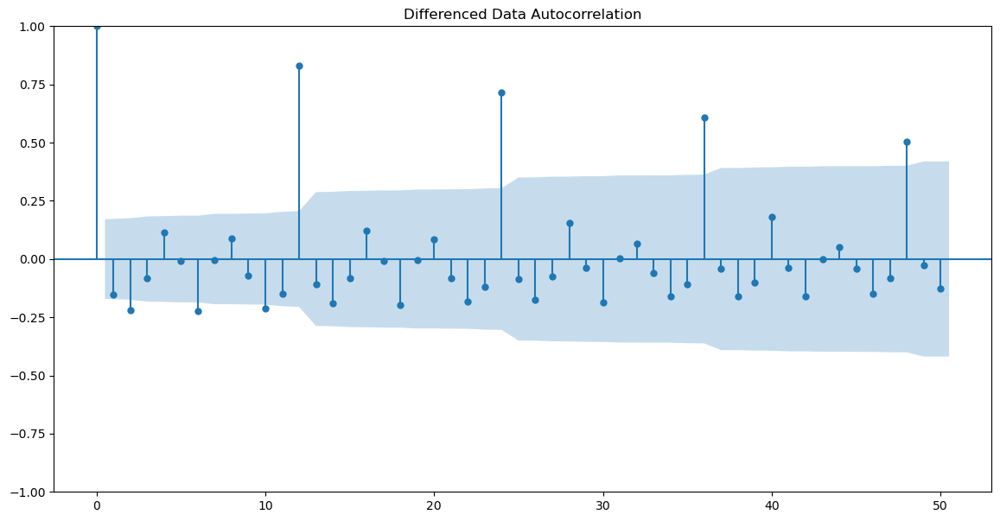

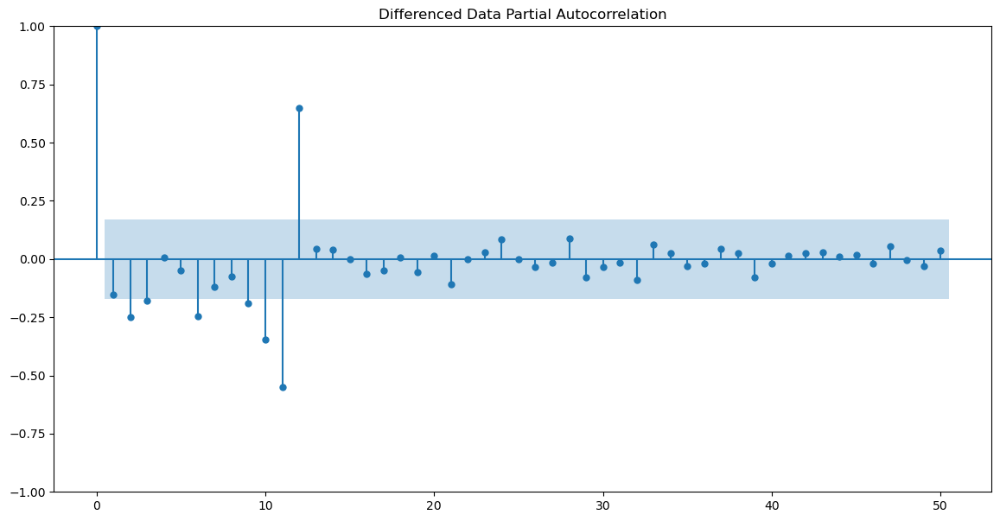

In [692]:
plot_acf(train_spark['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(train_spark['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

In [694]:
manual_ARIMA = ARIMA(train_spark['Sparkling'].astype('float64'), order=(0,1,0))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(0, 1, 0)   Log Likelihood               -1132.832
Date:                Sat, 14 Sep 2024   AIC                           2267.663
Time:                        20:36:34   BIC                           2270.538
Sample:                    01-01-1980   HQIC                          2268.831
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.885e+06   1.29e+05     14.658      0.000    1.63e+06    2.14e+06
Ljung-Box (L1) (Q):                   3.07   Jarque-Bera (JB):               198.83
Prob(Q):                              0.08   Pr

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Harsh Patel\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [698]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test_spark['Sparkling']))

# Calculate RMSE
rmse_arima_manual_model = metrics.mean_squared_error(test_spark['Sparkling'], predicted_manual_ARIMA, squared=False)
print("For Manual-ARIMA Model forecast on the Test Data, RMSE is %3.3f" % rmse_arima_manual_model)

For Manual-ARIMA Model forecast on the Test Data, RMSE is 3864.279


In [700]:
resultsDf_12 = pd.DataFrame({'Test RMSE': [rmse_arima_manual_model]}
                           ,index=['Manual_ARIMA(0,1,0)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_12])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


#### MANUAL SARIMA MODEL:

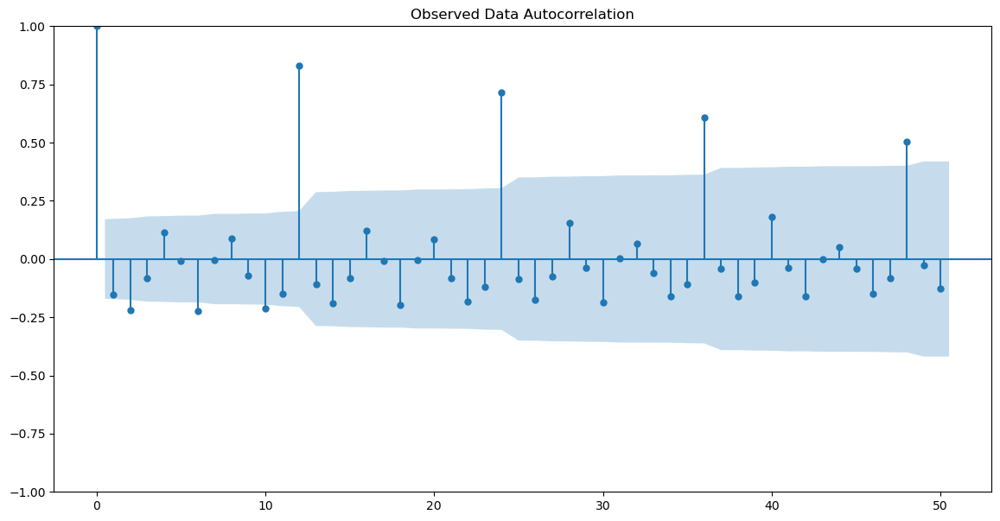

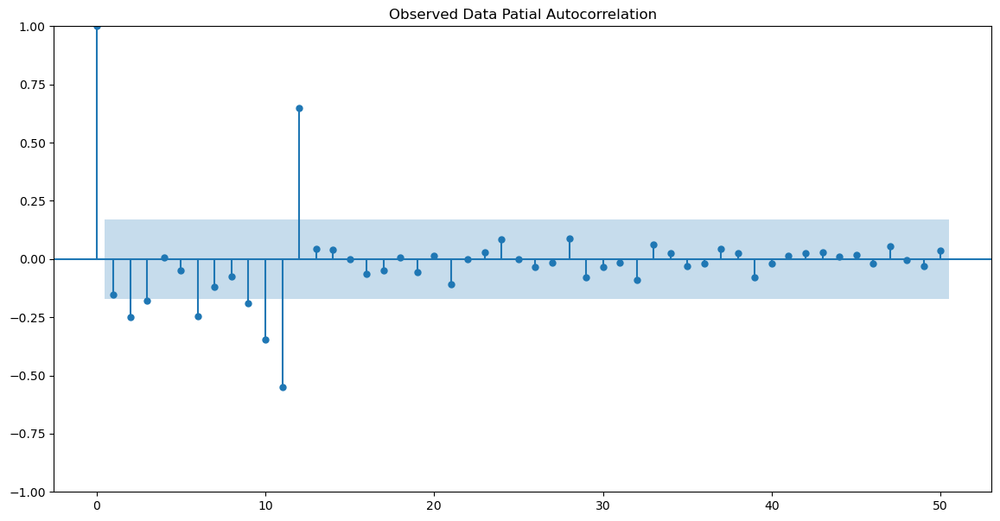

In [702]:
plot_acf(SARIMA_train['Sparkling'].diff().dropna(),lags=50,title='Observed Data Autocorrelation')
plot_pacf(SARIMA_train['Sparkling'].diff().dropna(),lags=50,title='Observed Data Patial Autocorrelation')
plt.show()

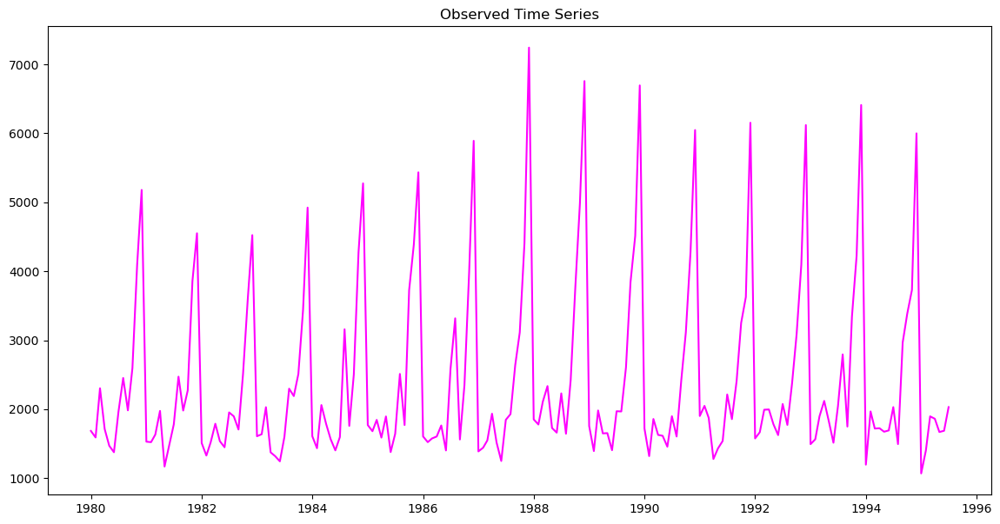

In [704]:
plt.plot(df_spark['Sparkling'], color = 'magenta')
plt.title ('Observed Time Series');

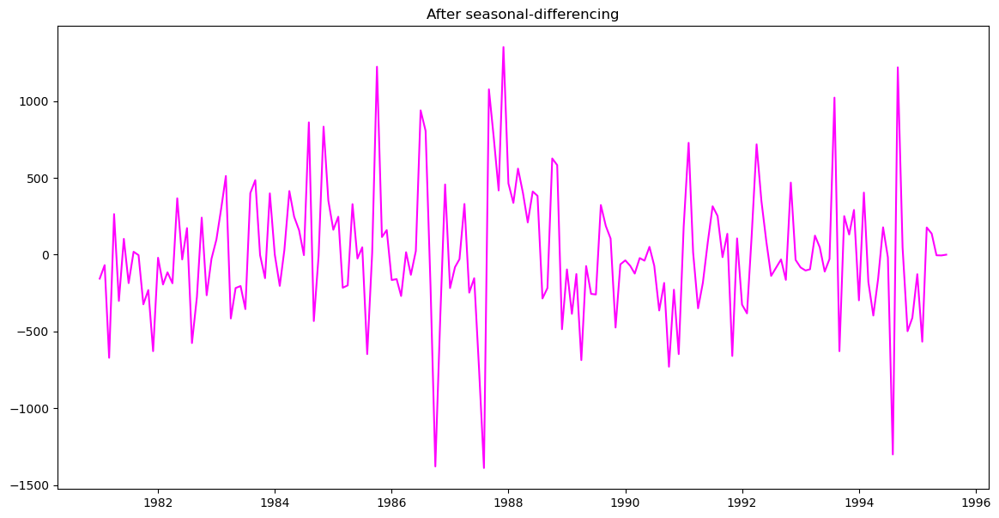

In [706]:
plt.plot(df_spark['Sparkling'].diff(12).dropna(), color = 'magenta')
plt.title ('After seasonal-differencing');

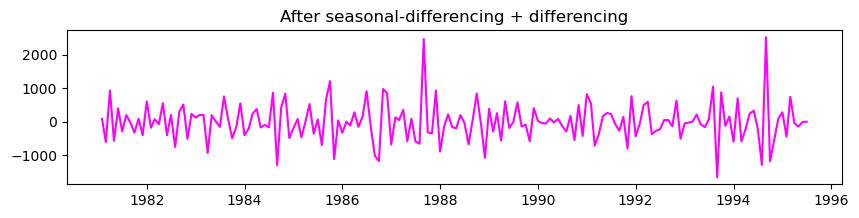

In [708]:
plt.figure(figsize=(10,2))
plt.plot((df_spark['Sparkling'].diff(12).dropna()).diff().dropna(),  color = 'magenta')
plt.title ('After seasonal-differencing + differencing');

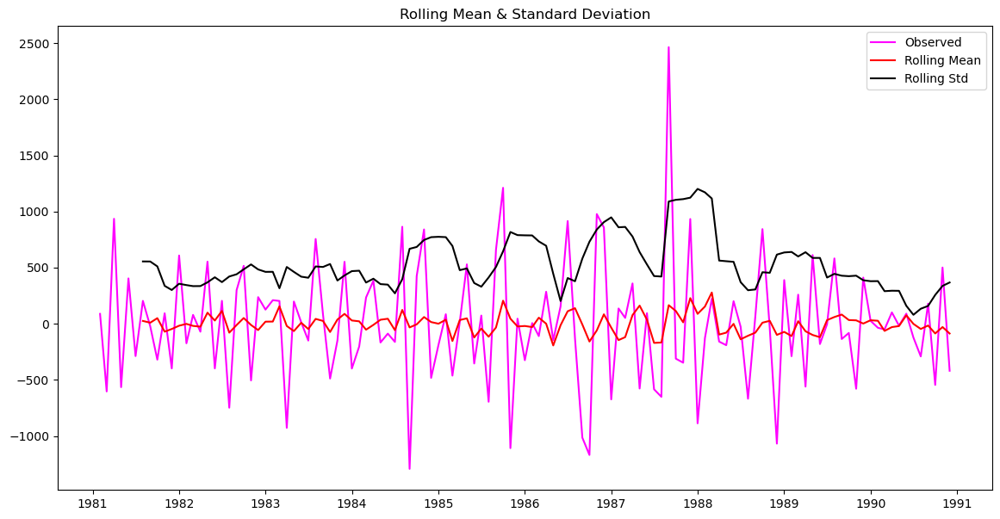

Results of Dickey-Fuller Test:
Test Statistic                  -3.342905
p-value                          0.013066
#Lags Used                      10.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64 



In [710]:
test_stationarity((SARIMA_train['Sparkling'].diff(12).dropna()).diff().dropna(), 'magenta')

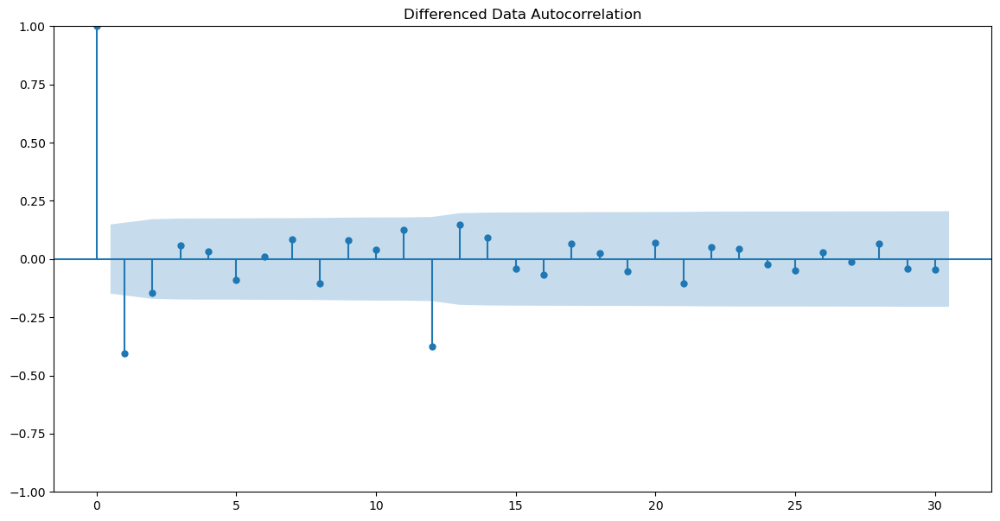

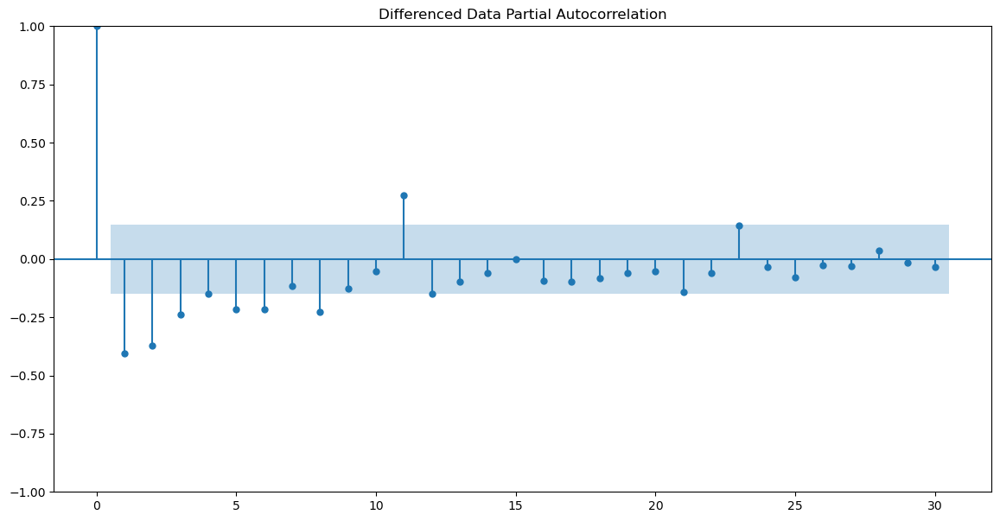

In [712]:
plot_acf((df_spark['Sparkling'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Autocorrelation')
plot_pacf((df_spark['Sparkling'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Partial Autocorrelation');

In [714]:
manual_SARIMA_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                order=(3, 1, 1),
                                seasonal_order= (1, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_spark = manual_SARIMA_spark.fit(maxiter=1000)
print(results_manual_SARIMA_spark.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood                -693.697
Date:                                 Sat, 14 Sep 2024   AIC                           1403.394
Time:                                         20:39:09   BIC                           1423.654
Sample:                                              0   HQIC                          1411.574
                                                 - 132                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2229      0.130      1.713      0.087      -0.032       0

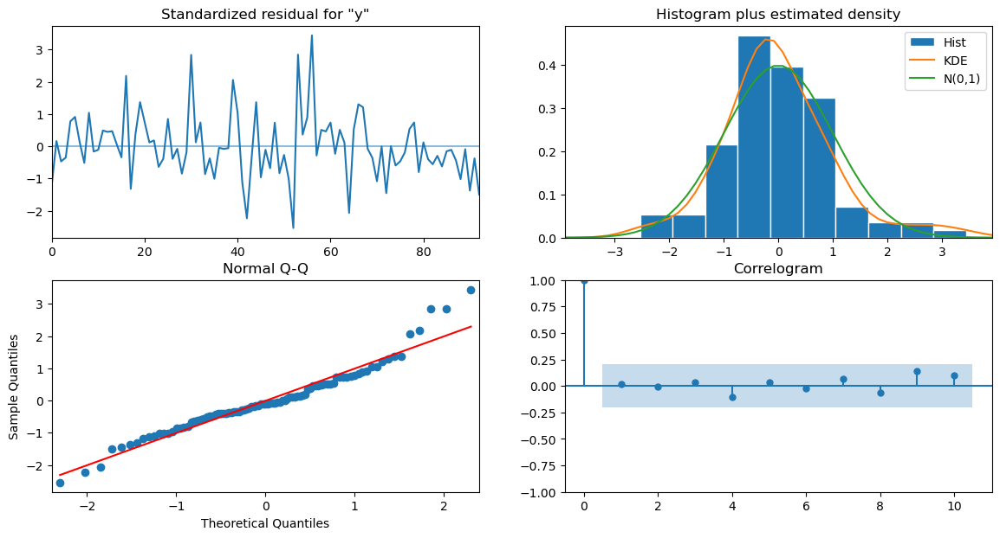

In [716]:
results_manual_SARIMA_spark.plot_diagnostics()
plt.show()

In [718]:
predicted_manual_SARIMA = results_manual_SARIMA_spark.get_forecast(steps=len(SARIMA_test['Sparkling']))

In [720]:
predicted_manual_SARIMA.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1579.910859,416.594512,763.400619,2396.421099
1,1419.155746,429.113919,578.107919,2260.203573
2,1868.145554,429.104560,1027.116070,2709.175037
3,1731.473574,430.973193,886.781638,2576.165510
4,1659.824064,431.906157,813.303551,2506.344577


In [722]:
manual_spark_forecasted = predicted_manual_SARIMA.predicted_mean
SARIMA_test['manual_spark_forecasted'] = predicted_manual_SARIMA.predicted_mean
SARIMA_test.head()

,Sparkling,spark_forecasted,spark_forecasted_log,manual_spark_forecasted
YearMonth,,,,
1991-01-01,1902,1460.244613,1629.404149,1579.910859
1991-02-01,2049,1392.437155,1384.541742,1419.155746
1991-03-01,1874,1743.201695,1804.196824,1868.145554
1991-04-01,1279,1650.066914,1685.508515,1731.473574
1991-05-01,1432,1522.656022,1569.586986,1659.824064


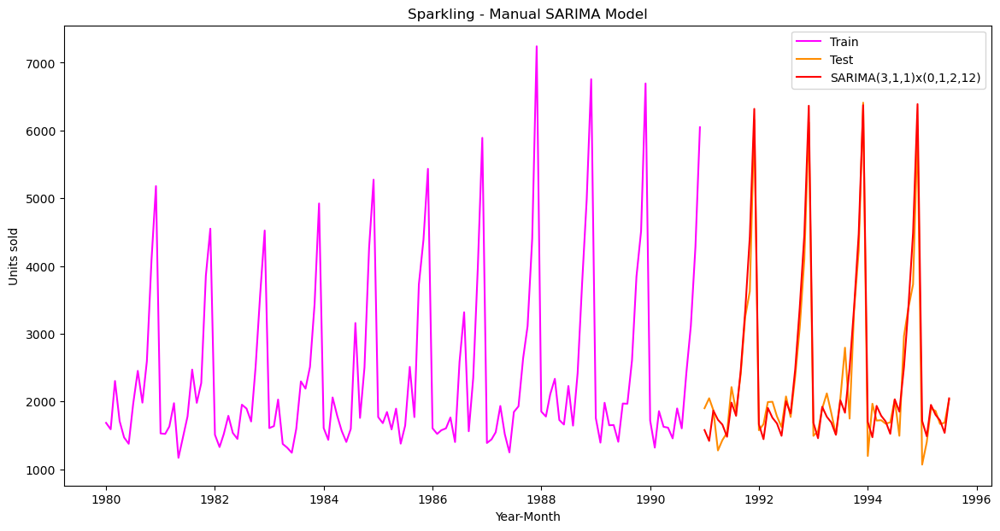

In [724]:
plt.plot(SARIMA_train['Sparkling'], label='Train', color = 'magenta')
plt.plot(SARIMA_test['Sparkling'], label='Test', color = 'darkorange')

plt.plot(SARIMA_test['manual_spark_forecasted'], color='red', label='SARIMA(3,1,1)x(0,1,2,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Sparkling - Manual SARIMA Model')
plt.legend(loc='best');

In [726]:
rmse_SARIMA_manual_model = metrics.mean_squared_error(SARIMA_test['Sparkling'],predicted_manual_SARIMA.predicted_mean,squared=False)
print("For Manual-SARIMA Model forecast on the Test Data, RMSE is %3.3f" %(rmse_SARIMA_manual_model))

For Manual-SARIMA Model forecast on the Test Data, RMSE is 324.107


### FINDING THE BEST MODEL FROM ALL THE OTHERE MODEL FOR FORECASTING:

In [728]:
resultsDf_13 = pd.DataFrame({'Test RMSE': [rmse_SARIMA_manual_model]}
                           ,index=['Manual_SARIMA#(3,1,1)*(1,1,2,12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_13])
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


In [730]:
spark_resultsDf

,Test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverage,1275.081804
2 point TMA,813.400684
4 point TMA,1156.589694
6 point TMA,1283.927428
9 point TMA,1346.278315
"Alpha=0.0496, SES Optimized",1304.927405
"Alpha=0.025,SES iterative",1286.248846
"Alpha=0.68,Beta=0.0, DES Optimized",2007.238526


In [732]:
spark_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE
"Manual_SARIMA#(3,1,1)*(1,1,2,12)",324.107217
"Auto_SARIMA_log(0, 1, 1)*(1, 0, 1, 12)",336.810981
"Auto_SARIMA(1, 1, 2)*(0, 1, 2, 12)",382.576735
"Alpha=0.4,Beta=0.1,gamma=0.3,TES iterative",396.598057
"Alpha=0.11,Beta=0.7,gamma=0.395 TES Optimized",404.286809
2 point TMA,813.400684
4 point TMA,1156.589694
SimpleAverage,1275.081804
6 point TMA,1283.927428
"Alpha=0.025,SES iterative",1286.248846


In [734]:
manual_SARIMA_spark_Full = sm.tsa.statespace.SARIMAX(spark['Sparkling'].values,
                                order=(3, 1, 1),
                                seasonal_order= (1, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_spark_Full = manual_SARIMA_spark_Full.fit(maxiter=1000)
print(results_manual_SARIMA_spark_Full.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  187
Model:             SARIMAX(3, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood               -1094.342
Date:                                 Sat, 14 Sep 2024   AIC                           2204.685
Time:                                         20:41:08   BIC                           2228.662
Sample:                                              0   HQIC                          2214.427
                                                 - 187                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1159      0.086      1.349      0.177      -0.052       0

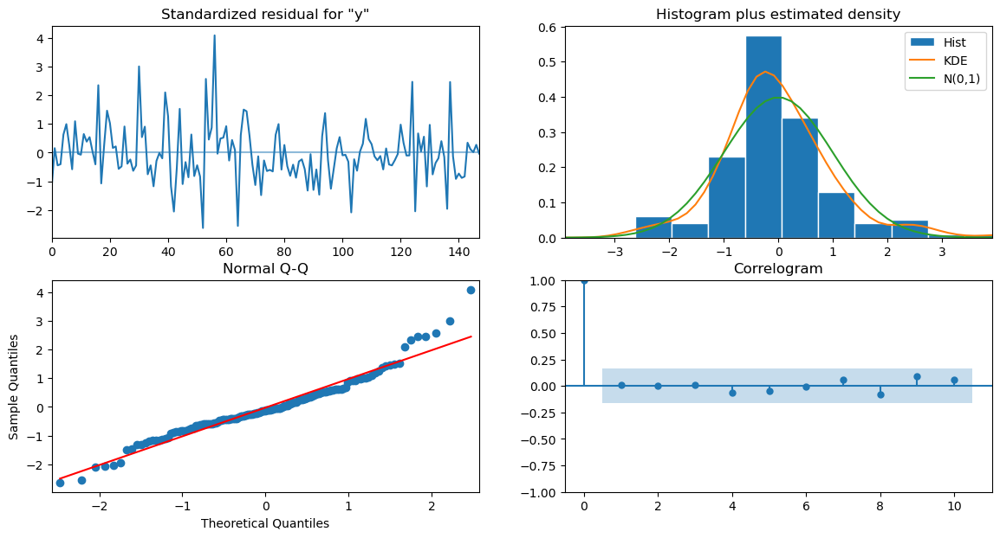

In [736]:
results_manual_SARIMA_spark_Full.plot_diagnostics()
plt.show()

In [738]:
Forecast_manual_SARIMA = results_manual_SARIMA_spark_Full.get_forecast(steps=12)
rmse_spark_Full = metrics.mean_squared_error(spark['Sparkling'],results_manual_SARIMA_spark_Full.fittedvalues,squared=False)
print("For Manual-SARIMA Model forecast on the Entire Data, RMSE is %3.3f" %(rmse_spark_Full))

For Manual-SARIMA Model forecast on the Entire Data, RMSE is 547.591


In [740]:
Forecast_manual_SARIMA.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1870.888601,390.915178,1104.708931,2637.068271
1,2489.623603,395.293830,1714.861932,3264.385273
2,3299.650018,395.322858,2524.831454,4074.468582
3,3934.056636,396.282348,3157.357507,4710.755766
4,6135.396044,396.768695,5357.743690,6913.048397


In [742]:
Forecast_manual_SARIMA_date = Forecast_manual_SARIMA.summary_frame(alpha=0.05).set_index(pd.date_range(start='1995-08-31',end='1996-07-31', freq='M'))

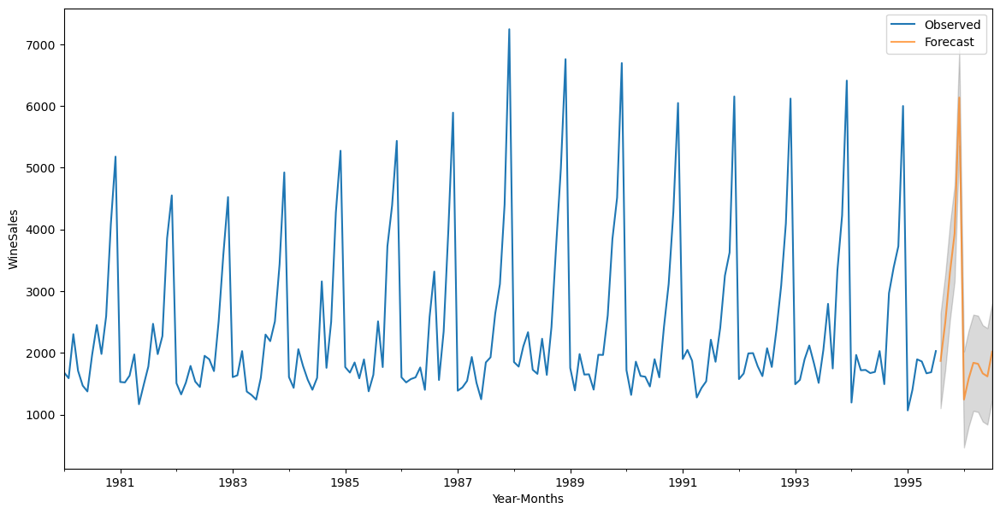

In [744]:
axis = df_spark['Sparkling'].plot(label='Observed')
Forecast_manual_SARIMA_date['mean'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(Forecast_manual_SARIMA_date.index, Forecast_manual_SARIMA_date['mean_ci_lower'], 
                  Forecast_manual_SARIMA_date['mean_ci_upper'], color='k', alpha=.15)
axis.set_xlabel('Year-Months')
axis.set_ylabel('WineSales')
plt.legend(loc='best')
plt.show()

In [746]:
Forecast_manual_SARIMA_date['mean'].sum()

29534.25241590078

In [748]:
Forecast_manual_SARIMA_date['mean'].describe()

count      12.000000
mean     2461.187701
std      1391.118211
min      1245.727215
25%      1656.647698
50%      1855.796933
75%      2692.130206
max      6135.396044
Name: mean, dtype: float64

In [750]:
Forecast_manual_SARIMA_date['mean']

1995-08-31    1870.888601
1995-09-30    2489.623603
1995-10-31    3299.650018
1995-11-30    3934.056636
1995-12-31    6135.396044
1996-01-31    1245.727215
1996-02-29    1584.643760
1996-03-31    1840.705265
1996-04-30    1823.847831
1996-05-31    1668.706103
1996-06-30    1620.472485
1996-07-31    2020.534856
Freq: ME, Name: mean, dtype: float64